In [1]:
# %matplotlib widget
%matplotlib inline

%load_ext autoreload
%autoreload 2

import numpy as np
import matplotlib.pyplot as plt

from qick import *
from qick.helpers import gauss
from tqdm import tqdm_notebook as tqdm

import time
import os
import sys
import scipy as sp
import json
import cProfile
import re 
from timeit import default_timer as timer

from scipy.fft import fft, fftfreq

from slab.instruments.instrumentmanager import InstrumentManager
#from slab.instruments.instrumenttypes import Instrument
from slab.experiment import Experiment
from slab.datamanagement import SlabFile
from slab import get_next_filename, AttrDict
from datetime import datetime
import experiments as meas
import autocalib_config as cfg

import yaml
import config
from datetime import date


# Figure params
plt.rcParams['figure.figsize'] = [10,6]
plt.rcParams.update({'font.size': 14})

import importlib 
importlib.reload(meas)
cfg_path='c:\\_Lib\\python\\rfsoc\\elaine_rfsoc\\slab_rfsoc_expts\\'
tuning_path='C:\\_Data\\LLqub2\\Tuning_2024_05_12\\'

# Results config file:

cfg_file = 'autocalibration_cfg.yml'
cfg_path = cfg_path + cfg_file
cfg_file = cfg_path 
auto_cfg = config.load(cfg_path)

# Connect to instruments 
im = InstrumentManager(ns_address='192.168.137.1') # SLAC lab

soc = QickConfig(im[auto_cfg['aliases']['soc']].get_cfg())
print(soc)
print(auto_cfg['aliases']['soc'])
print(soc.description())

Could not import QickSoc: No module named 'pynq'
Could not load InstrumentManagerWindow
Could not import QickInstrument, try install qick package
Could not load labbrick
Could not load Autonics TM4 Driver
imported experiments.clifford_averager_program
imported experiments.fitting
imported experiments.qram_protocol_timestepped
imported experiments.single_qubit.acstarkshift_spectroscopy
imported experiments.single_qubit.amplitude_rabi
imported experiments.single_qubit.crud
imported experiments.single_qubit.DONOTUSE_ramsey_ef
imported experiments.single_qubit.DONOTUSE_randbench
imported experiments.single_qubit.length_rabi
imported experiments.single_qubit.pulse_probe_ef_spectroscopy
imported experiments.single_qubit.pulse_probe_spectroscopy
imported experiments.single_qubit.pulse_probe_spectroscopy_test
imported experiments.single_qubit.resonator_spectroscopy
imported experiments.single_qubit.rfsoc_tof_calibration
imported experiments.single_qubit.SingleRB
imported experiments.single_qub

In [2]:
def in_rng(val, rng):
    if val<rng[0]:
        val=rng[0]
    elif val>rng[1]:
        val=rng[1]
    return val

### Init point + single evo point T1 continuous with Calib

<Pyro4.core.Proxy at 0x1ae727f12d0; connected IPv4; for PYRO:obj_4c4c76d857454daf8c7b84dcc8481c96@192.168.137.233:37745>


  0%|          | 0/30000 [00:00<?, ?it/s]

  0%|          | 0/30000 [00:00<?, ?it/s]

Saving C:\_Data\LLqub2\T1_cont_2024-05-14-20-59-48\00000_single_shot_qubit3.h5
Unrotated:
Ig -0.5225094919544386 +/- 0.6980392640238761 	 Qg -0.33583438799493764 +/- 0.6839399271080214 	 Amp g 0.6211287349192758
Ie -2.866931838727174 +/- 0.9530155932817196 	 Qe 0.39088772373892605 +/- 0.7139709555728487 	 Amp e 2.8934566491443023
hi
Rotated:
Ig 0.3961381909149065 +/- 0.6980392640238761 	 Qg 0.47800720732847335 +/- 0.6839399271080214 	 Amp g 0.6208191013163987
Ie 2.8607306725296198 +/- 0.9530155932817196 	 Qe 0.447541780448692 +/- 0.7139709555728487 	 Amp e 2.8955264851144005


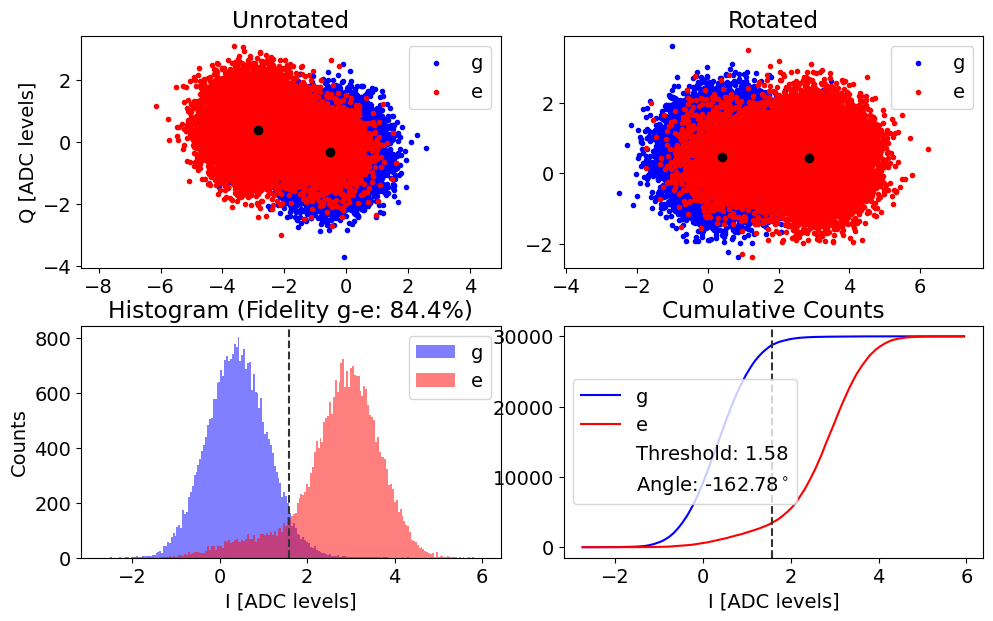

ge fidelity (%): 84.39473991233187
rotation angle (deg): -162.77765223576557
threshold ge: 1.5848247581517838
*Set cfg resonator 3 phase to -162.77765223576557 from -162.69504797909718*
*Set cfg resonator 3 threshold to 1.5848247581517838 from 1.584331896713068*
gauss


  0%|          | 0/4000 [00:00<?, ?it/s]

Saving C:\_Data\LLqub2\T1_cont_2024-05-14-20-59-48\00000_amp_rabi_qubit3.h5
Pi gain from amps data [dac units]: 15279
	Pi/2 gain from amps data [dac units]: 7639
Pi gain from avgi data [dac units]: 15286
	Pi/2 gain from avgi data [dac units]: 7643
Pi gain from avgq data [dac units]: 4088
	Pi/2 gain from avgq data [dac units]: 2044


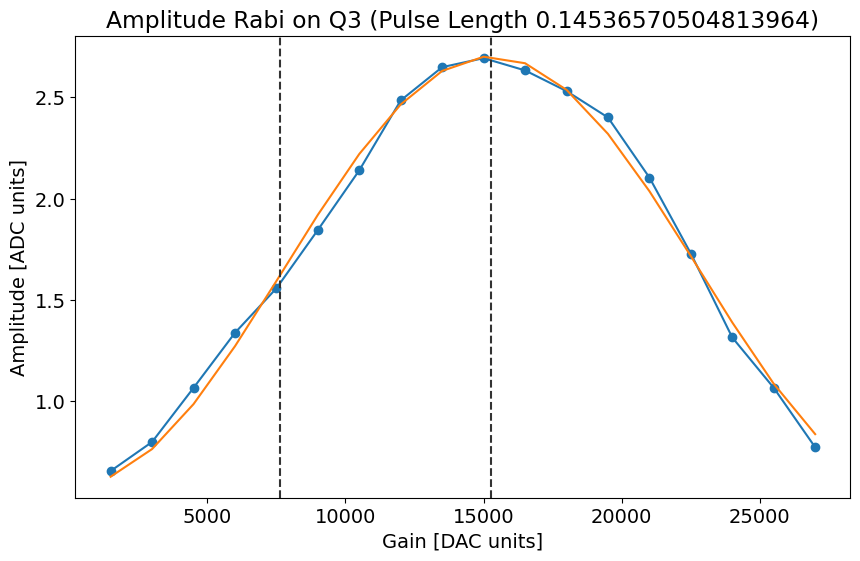

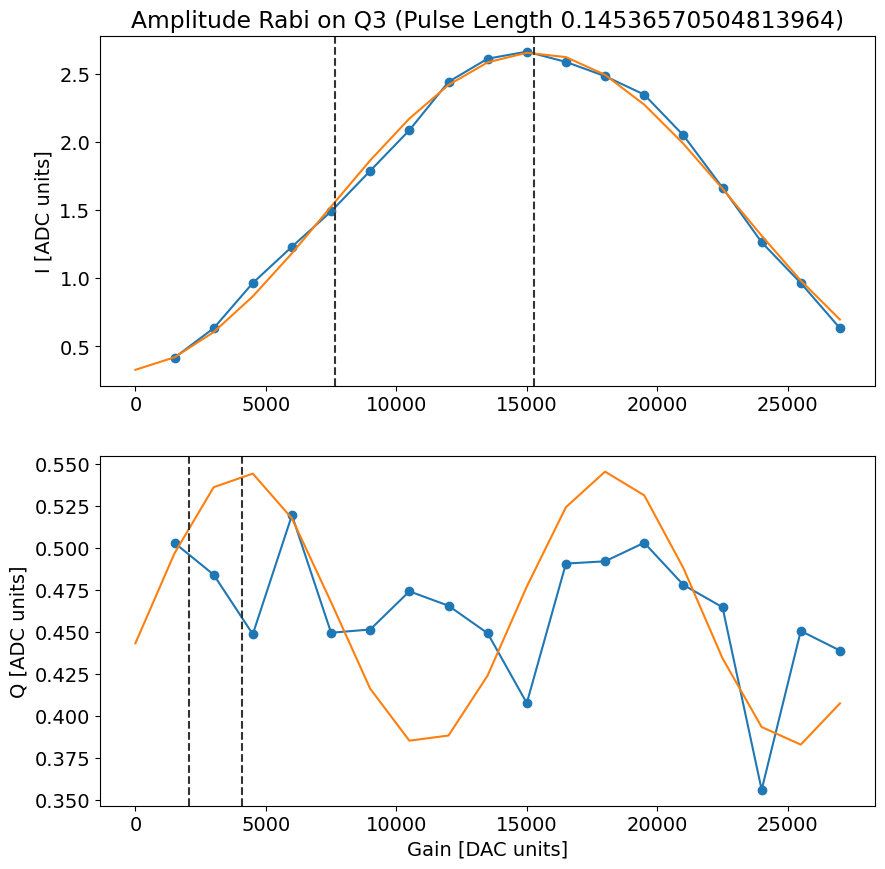

  0%|          | 0/2 [00:00<?, ?it/s]

Saving C:\_Data\LLqub2\T1_cont_2024-05-14-20-59-48\00000_ramsey_qubit3.h5
Current pi pulse frequency: 3548.8103566975005
Fit frequency from amps [MHz]: 0.009610238169892149 +/- 9.299069695270581e-05
T2 Ramsey from fit amps [us]: 328.349504015014
Current pi pulse frequency: 3548.8103566975005
Fit frequency from I [MHz]: 0.009606034985299673 +/- 8.897721129284569e-05
T2 Ramsey from fit I [us]: 331.74248644747195
Fit frequency from Q [MHz]: 0.027631671448872925 +/- 0.0016444747707562892
T2 Ramsey from fit Q [us]: 80.64000000000001
Suggested new pi pulse frequency from fit 3548.8094:



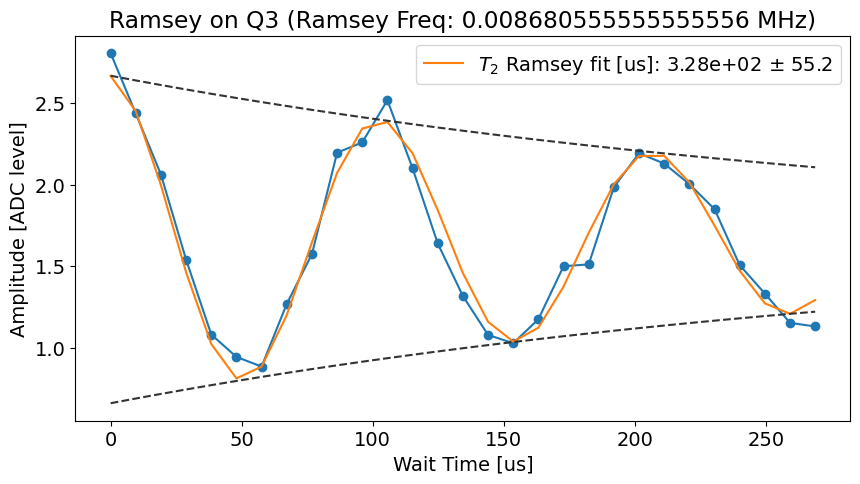

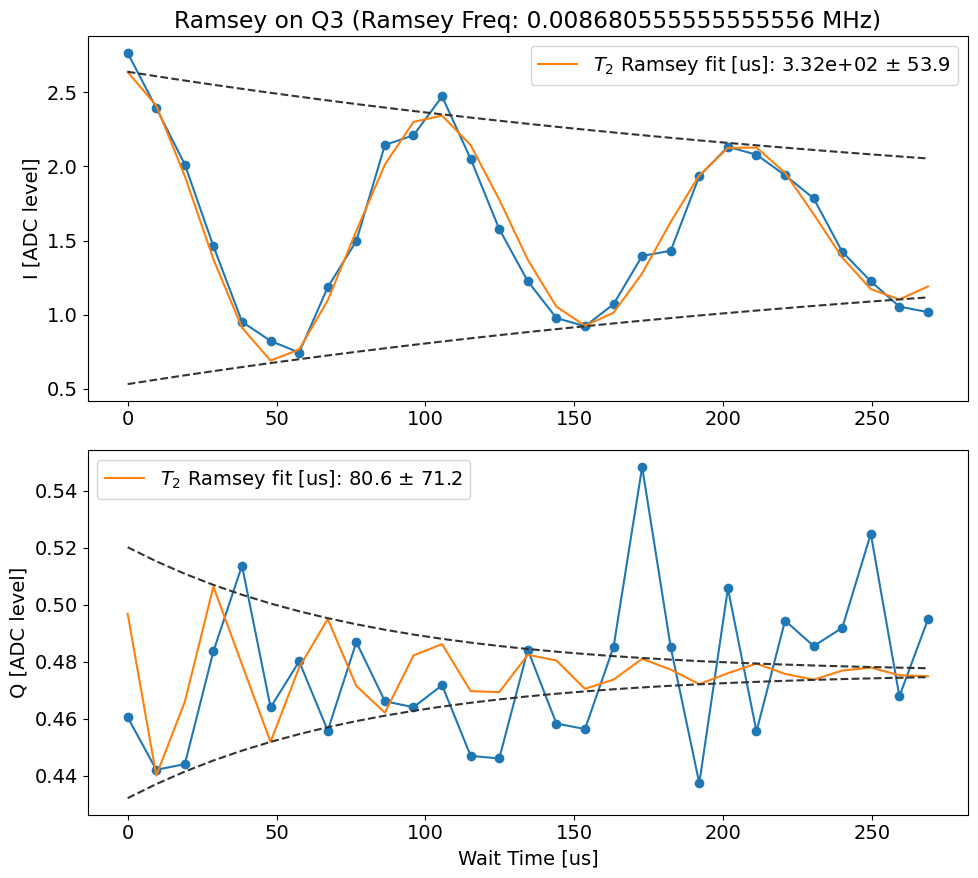

  0%|          | 0/7500 [00:00<?, ?it/s]

c:\Users\slab\anaconda3\envs\slab\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


t1_i error:fit ratio= 0.12512498327000734
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_cont_2024-05-14-20-59-48\00000_t1_qubit3.h5
Fit T1 avgi [us]: 250.99727342974342
Fit T1 avgq [us]: -344.17688025848184


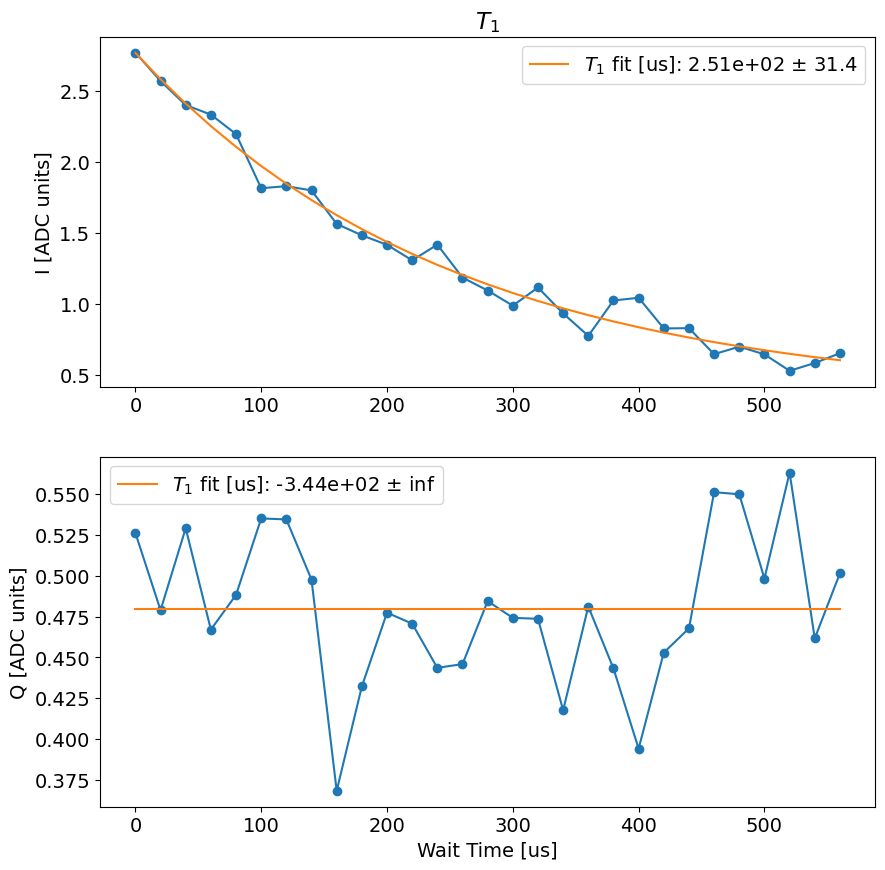

  0%|          | 0/7500 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.08237115047880728
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_cont_2024-05-14-20-59-48\00001_t1_qubit3.h5
Fit T1 avgi [us]: 230.47831450965538
Fit T1 avgq [us]: 100.2751795054451


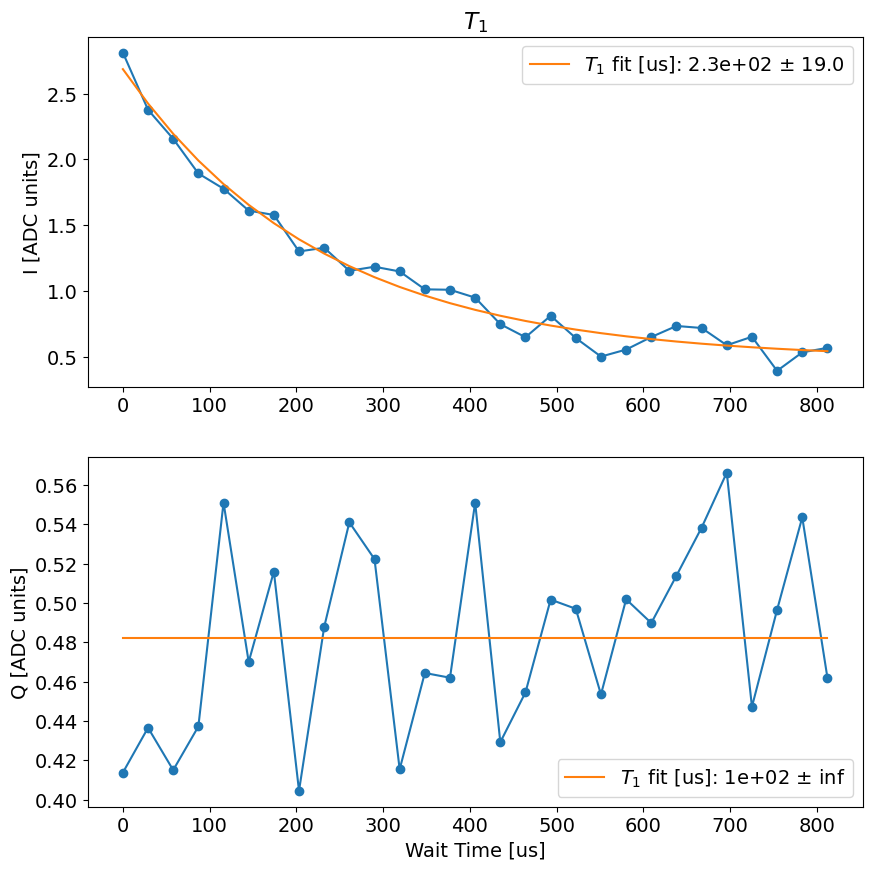

  0%|          | 0/7500 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.14614291477695363
t1_q error:fit ratio= 7.329091504707731
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_cont_2024-05-14-20-59-48\00002_t1_qubit3.h5
Fit T1 avgi [us]: 228.54107463614818
Fit T1 avgq [us]: 834.0080505307544


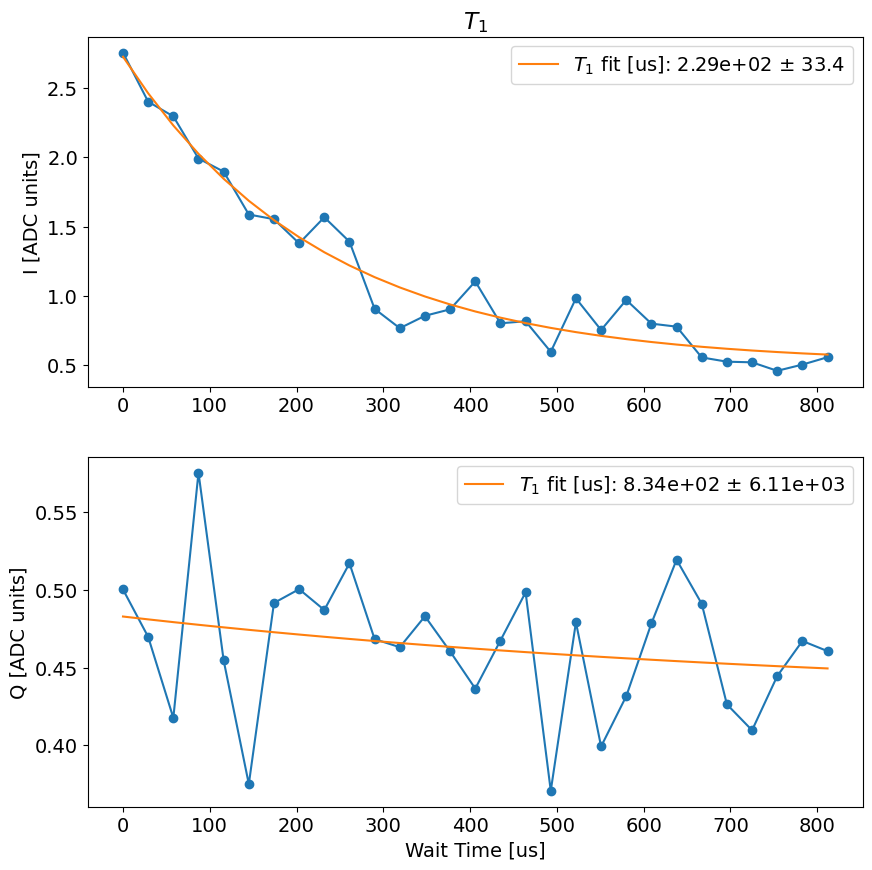

229.50969457290176


  0%|          | 0/6000000 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [37]:

now = datetime.now()
current_time = now.strftime("%Y-%m-%d-%H-%M-%S")
pth='C:\\_Data\\LLqub2\\'
folder_name = f"T1_cont_{current_time}"
os.mkdir(pth + folder_name)
expt_path = pth + folder_name + '\\'
t1_rng = [50,250]
t2_rng = [50,500]
#t2_1 = 200
new_t1 = 600
i=3
while True:
    shot = cfg.make_singleshot(soc, expt_path, cfg_path, i, go=True, im=im, reps=30000)
   
    config.update_readout(cfg_file, 'phase', float(shot.data['angle']), i)
    config.update_readout(cfg_file, 'threshold', float(shot.data['thresholds'][0]), i)
    
    amp_rabi = cfg.make_amprabi(soc, expt_path, cfg_path, i, go=True, im=im, npts=20, reps=200)    
    #t2r=cfg.make_t2r(soc, expt_path, cfg_path, i, go=True, im=im, ramsey_freq=0.025, npts=40, reps=250, step=3.5)
    npts = 30
    t2r=cfg.make_t2r(soc, expt_path, cfg_path, i, go=True, im=im, ramsey_freq=npts/t2_1/8, npts=npts, reps=250, step=t2_1/npts)
    t2_1 = in_rng(t2r.data['fit_avgi'][3], t2_rng)

    npts=30
    t1 = cfg.make_t1(soc, expt_path, cfg_path, i, go=True, im=im, npts=npts, reps=250, span=new_t1)
    t1_1 = t1.data['fit_avgi'][3]

    t1 = cfg.make_t1(soc, expt_path, cfg_path, i, go=True, im=im, npts=npts, reps=250, span=3.5*t1_1)
    t1_2 = t1.data['fit_avgi'][3]

    t1 = cfg.make_t1(soc, expt_path, cfg_path, i, go=True, im=im, npts=npts, reps=250, span=3.5*t1_1)
    t1_3 = t1.data['fit_avgi'][3]
    

    new_t1 =  1/2*(t1_2+t1_3)
    new_t1 = in_rng(new_t1, t1_rng)
    print(new_t1)
    #t1_cont = cfg.make_t1_cont(soc, expt_path, cfg_path, i)
    t1 = cfg.make_t1doub(soc, expt_path, cfg_path, i, reps=3000000, go=True, delay_time=new_t1) 


    # t1_cont.cfg.expt.start = new_t1
    # t1_cont.go(analyze=False, display=False, progress=True, save=True)

### Short T1 scans

<Pyro4.core.Proxy at 0x1ae727f12d0; not connected; for PYRO:obj_4c4c76d857454daf8c7b84dcc8481c96@192.168.137.233:37745>


  0%|          | 0/30000 [00:00<?, ?it/s]

  0%|          | 0/30000 [00:00<?, ?it/s]

Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00000_single_shot_qubit3.h5
Unrotated:
Ig -0.49801120954619416 +/- 0.6981103140047241 	 Qg -0.3353823901645272 +/- 0.689299401678551 	 Amp g 0.6004136178220265
Ie -2.906436449105044 +/- 0.9326755548787657 	 Qe 0.23847405532453445 +/- 0.7016308113054163 	 Amp e 2.916203475025237
hi
Rotated:
Ig 0.40265718181438526 +/- 0.6981103140047241 	 Qg 0.4422995510629175 +/- 0.689299401678551 	 Amp g 0.5981318407651955
Ie 2.890001650271562 +/- 0.9326755548787657 	 Qe 0.4181263239357603 +/- 0.7016308113054163 	 Amp e 2.9200923206878895


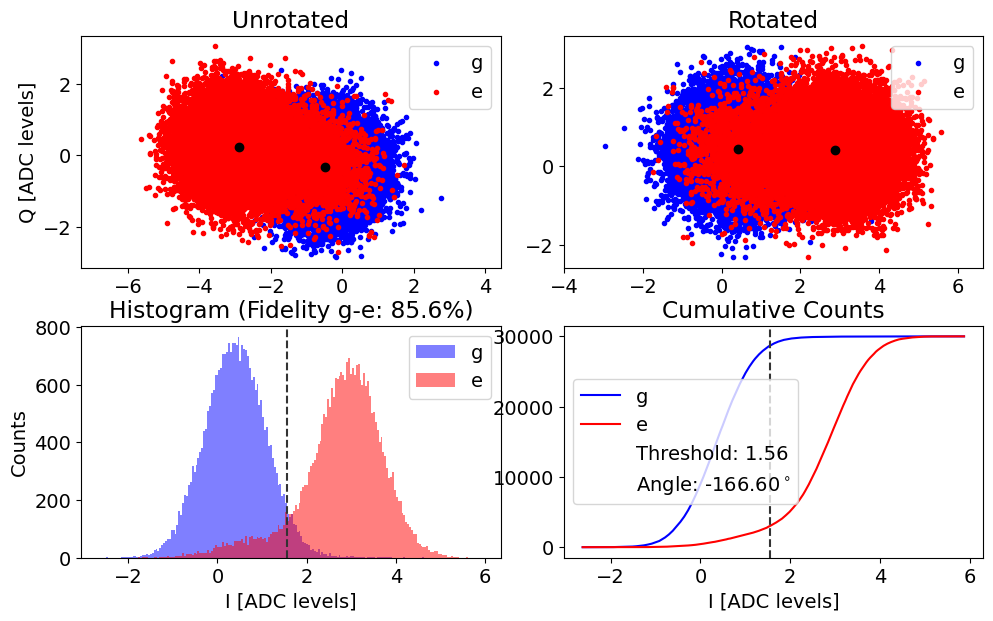

ge fidelity (%): 85.55142585709761
rotation angle (deg): -166.59800499083408
threshold ge: 1.5608665077594086
*Set cfg resonator 3 phase to -166.59800499083408 from -166.69951267470873*
*Set cfg resonator 3 threshold to 1.5608665077594086 from 1.5961724825866521*
gauss


  0%|          | 0/4000 [00:00<?, ?it/s]

Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00000_amp_rabi_qubit3.h5
Pi gain from amps data [dac units]: 15244
	Pi/2 gain from amps data [dac units]: 7622
Pi gain from avgi data [dac units]: 15235
	Pi/2 gain from avgi data [dac units]: 7617
Pi gain from avgq data [dac units]: 3064
	Pi/2 gain from avgq data [dac units]: 1532


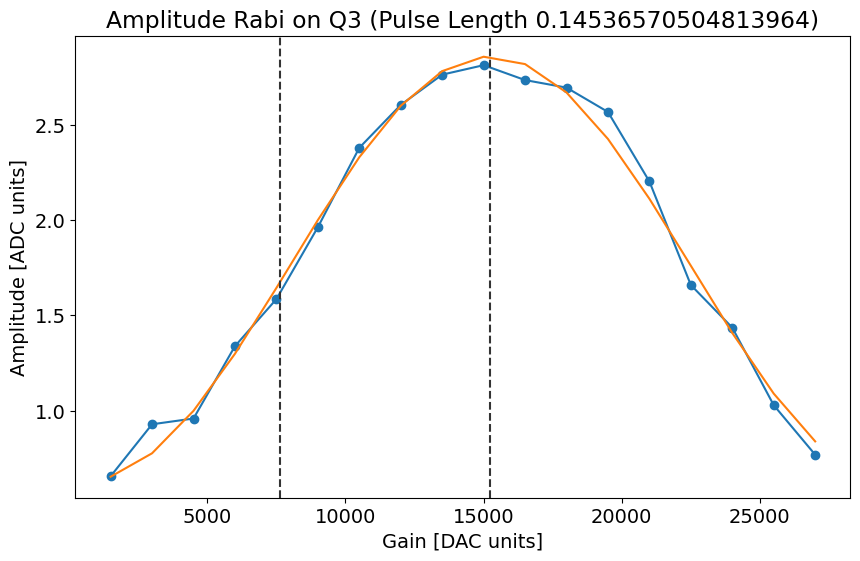

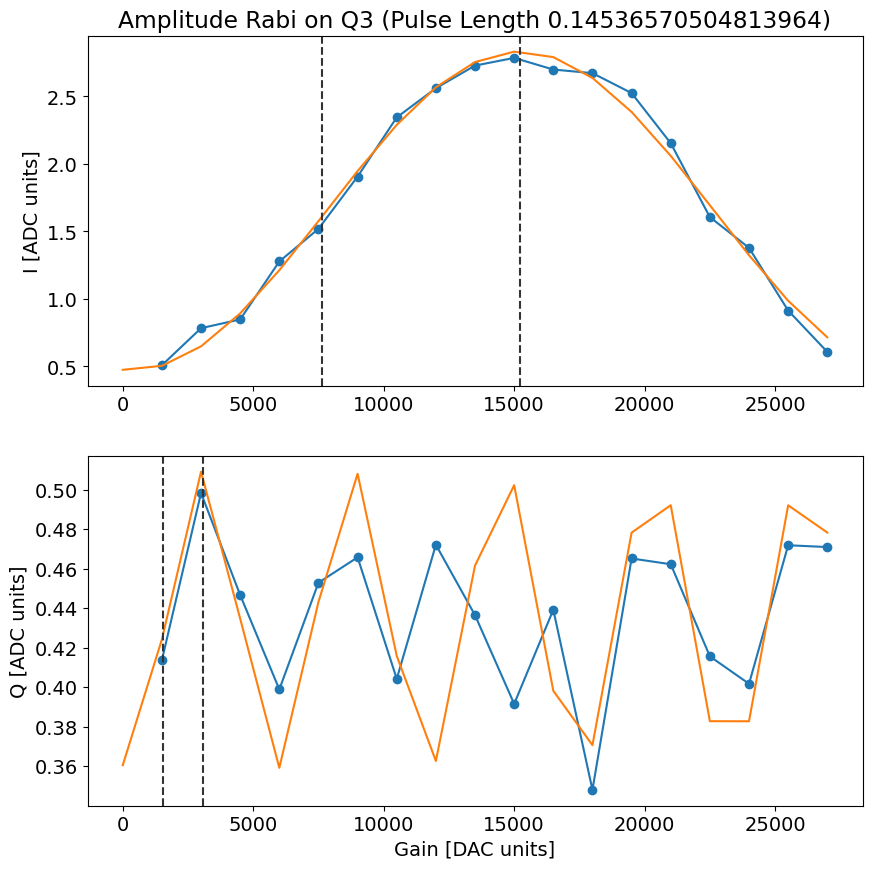

*Set cfg qubit 3 ('pulses', 'pi_ge', 'gain') to 15235 from 15082*


  0%|          | 0/2 [00:00<?, ?it/s]

Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00000_ramsey_qubit3.h5
Current pi pulse frequency: 3548.8100442438426
Fit frequency from amps [MHz]: 0.010766935552319784 +/- 0.00010554832475599757
T2 Ramsey from fit amps [us]: 240.0252865526025
Current pi pulse frequency: 3548.8100442438426
Fit frequency from I [MHz]: 0.010755335033436701 +/- 0.00010577287574116623
T2 Ramsey from fit I [us]: 242.9413122807946
Fit frequency from Q [MHz]: 0.03391646121893509 +/- 0.0009748441371083677
T2 Ramsey from fit Q [us]: 102.51676183565897
Suggested new pi pulse frequency from fit 3548.8095:



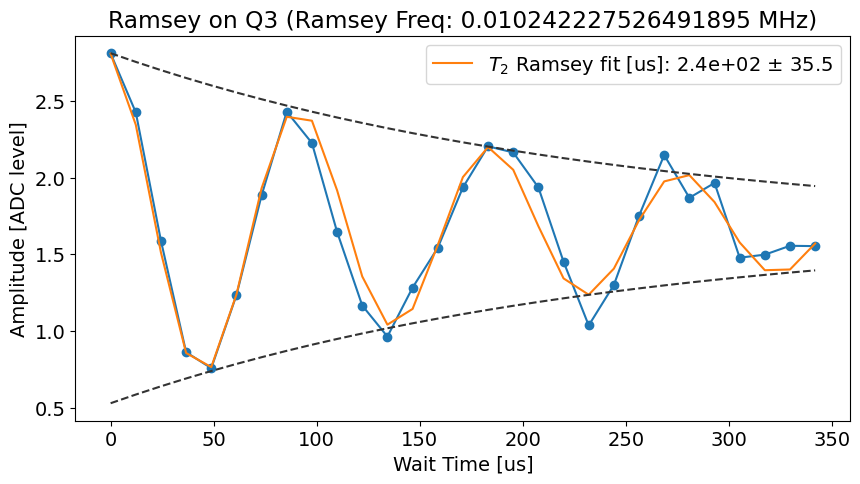

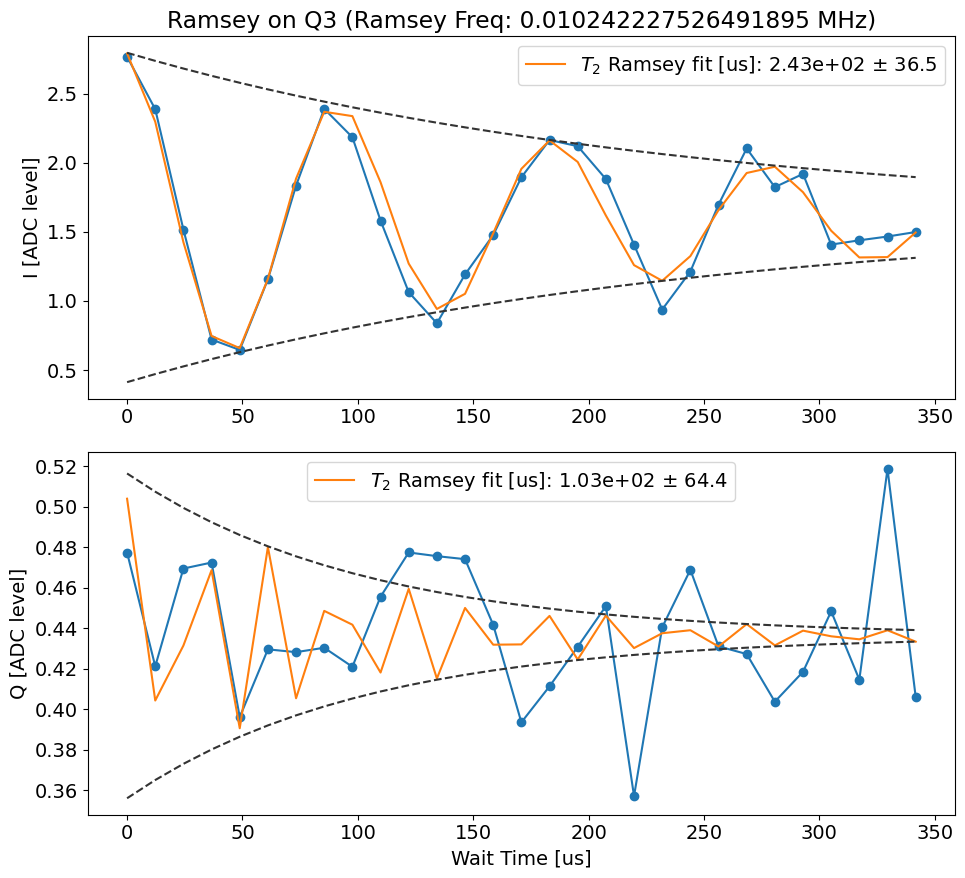

*Set cfg qubit 3 f_ge to 3548.809519535817 from 3548.8100442438426*


  0%|          | 0/6250 [00:00<?, ?it/s]

c:\Users\slab\anaconda3\envs\slab\lib\site-packages\scipy\optimize\_minpack_py.py:881: OptimizeWarning: Covariance of the parameters could not be estimated
  warnings.warn('Covariance of the parameters could not be estimated',


t1_i error:fit ratio= 0.1214670648266674
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00000_t1_qubit3.h5
Fit T1 avgi [us]: 214.60446699991672
Fit T1 avgq [us]: 279.38033847802325


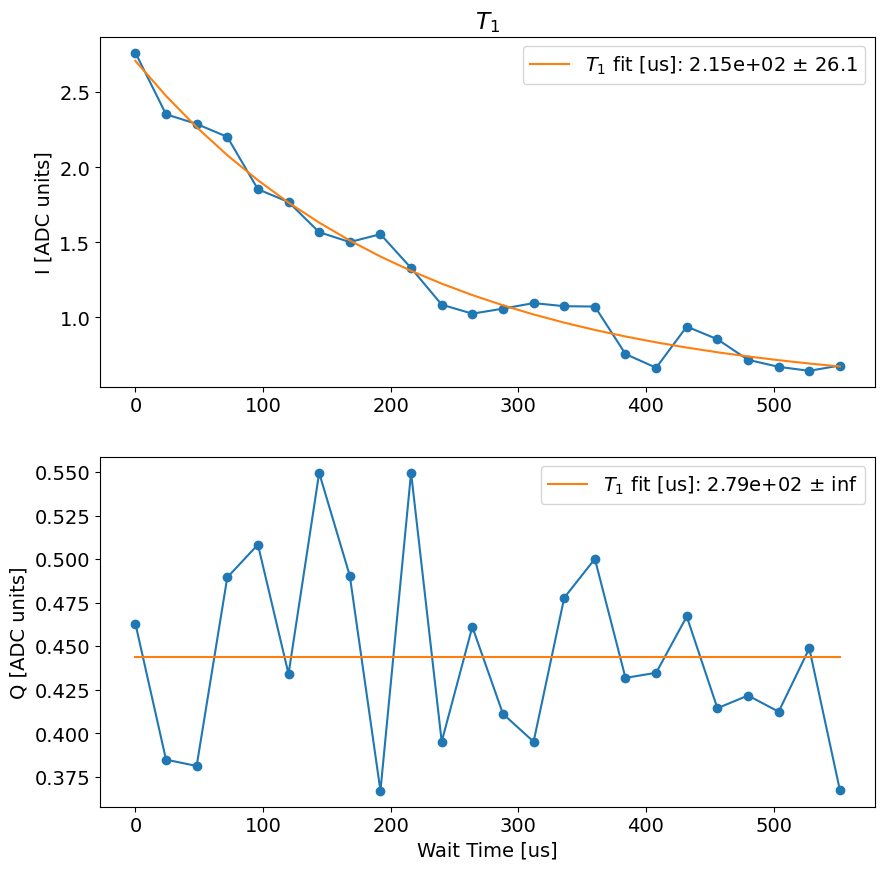

8.719650506973267


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.0
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00001_t1_qubit3.h5
Fit T1 avgi [us]: 185.22544858382125
Fit T1 avgq [us]: -5.1521336659760095


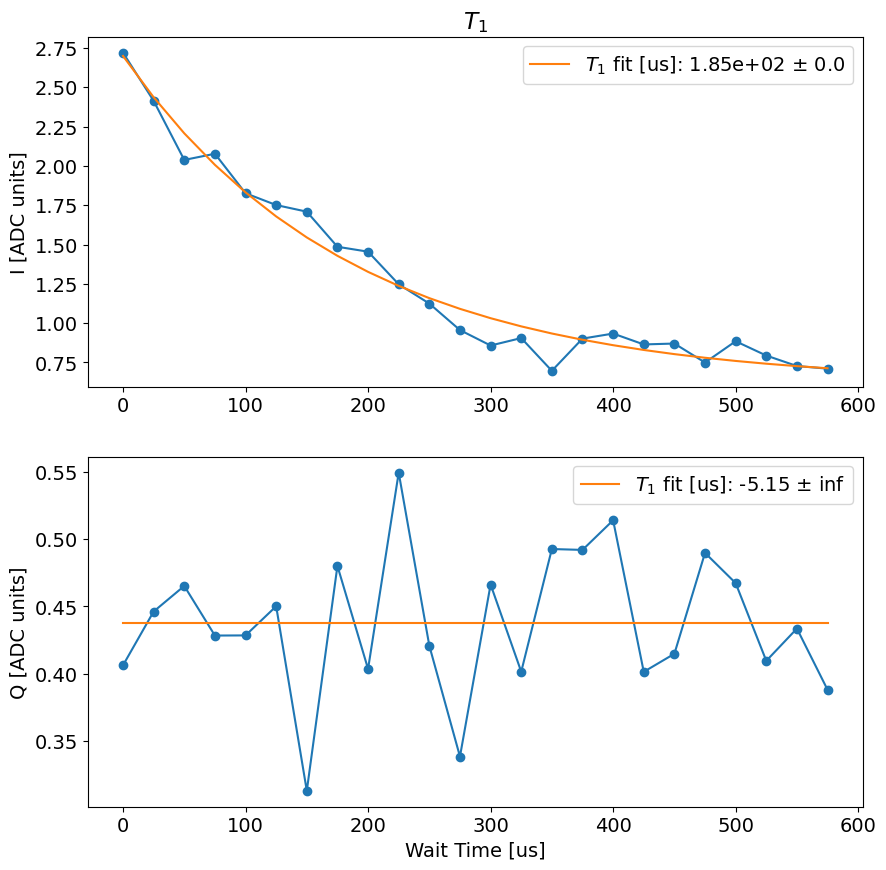

17.561741590499878


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.170427121617699
t1_q error:fit ratio= 1.1413556372305929
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00002_t1_qubit3.h5
Fit T1 avgi [us]: 278.41865949200536
Fit T1 avgq [us]: 29.7305826772024


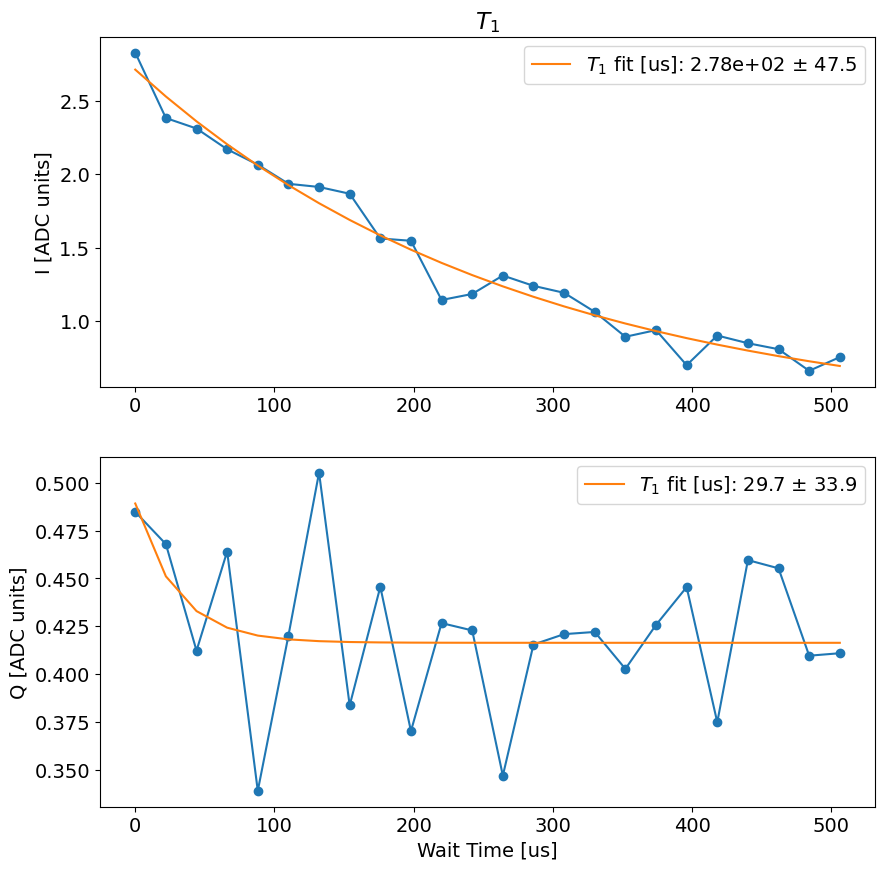

26.146174430847168


  0%|          | 0/6250 [00:00<?, ?it/s]

c:\_Lib\python\rfsoc\elaine_rfsoc\slab_rfsoc_expts\experiments\fitting.py:64: RuntimeWarning: overflow encountered in exp
  return y0 + yscale*np.exp(-(x-x0)/decay)


t1_i error:fit ratio= 0.12189682557593395
t1_q error:fit ratio= 2.281501048363505
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00003_t1_qubit3.h5
Fit T1 avgi [us]: 242.0576733391208
Fit T1 avgq [us]: 172.85303570931313


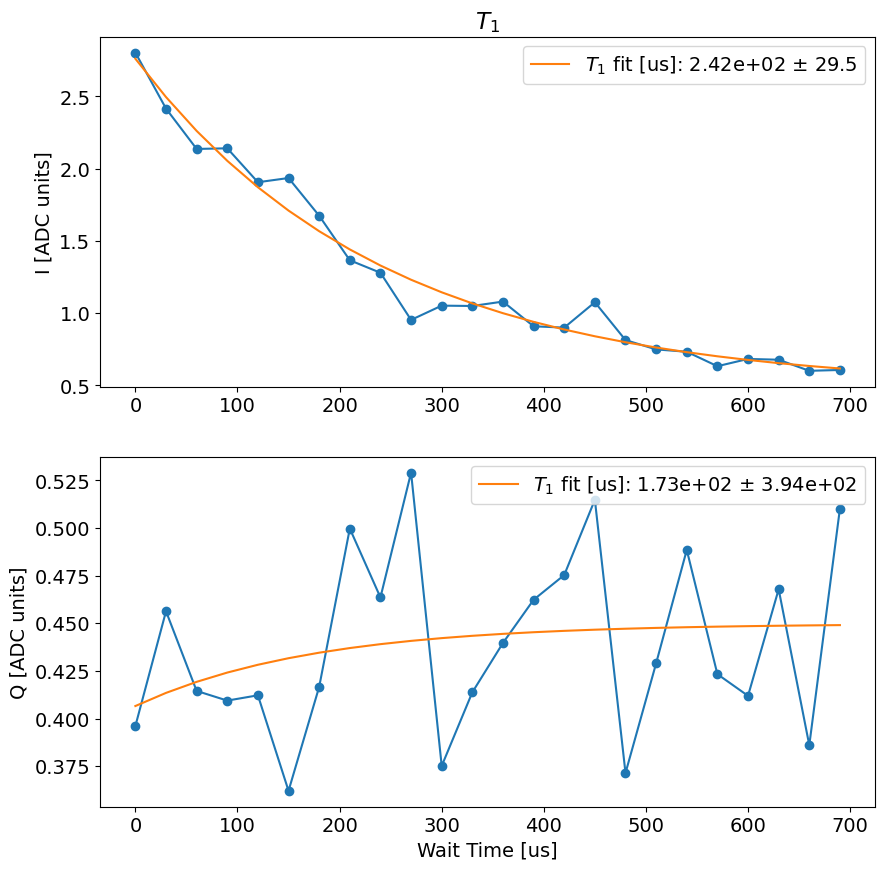

35.377131938934326


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.11658119703974475
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00004_t1_qubit3.h5
Fit T1 avgi [us]: 285.3455415372823
Fit T1 avgq [us]: 26.095546285428853


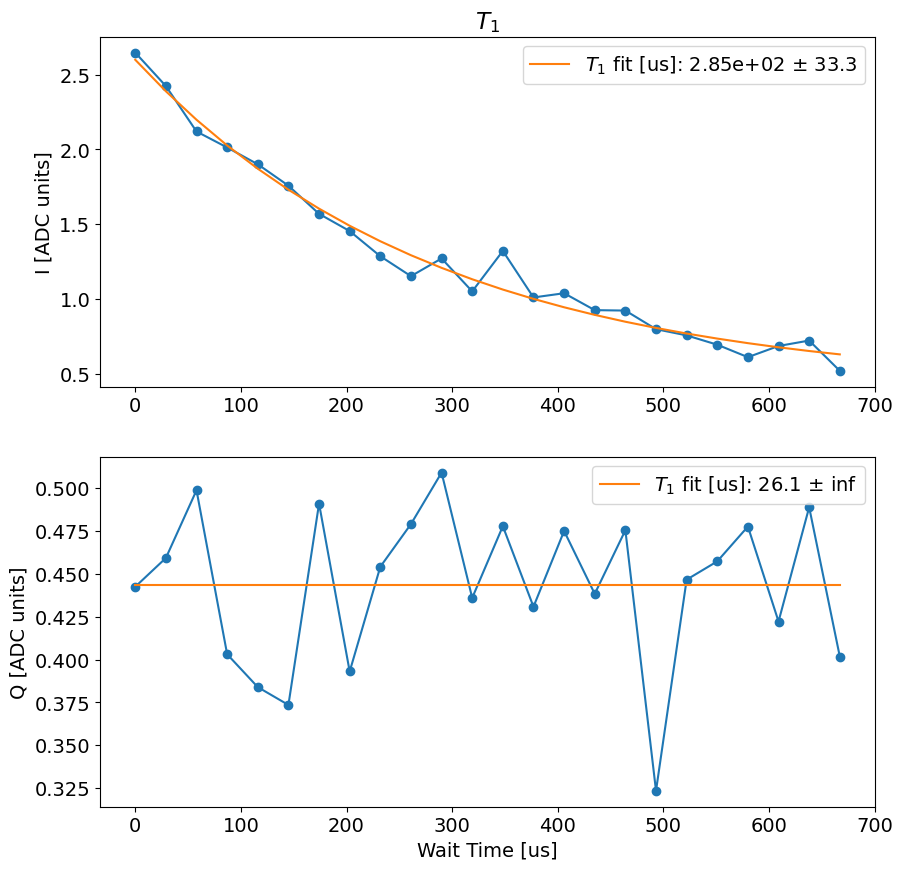

44.50952649116516


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.22076409574094663
t1_q error:fit ratio= 35.045943609629916
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00005_t1_qubit3.h5
Fit T1 avgi [us]: 210.5064833909342
Fit T1 avgq [us]: 1347.4772018462338


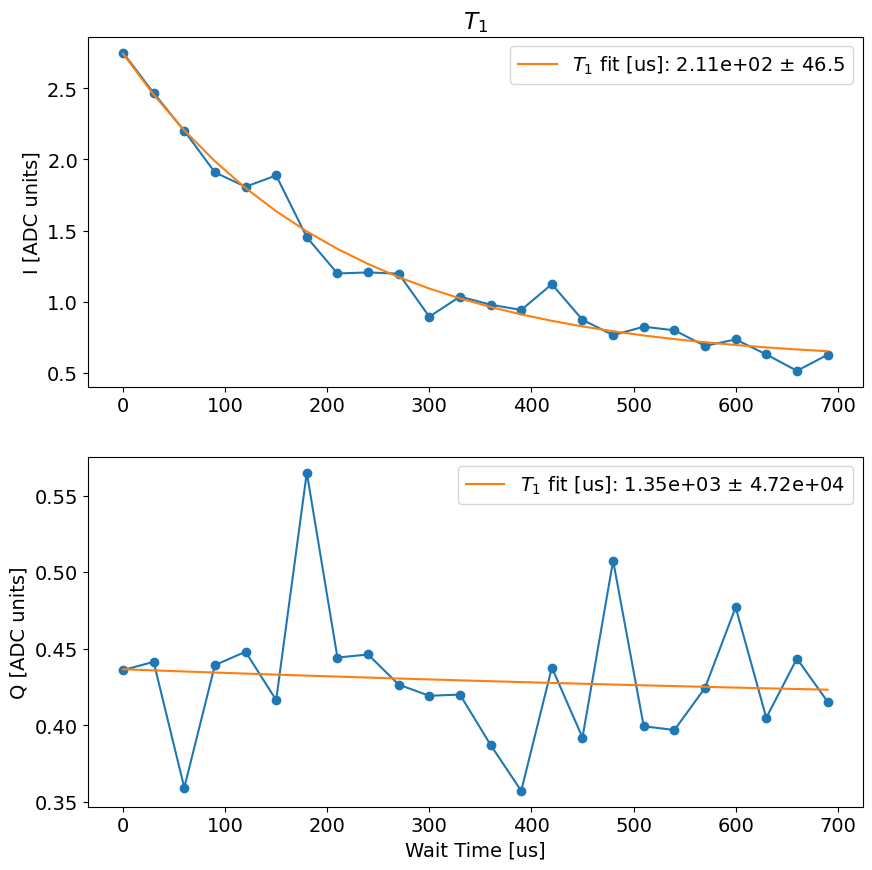

53.68593955039978


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.09820553164818706
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00006_t1_qubit3.h5
Fit T1 avgi [us]: 208.5109987786956
Fit T1 avgq [us]: 155.54925104090452


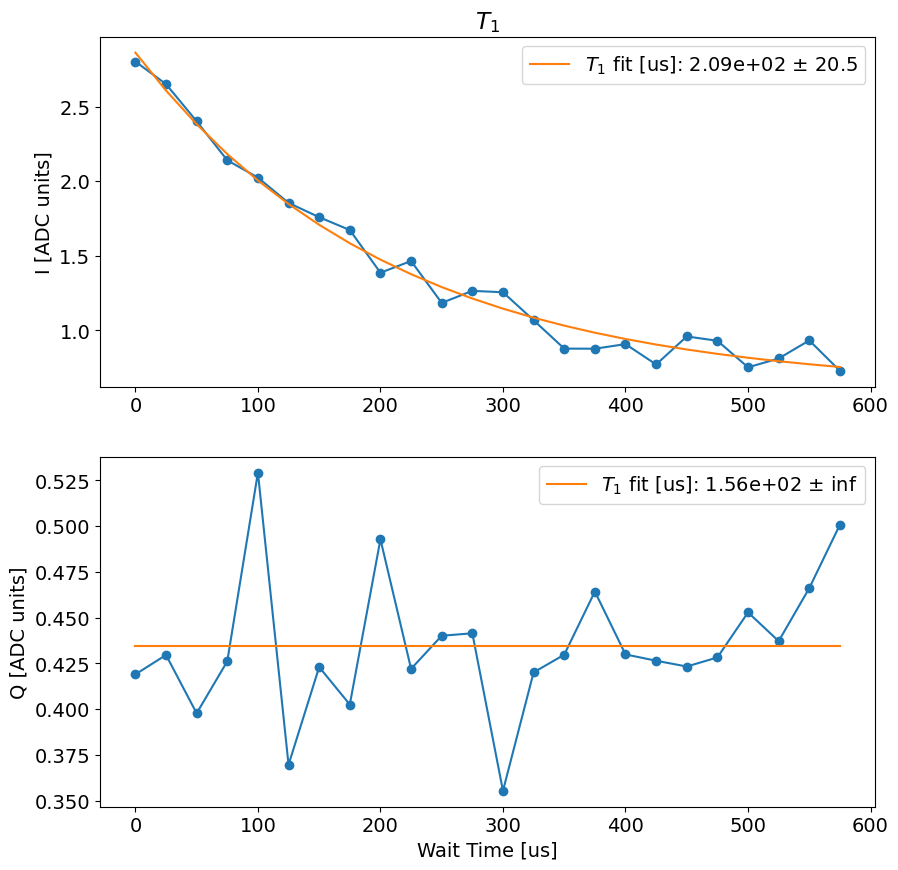

62.498467683792114


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.166483395912775
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00007_t1_qubit3.h5
Fit T1 avgi [us]: 224.49519877471812
Fit T1 avgq [us]: 486.2922426830912


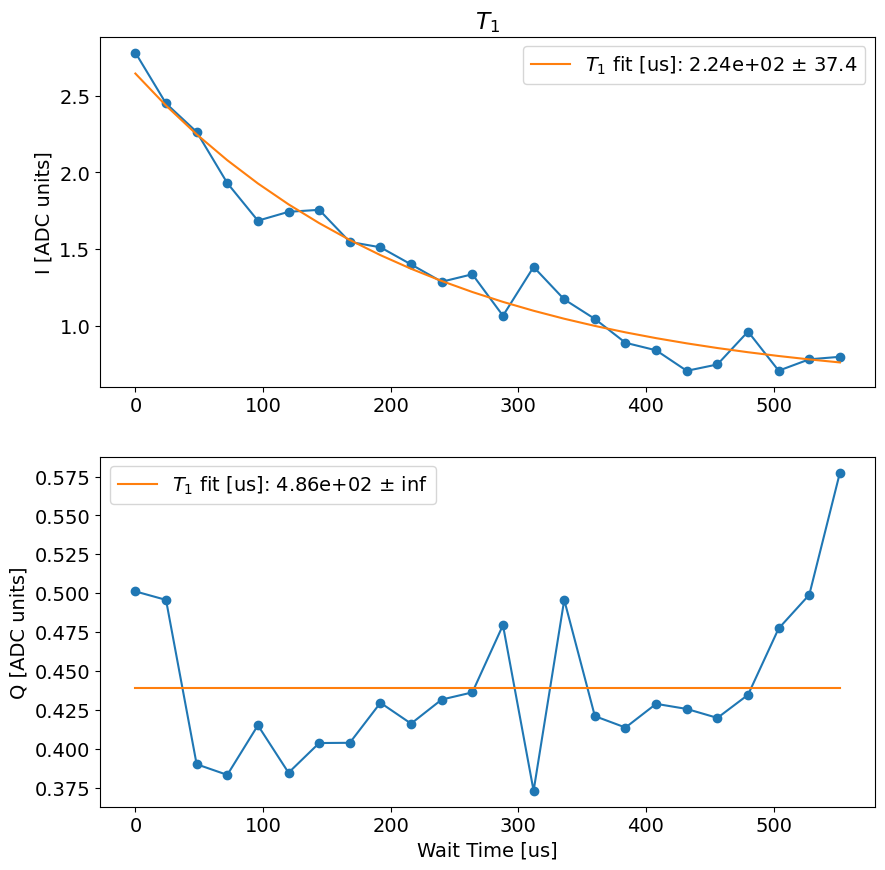

71.21194291114807


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.16497609259933457
t1_q error:fit ratio= 1.5365856617684959
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00008_t1_qubit3.h5
Fit T1 avgi [us]: 243.68610992612872
Fit T1 avgq [us]: 284.2886254106037


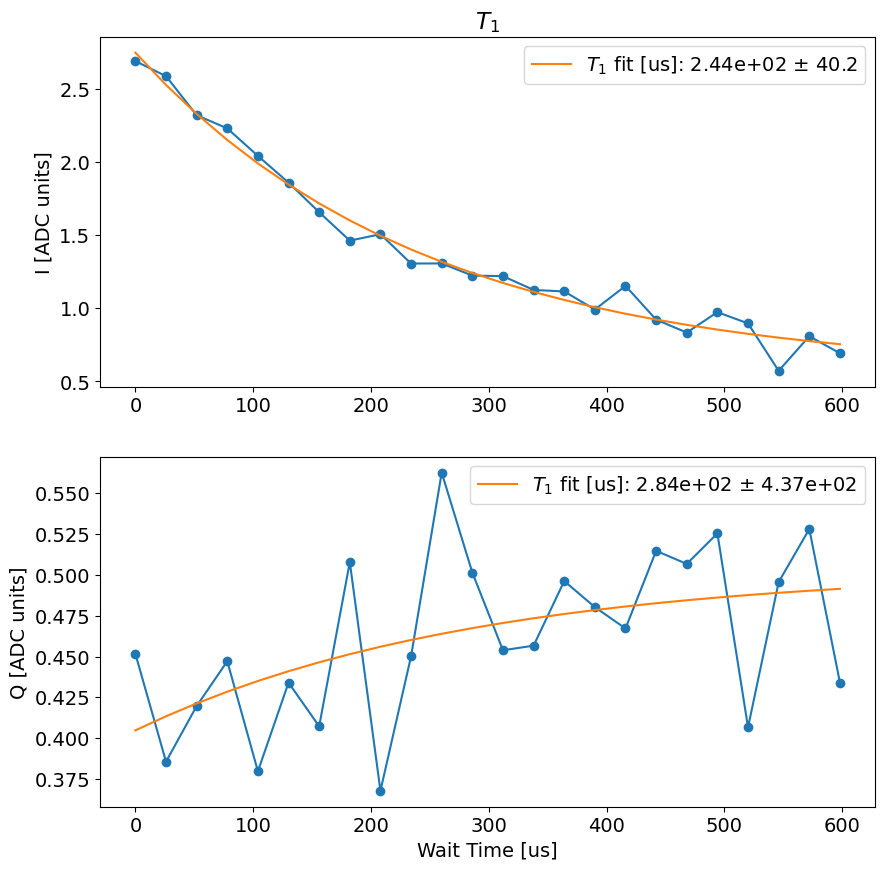

80.11448764801025


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.0
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00009_t1_qubit3.h5
Fit T1 avgi [us]: 274.2996950993853
Fit T1 avgq [us]: 0.16431570598817302


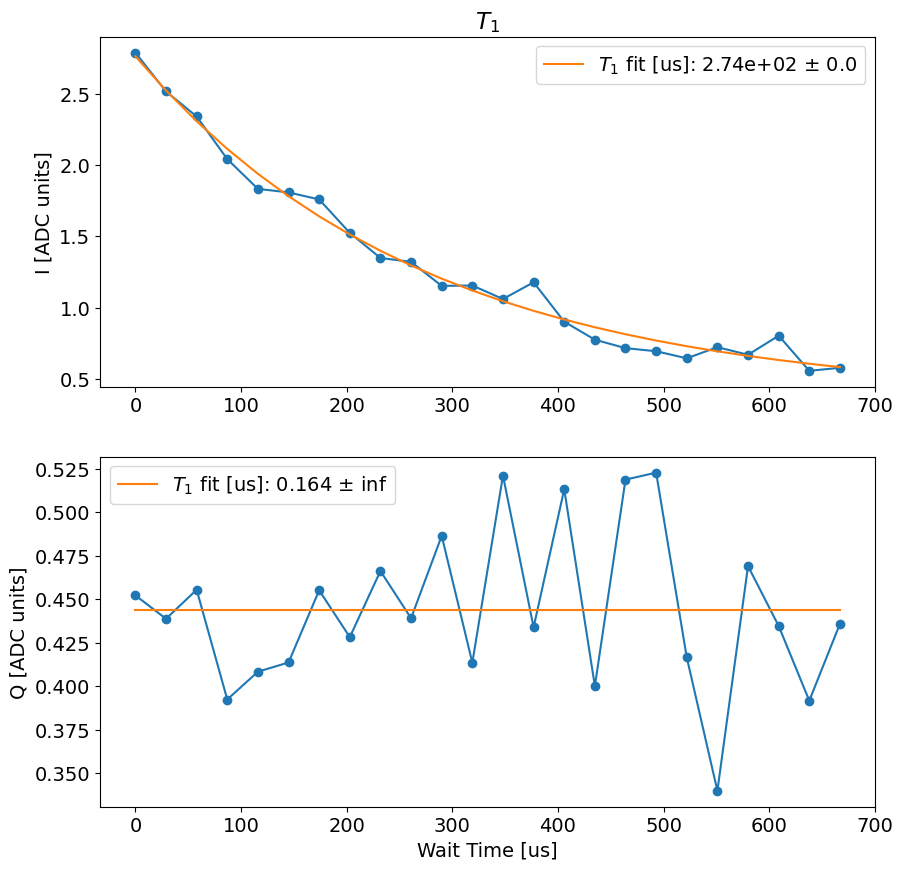

89.24433279037476


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1380757835936901
t1_q error:fit ratio= 2.116640637965812
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00010_t1_qubit3.h5
Fit T1 avgi [us]: 320.38056290191054
Fit T1 avgq [us]: 142.6893385158356


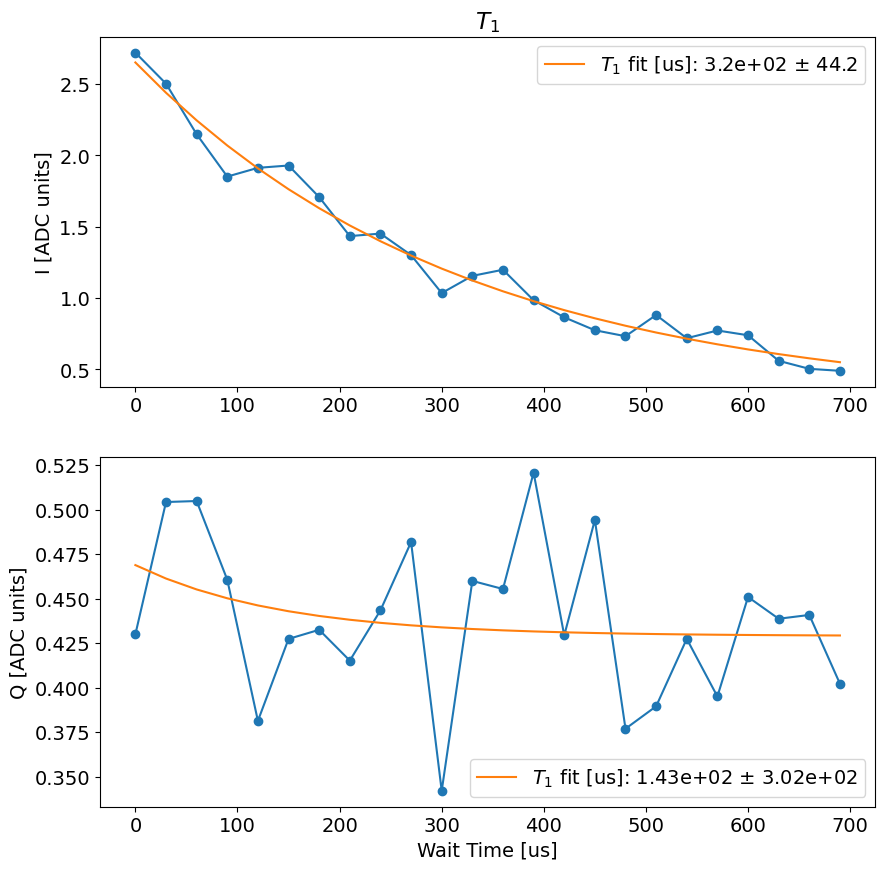

98.81684589385986


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1399820287690373
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00011_t1_qubit3.h5
Fit T1 avgi [us]: 226.99625319150158
Fit T1 avgq [us]: 287.0958046161256


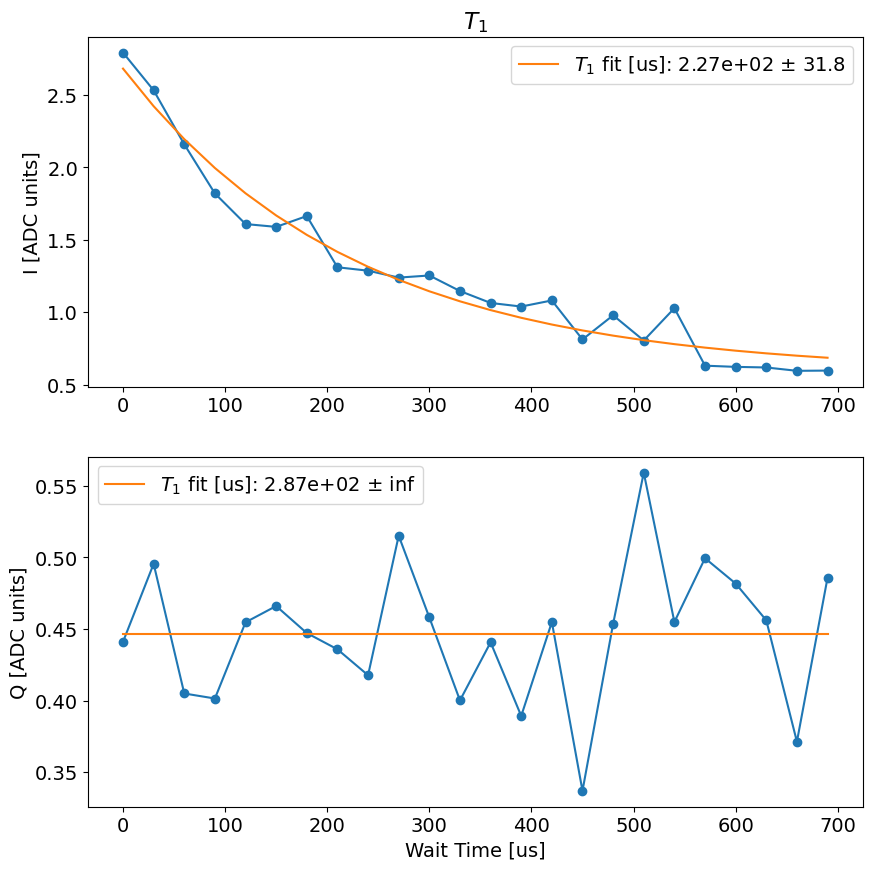

107.98874759674072


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1330059222219358
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00012_t1_qubit3.h5
Fit T1 avgi [us]: 294.2662330242957
Fit T1 avgq [us]: -112.87257028141055


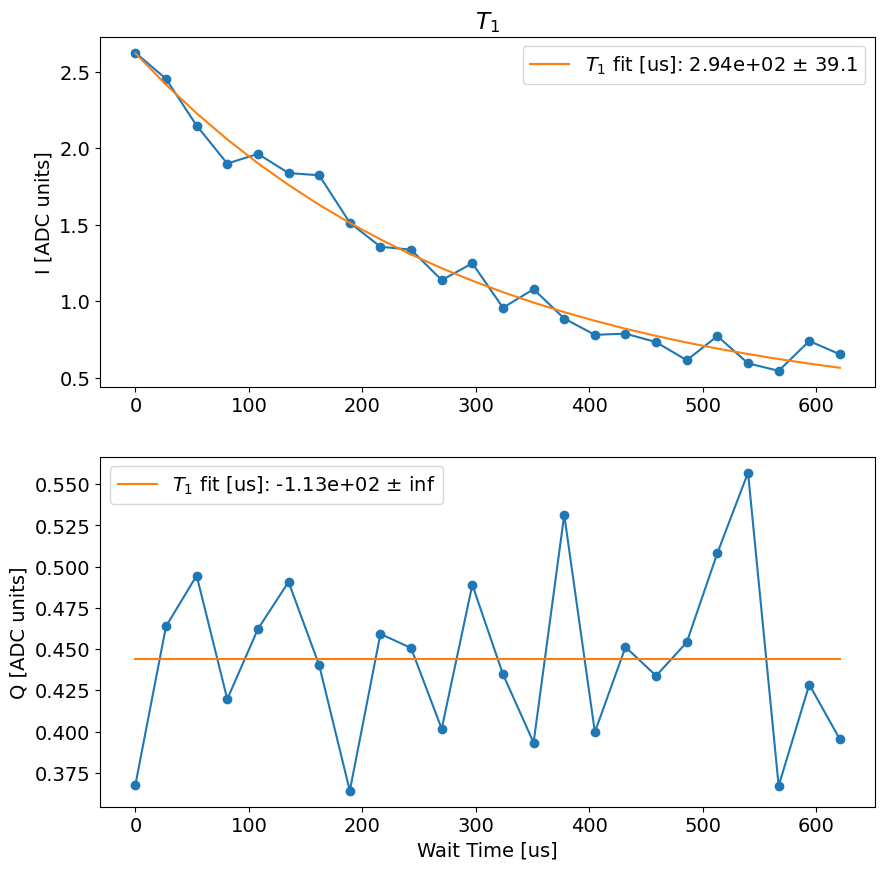

116.9516053199768


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.09998355117482882
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00013_t1_qubit3.h5
Fit T1 avgi [us]: 242.60252612375004
Fit T1 avgq [us]: 97.2484417876135


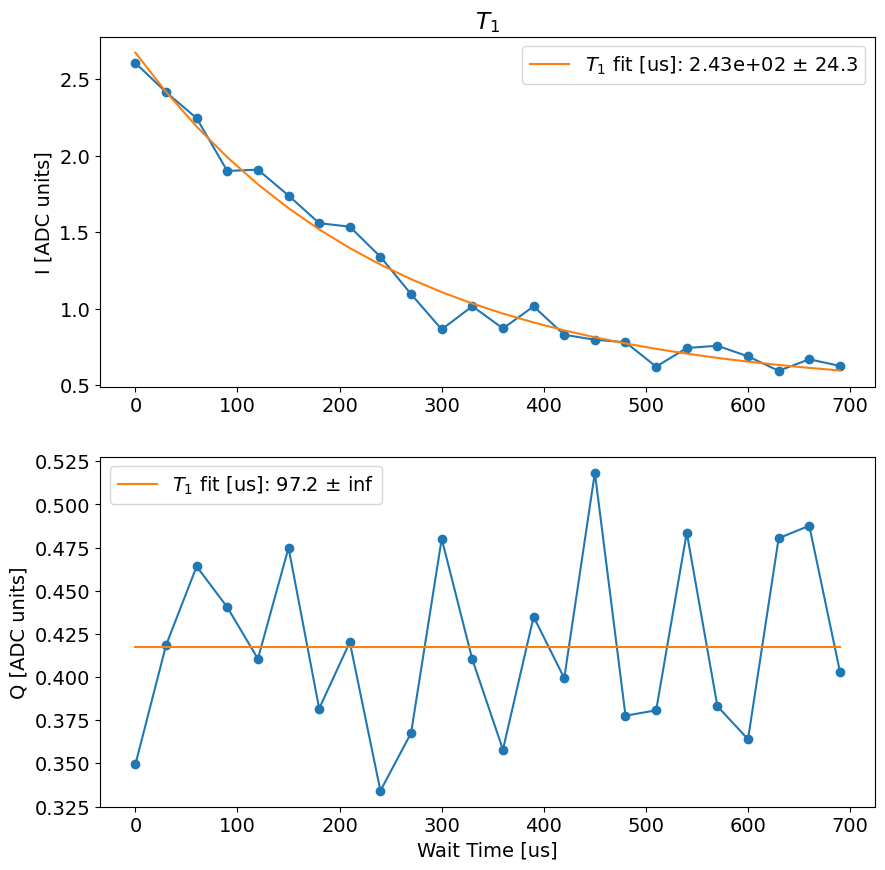

126.14560461044312


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.14217616650776715
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00014_t1_qubit3.h5
Fit T1 avgi [us]: 288.7581047807461
Fit T1 avgq [us]: 50.697075839078465


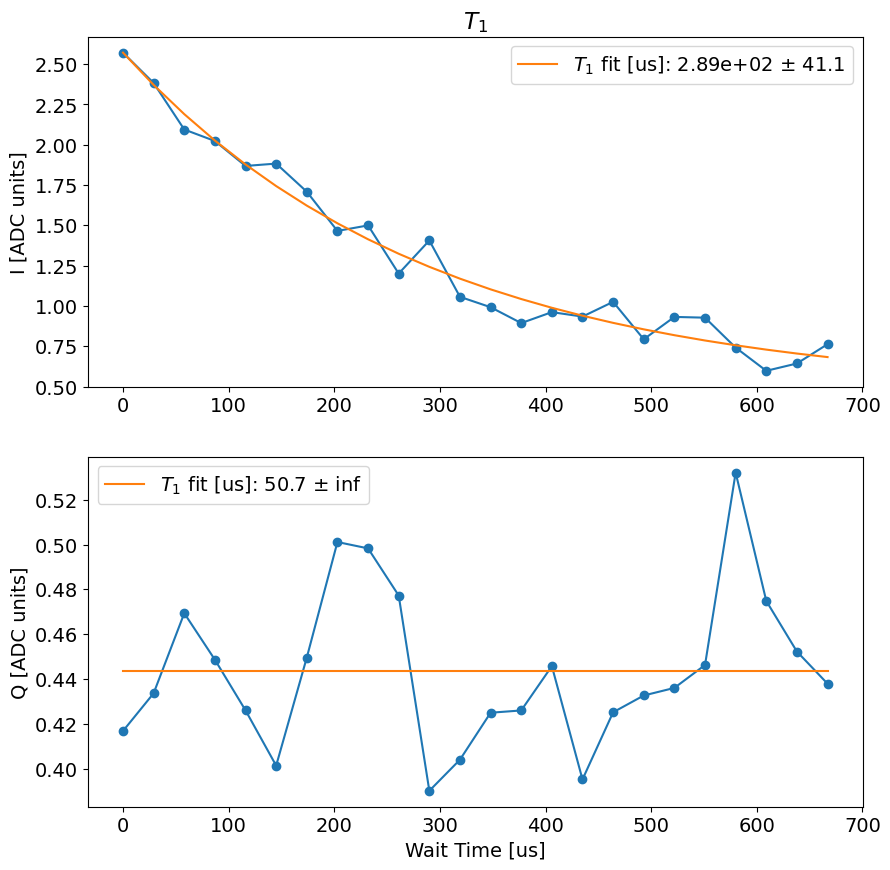

135.29911494255066


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.09757095266068538
t1_q error:fit ratio= 14383985.822962165
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00015_t1_qubit3.h5
Fit T1 avgi [us]: 253.64478893360143
Fit T1 avgq [us]: 1.661073453825586


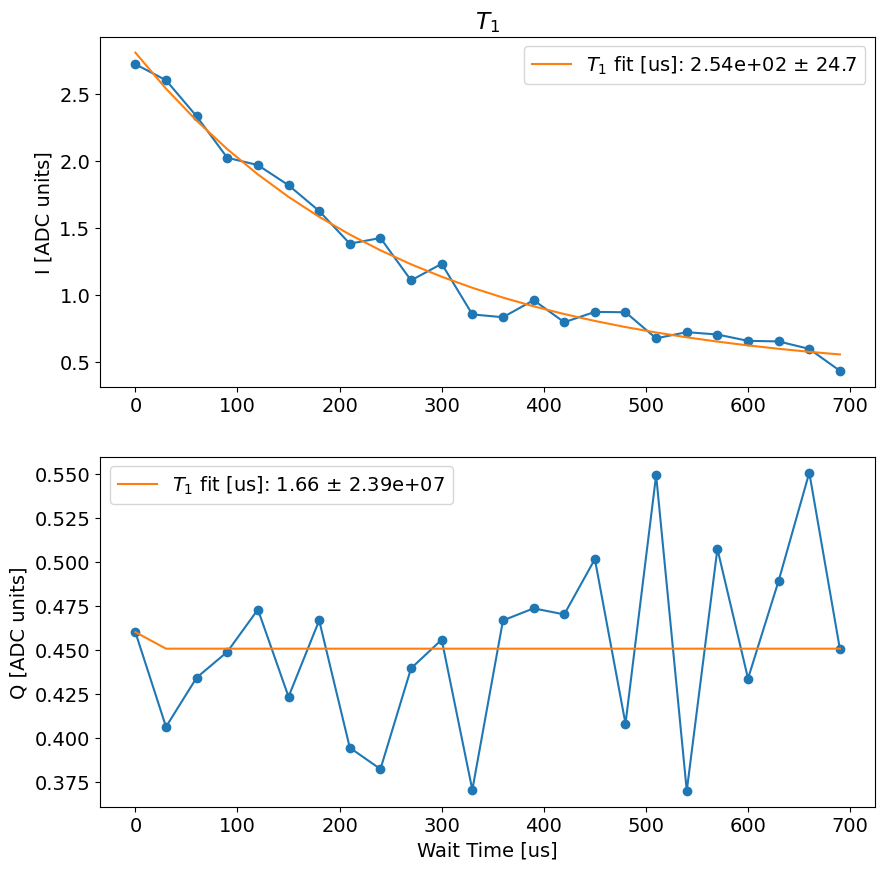

144.49815773963928


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1292092957459211
t1_q error:fit ratio= 1.3850256317420102
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00016_t1_qubit3.h5
Fit T1 avgi [us]: 307.96113658488946
Fit T1 avgq [us]: 324.9952322457951


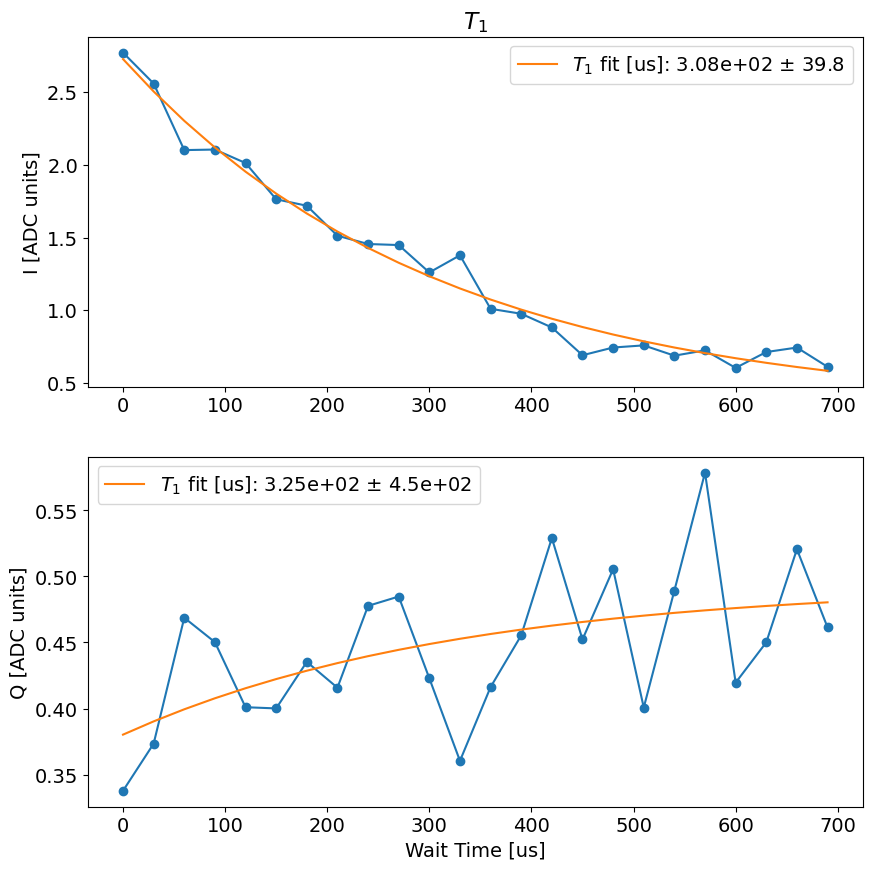

153.73822736740112


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.09915606636034707
t1_q error:fit ratio= 3.661625366608353
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00017_t1_qubit3.h5
Fit T1 avgi [us]: 248.35048435525098
Fit T1 avgq [us]: 16.23021717341622


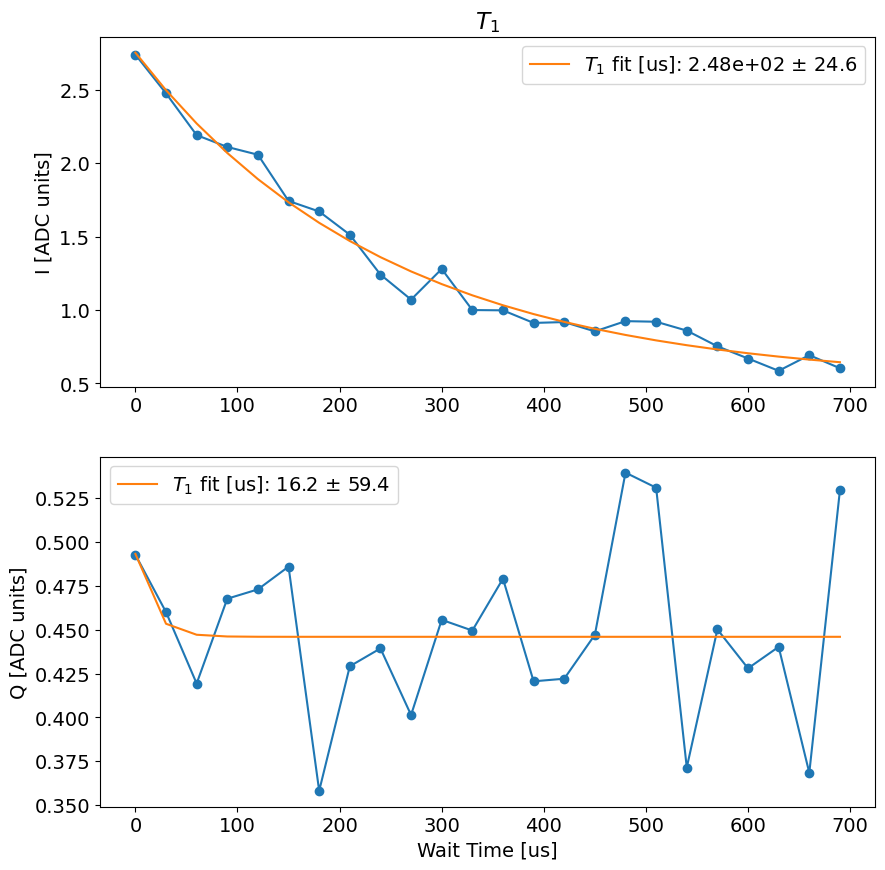

162.94005918502808


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.08900386362567794
t1_q error:fit ratio= 0.8968823894249371
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00018_t1_qubit3.h5
Fit T1 avgi [us]: 274.6019385616822
Fit T1 avgq [us]: 79.01222303744424


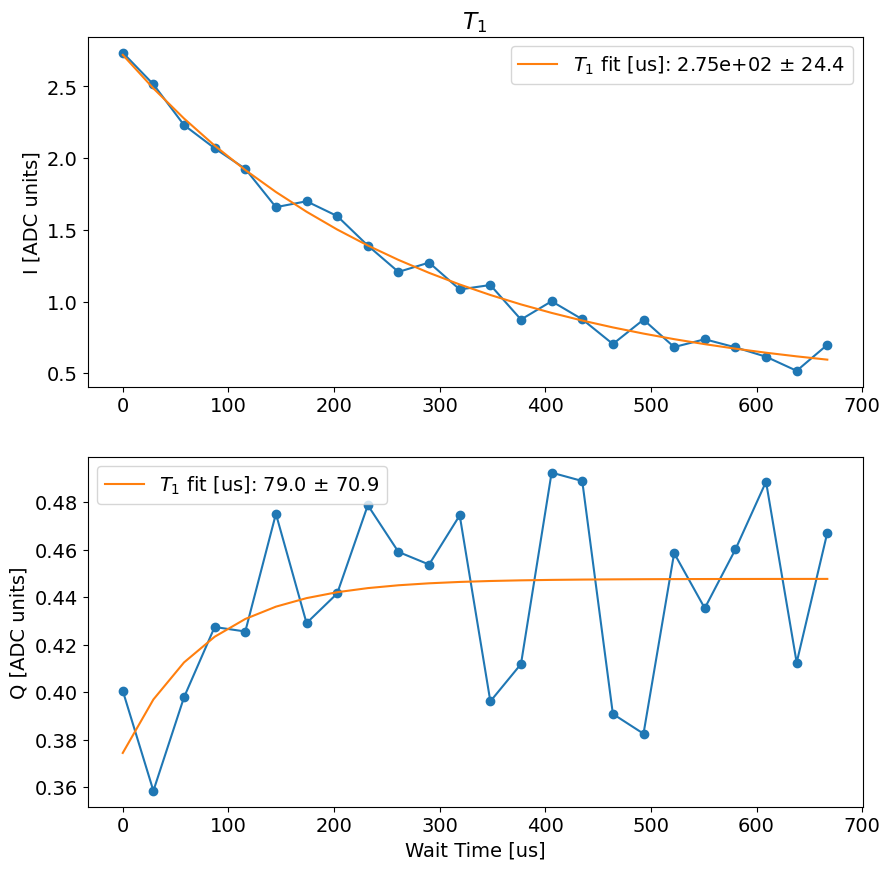

172.0700764656067


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.13458411302273213
t1_q error:fit ratio= 4.011974844301926
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00019_t1_qubit3.h5
Fit T1 avgi [us]: 307.9143461163636
Fit T1 avgq [us]: 191.3286801134769


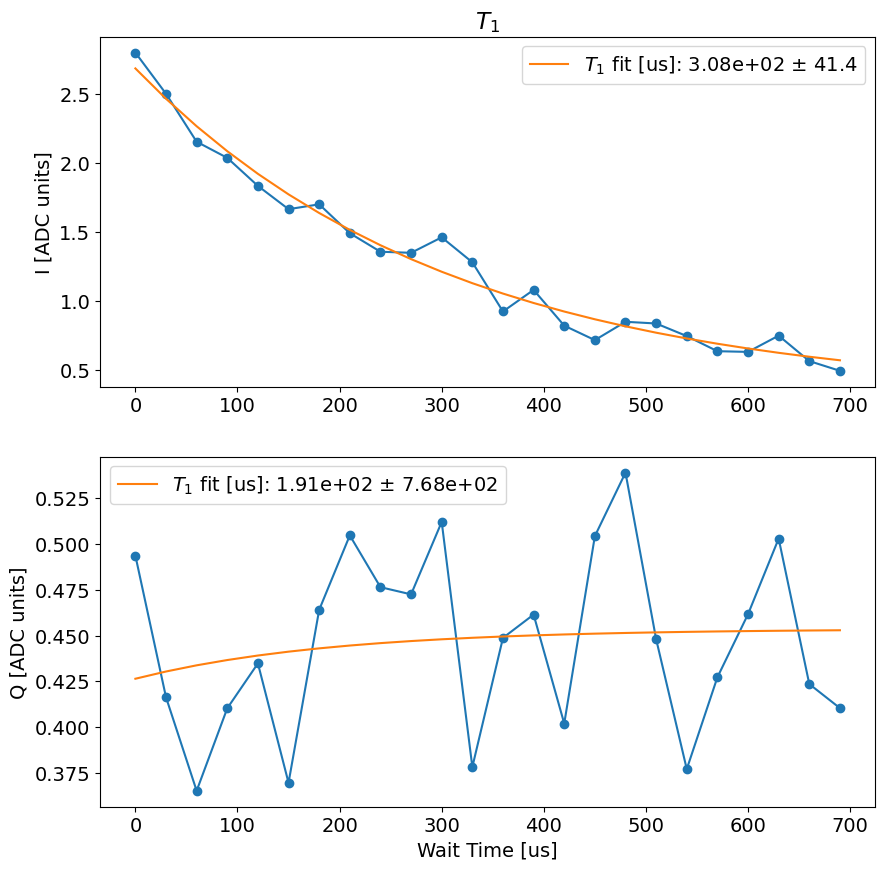

181.27319955825806


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.08108770282448319
t1_q error:fit ratio= 13.151610269541345
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00020_t1_qubit3.h5
Fit T1 avgi [us]: 224.60993063573795
Fit T1 avgq [us]: 195.58346315806085


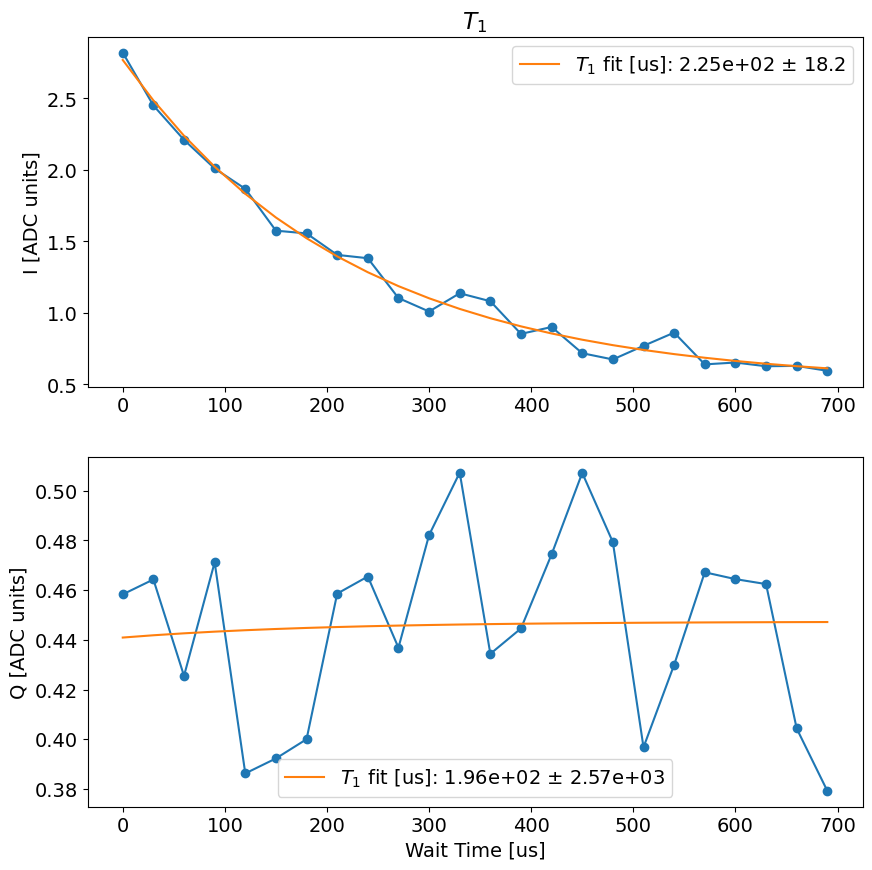

190.46225595474243


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.13505973477322977
t1_q error:fit ratio= 6.755347884872227
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00021_t1_qubit3.h5
Fit T1 avgi [us]: 219.16727994472734
Fit T1 avgq [us]: 10.117579159473225


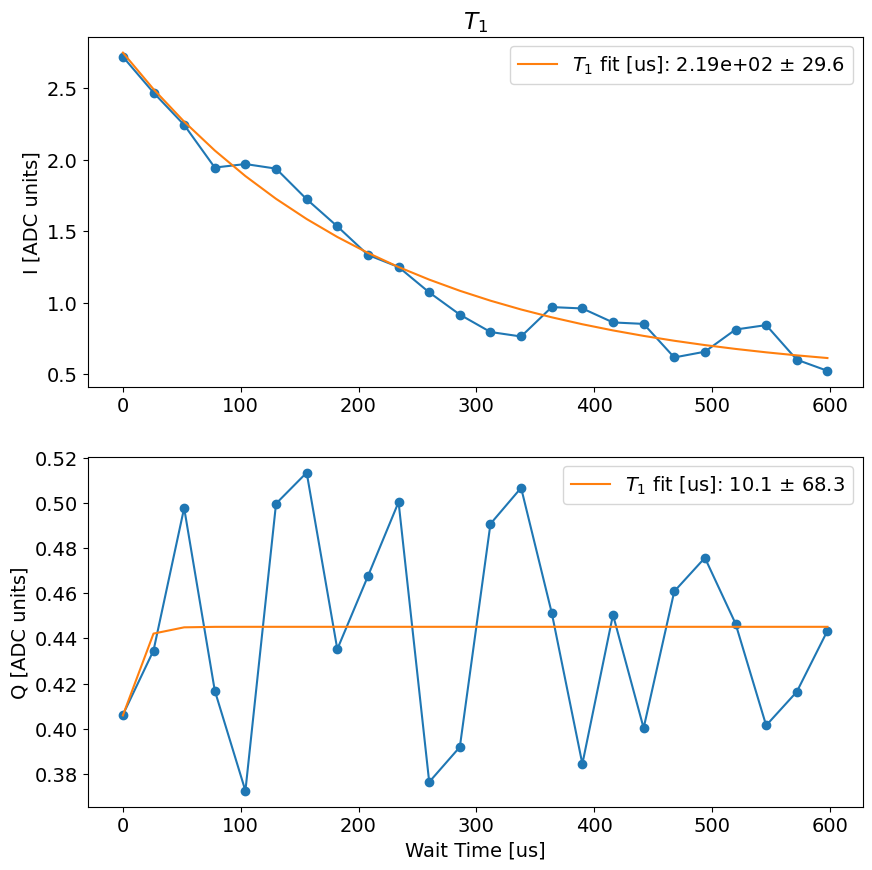

199.44034075737


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.09194344748875687
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00022_t1_qubit3.h5
Fit T1 avgi [us]: 179.8567048149205
Fit T1 avgq [us]: -1473.4709023167372


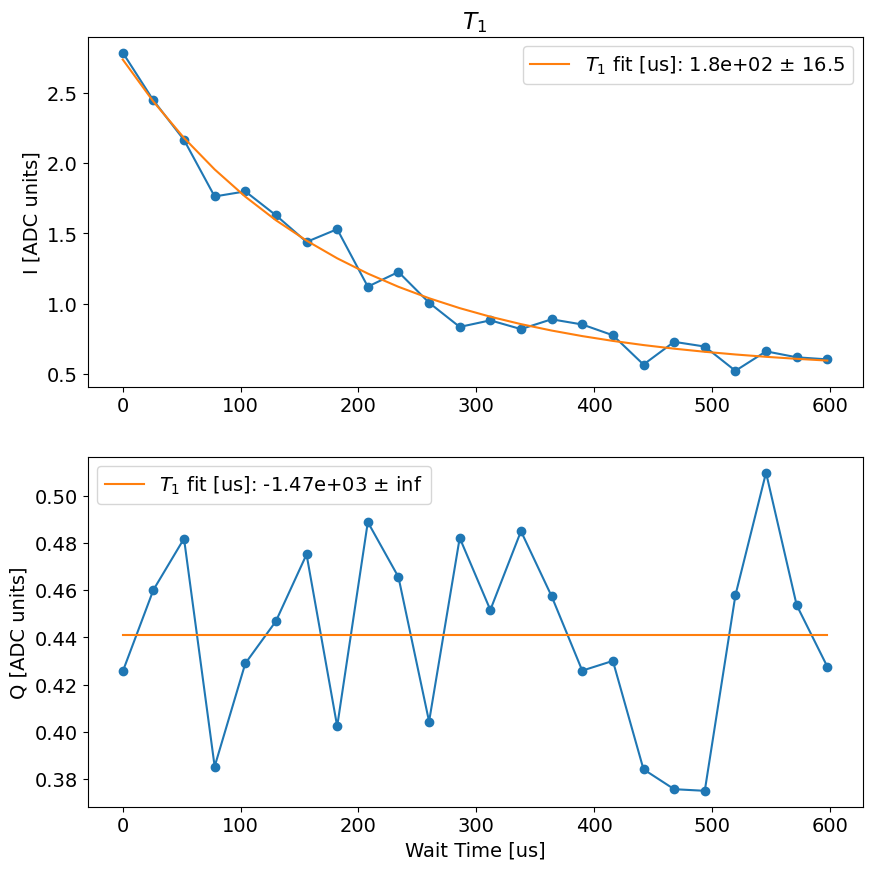

208.51665043830872


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.31002370696756804
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00023_t1_qubit3.h5
Fit T1 avgi [us]: 272.3210259157986
Fit T1 avgq [us]: 0.4836330350859058


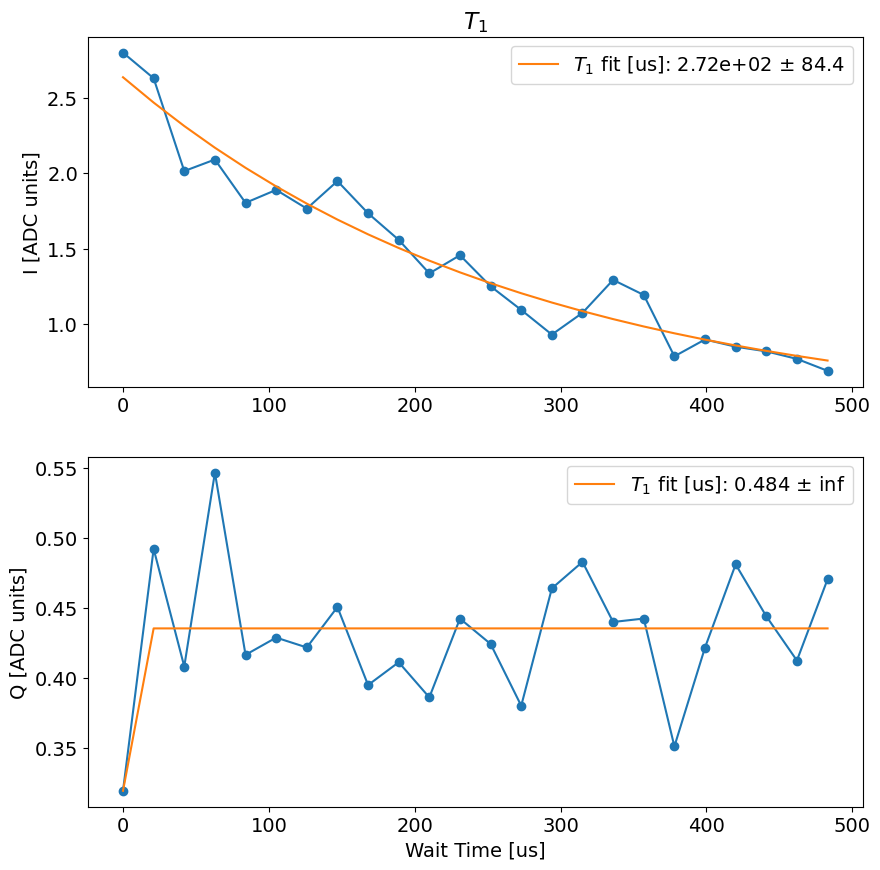

217.14363288879395


  0%|          | 0/6250 [00:00<?, ?it/s]

c:\_Lib\python\rfsoc\elaine_rfsoc\slab_rfsoc_expts\experiments\single_qubit\t1.py:165: RuntimeWarning: invalid value encountered in sqrt
  t1_err_i = np.sqrt(data['fit_err_avgi'][3][3])
c:\_Lib\python\rfsoc\elaine_rfsoc\slab_rfsoc_expts\experiments\single_qubit\t1.py:197: RuntimeWarning: invalid value encountered in sqrt
  captionStr = f'$T_1$ fit [us]: {p[3]:.3} $\pm$ {np.sqrt(pCov[3][3]):.3}'
c:\_Lib\python\rfsoc\elaine_rfsoc\slab_rfsoc_expts\experiments\single_qubit\t1.py:201: RuntimeWarning: invalid value encountered in sqrt
  data["err_ratio_i"] = np.sqrt(data['fit_err_avgi'][3][3])/data['fit_avgi'][3]


t1_i error:fit ratio= nan
t1_q error:fit ratio= inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00024_t1_qubit3.h5
Fit T1 avgi [us]: 208.54026109172935
Fit T1 avgq [us]: 28.421041555282244


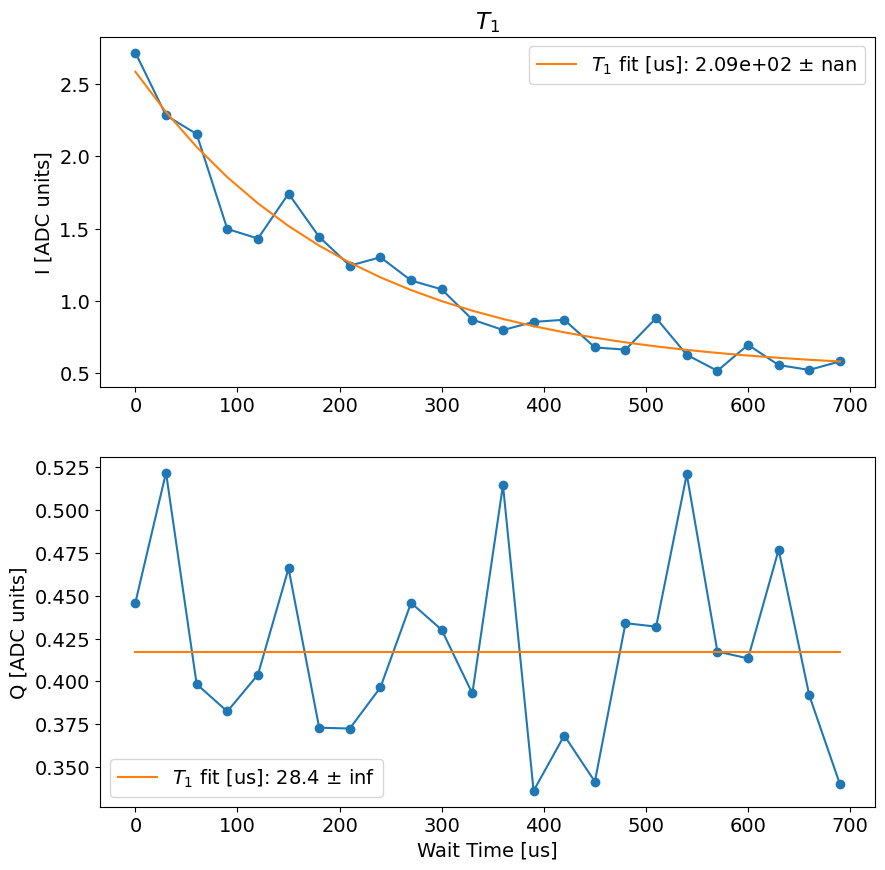

226.41482520103455


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.3010342609786366
t1_q error:fit ratio= 7.74396275684916
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00025_t1_qubit3.h5
Fit T1 avgi [us]: 299.6988161420745
Fit T1 avgq [us]: 277.18551460128873


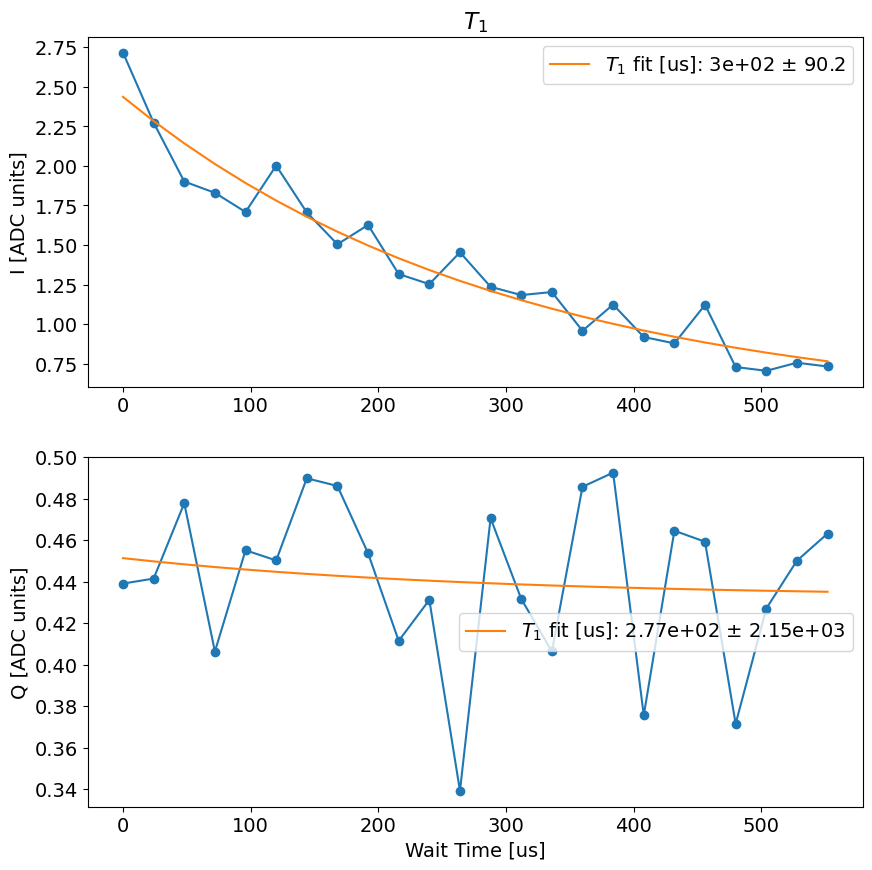

235.3077311515808


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1832982642991416
t1_q error:fit ratio= 2.4107806732352253
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00026_t1_qubit3.h5
Fit T1 avgi [us]: 385.058954273175
Fit T1 avgq [us]: 100.00763092295905


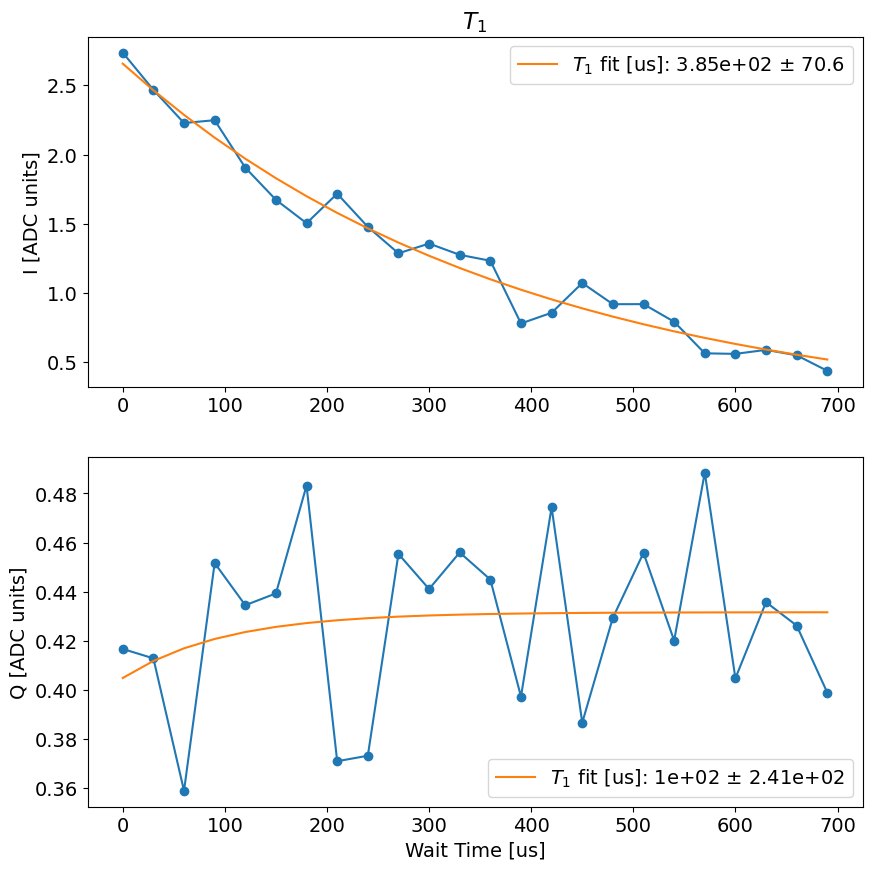

244.6168372631073


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.2008504227918183
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00027_t1_qubit3.h5
Fit T1 avgi [us]: 367.29154591907394
Fit T1 avgq [us]: 154.09823683062328


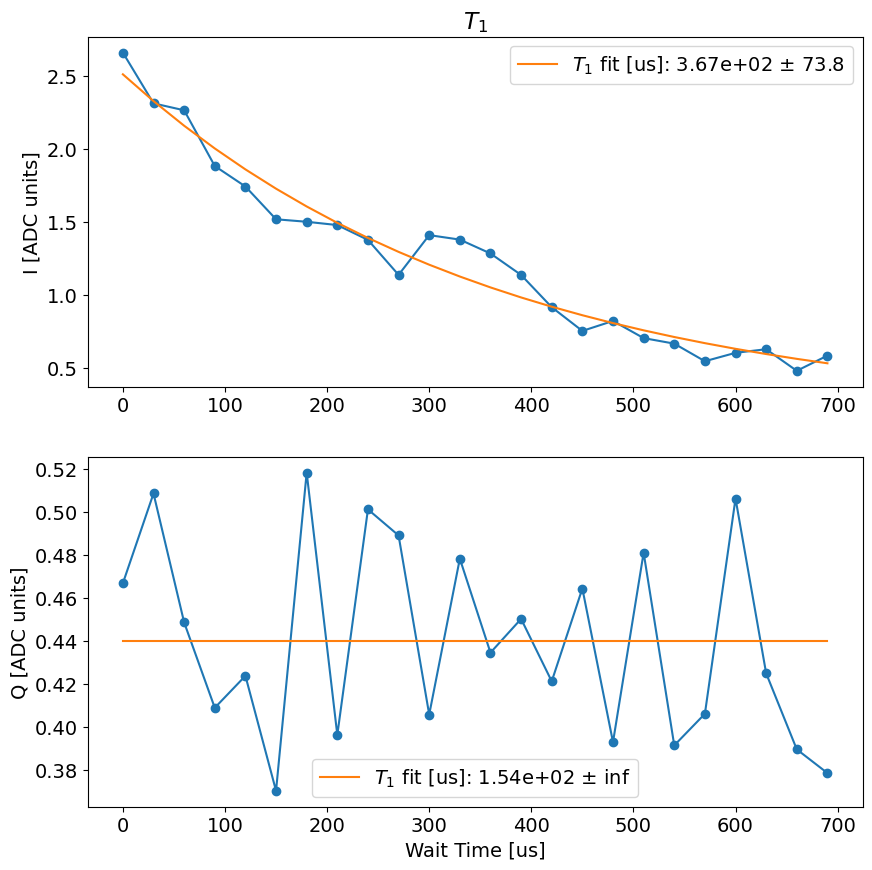

254.29669165611267


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.11235908812780453
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00028_t1_qubit3.h5
Fit T1 avgi [us]: 262.12354695176606
Fit T1 avgq [us]: 114.43989072801453


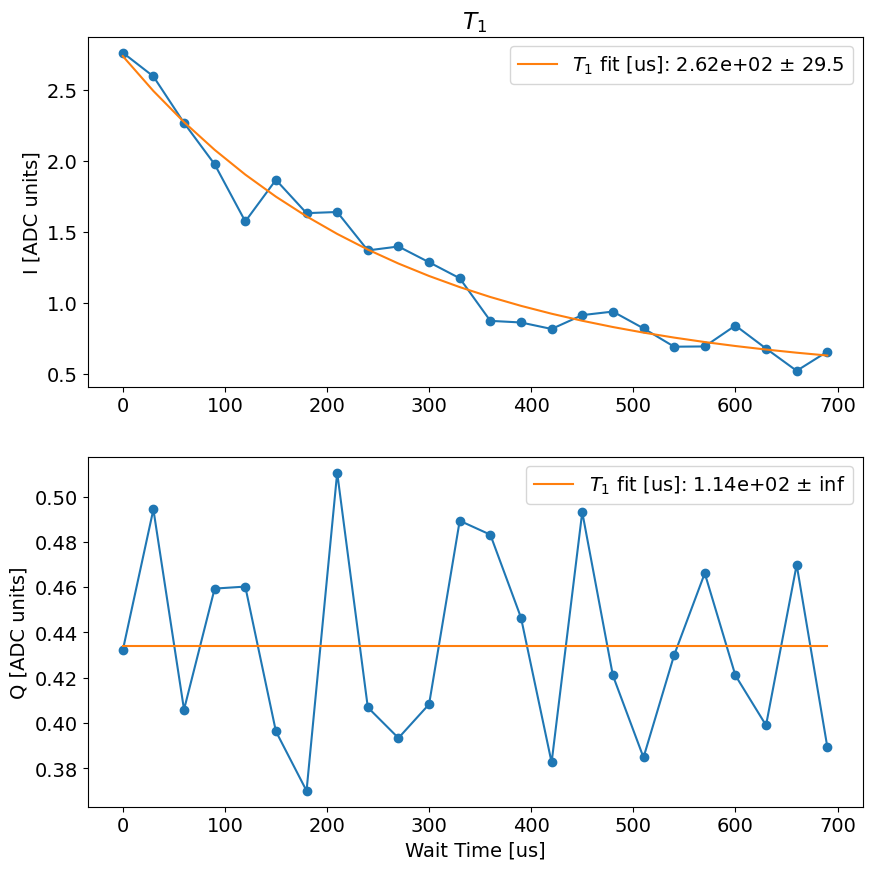

263.56464076042175


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.12382899082854572
t1_q error:fit ratio= 4.726518527990327
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00029_t1_qubit3.h5
Fit T1 avgi [us]: 178.25119848850582
Fit T1 avgq [us]: 177.91689499399945


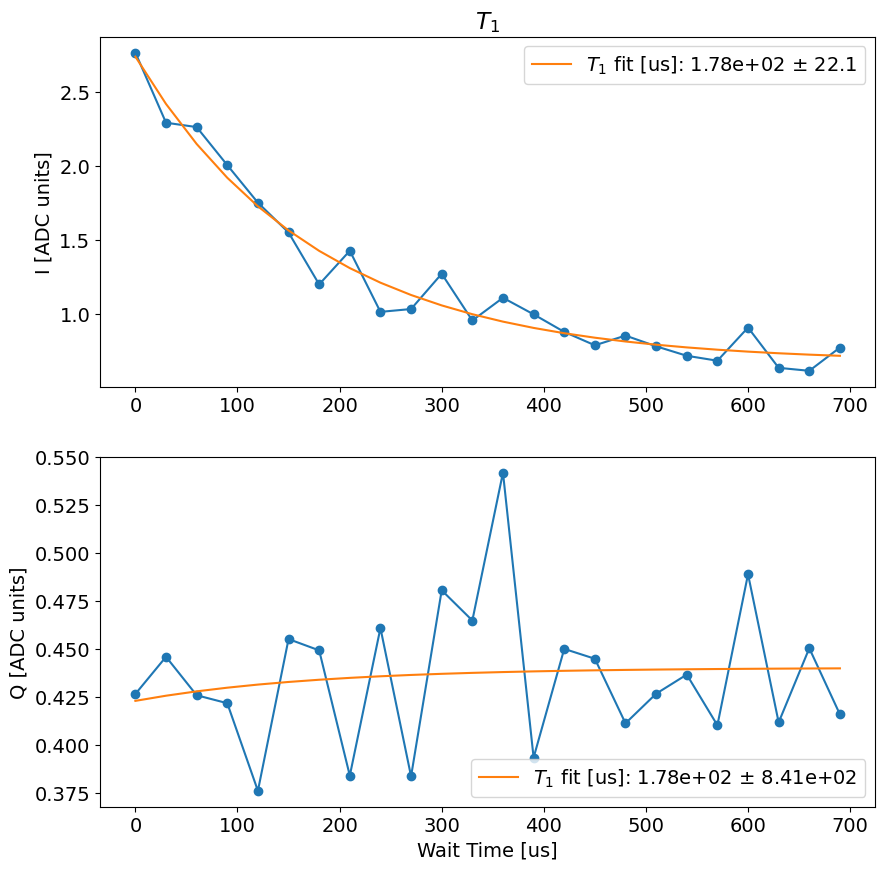

272.86878299713135


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.14530101938925757
t1_q error:fit ratio= 7757.6550458218835
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00030_t1_qubit3.h5
Fit T1 avgi [us]: 215.448837171514
Fit T1 avgq [us]: 264228.9175102985


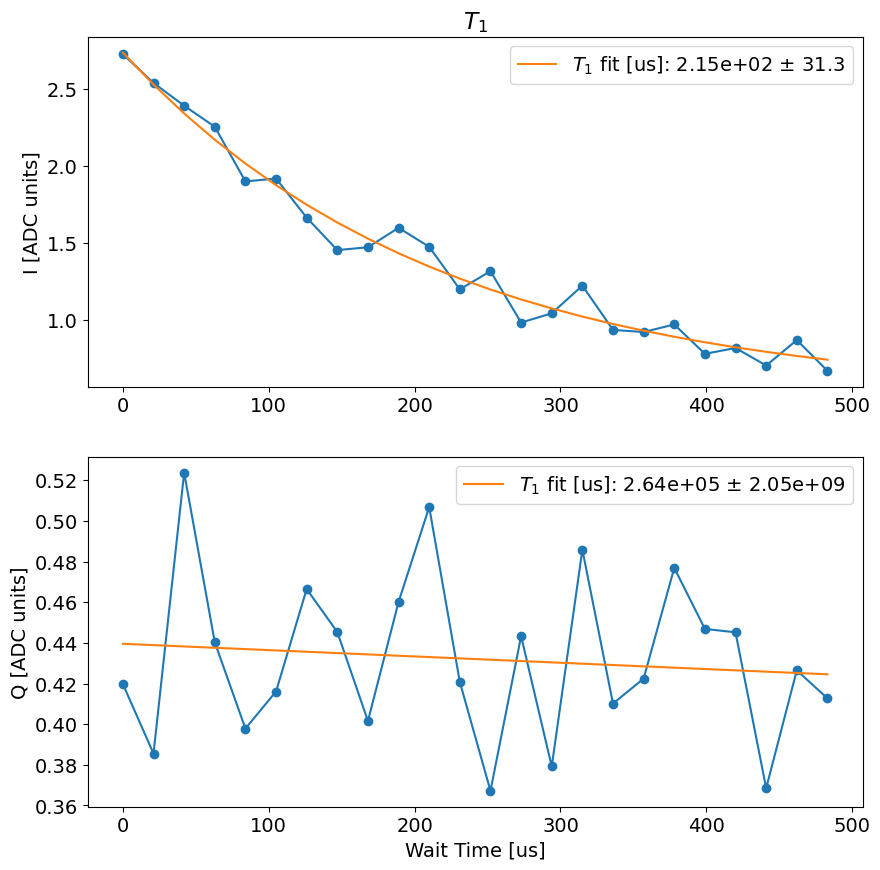

281.43881702423096


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1124667165149776
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00031_t1_qubit3.h5
Fit T1 avgi [us]: 199.02634143780378
Fit T1 avgq [us]: 142.31918787762575


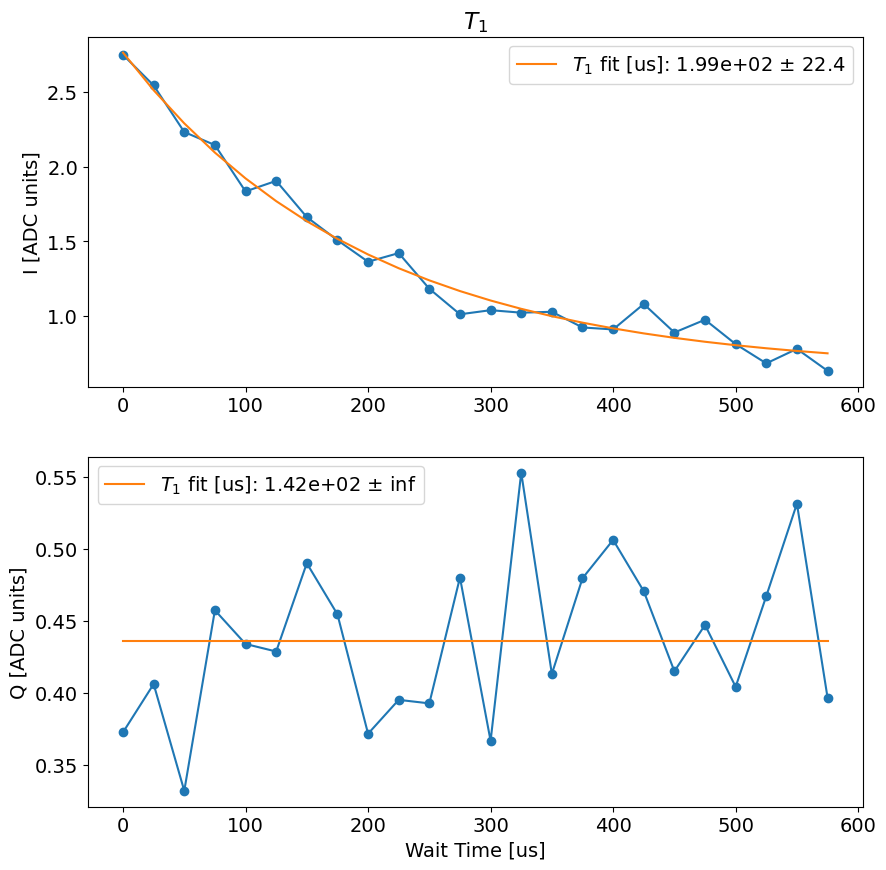

290.34138464927673


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.11582223463145967
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00032_t1_qubit3.h5
Fit T1 avgi [us]: 193.68291231914137
Fit T1 avgq [us]: 200.7228461598957


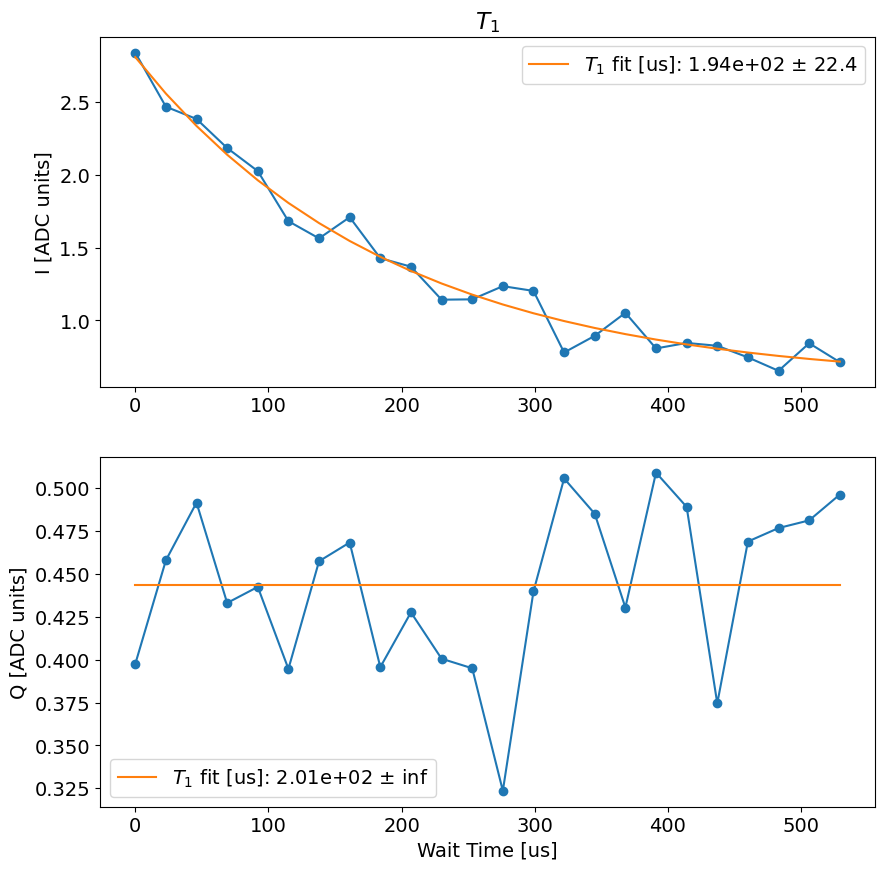

299.20074224472046


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1264609125317335
t1_q error:fit ratio= 8.696473923862463
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00033_t1_qubit3.h5
Fit T1 avgi [us]: 264.0420909585605
Fit T1 avgq [us]: 970.7120242347809


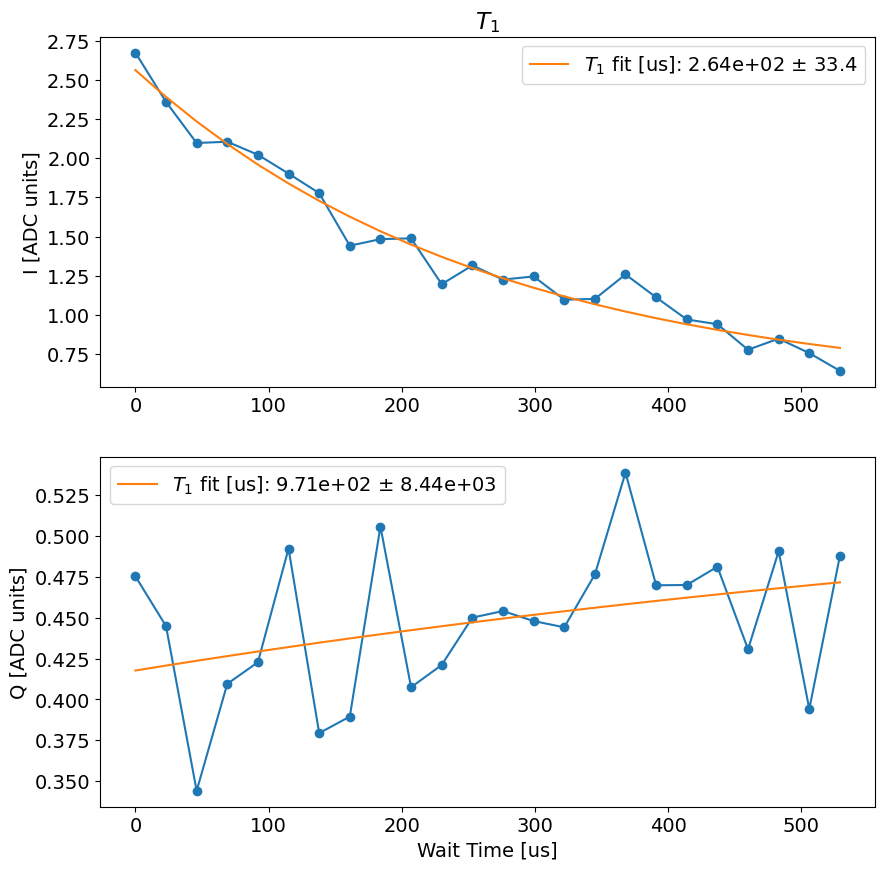

308.03621459007263


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.10526197819503395
t1_q error:fit ratio= 1.7290362539020783
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00034_t1_qubit3.h5
Fit T1 avgi [us]: 253.25819001795784
Fit T1 avgq [us]: 44.29166621657717


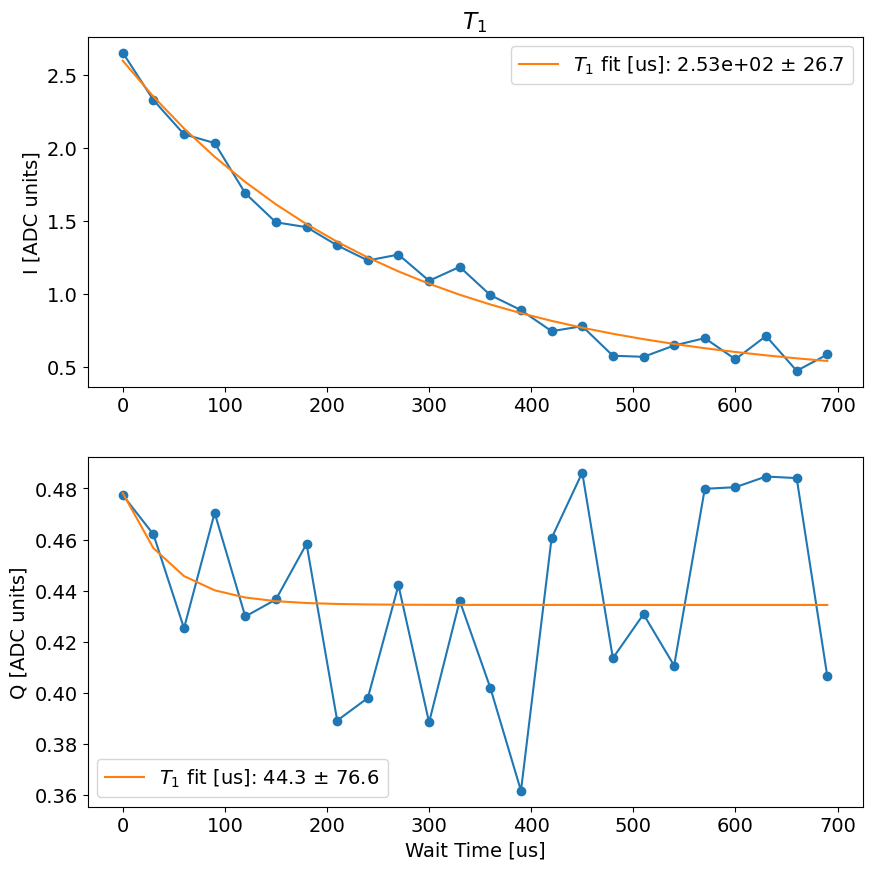

317.334050655365


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1165253991704076
t1_q error:fit ratio= 2.2732471347623675
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00035_t1_qubit3.h5
Fit T1 avgi [us]: 185.66130394934996
Fit T1 avgq [us]: 19.518124246930572


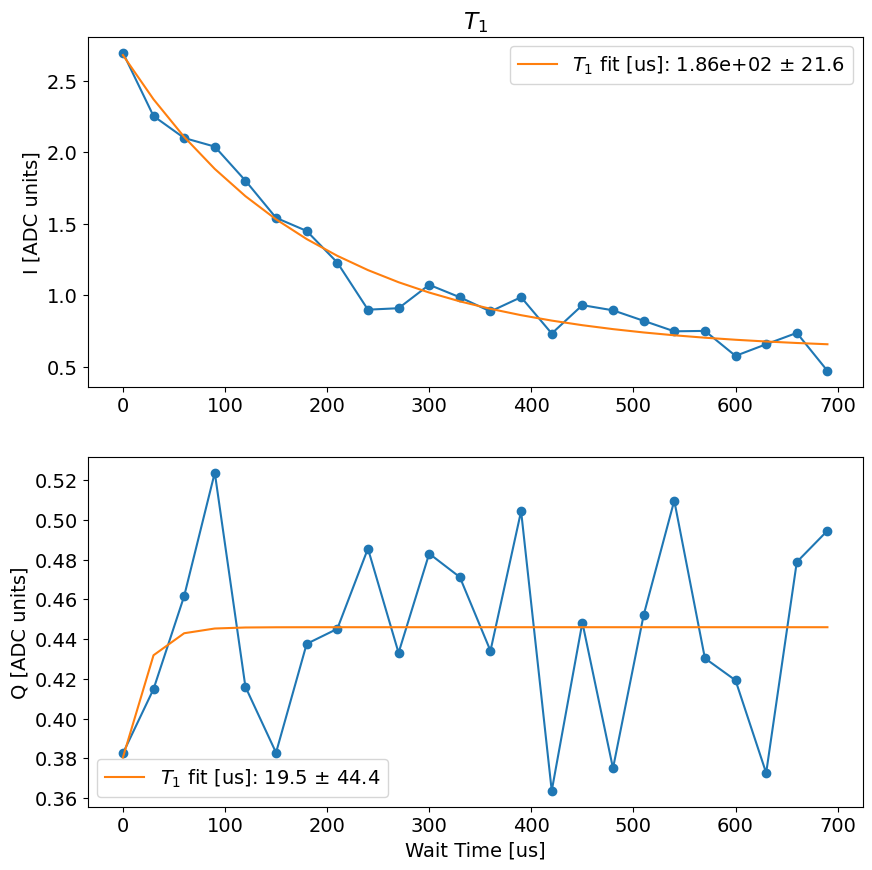

326.75959968566895


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.15507312374050228
t1_q error:fit ratio= 5008.736465640289
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00036_t1_qubit3.h5
Fit T1 avgi [us]: 205.17767649315599
Fit T1 avgq [us]: 328380.2671734153


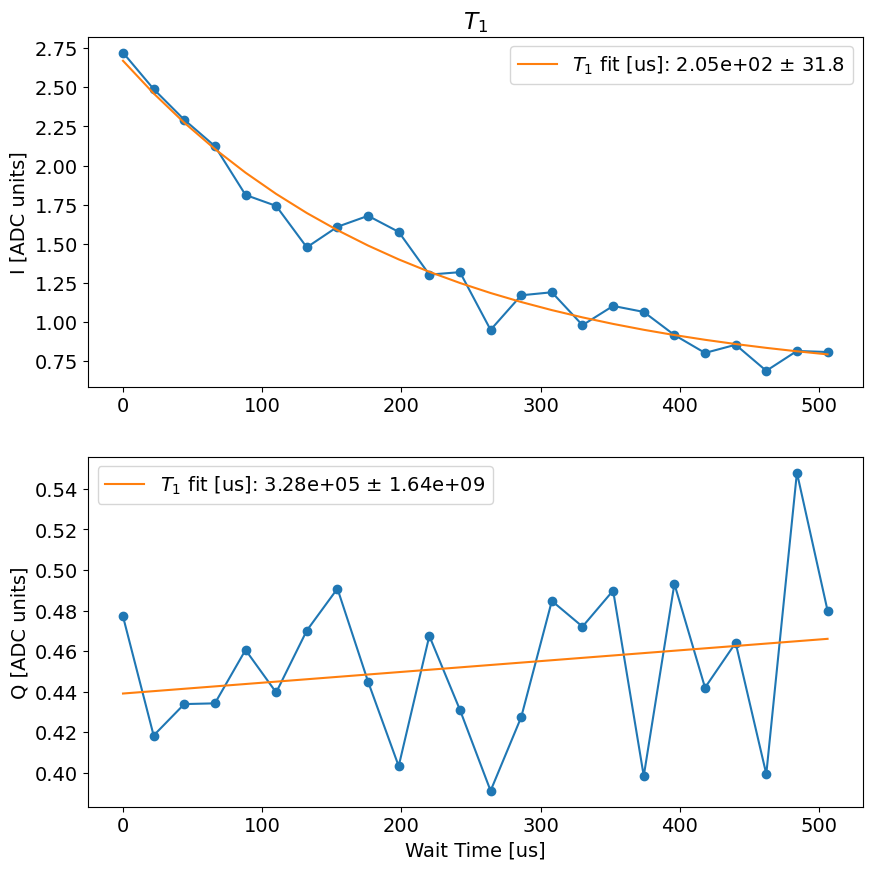

335.50243878364563


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.13570244624467384
t1_q error:fit ratio= 1.4551800052181938
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00037_t1_qubit3.h5
Fit T1 avgi [us]: 206.12645698870418
Fit T1 avgq [us]: 71.23998753331136


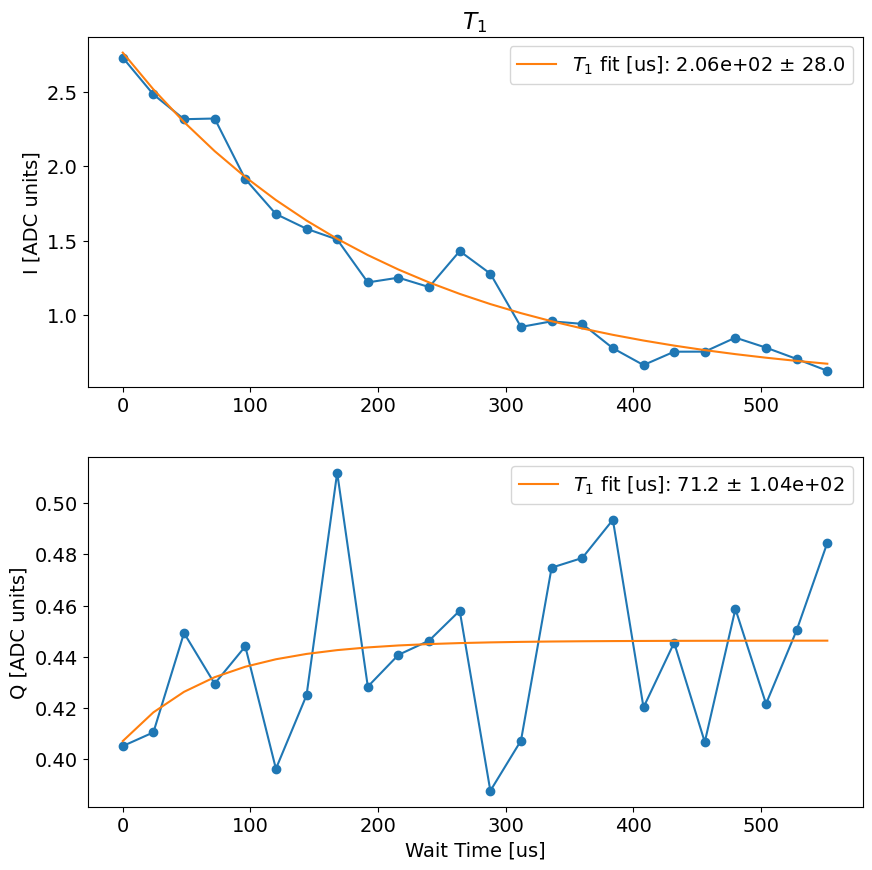

344.31172823905945


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.14636981738421015
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00038_t1_qubit3.h5
Fit T1 avgi [us]: 234.48464450261764
Fit T1 avgq [us]: 307.3630421300124


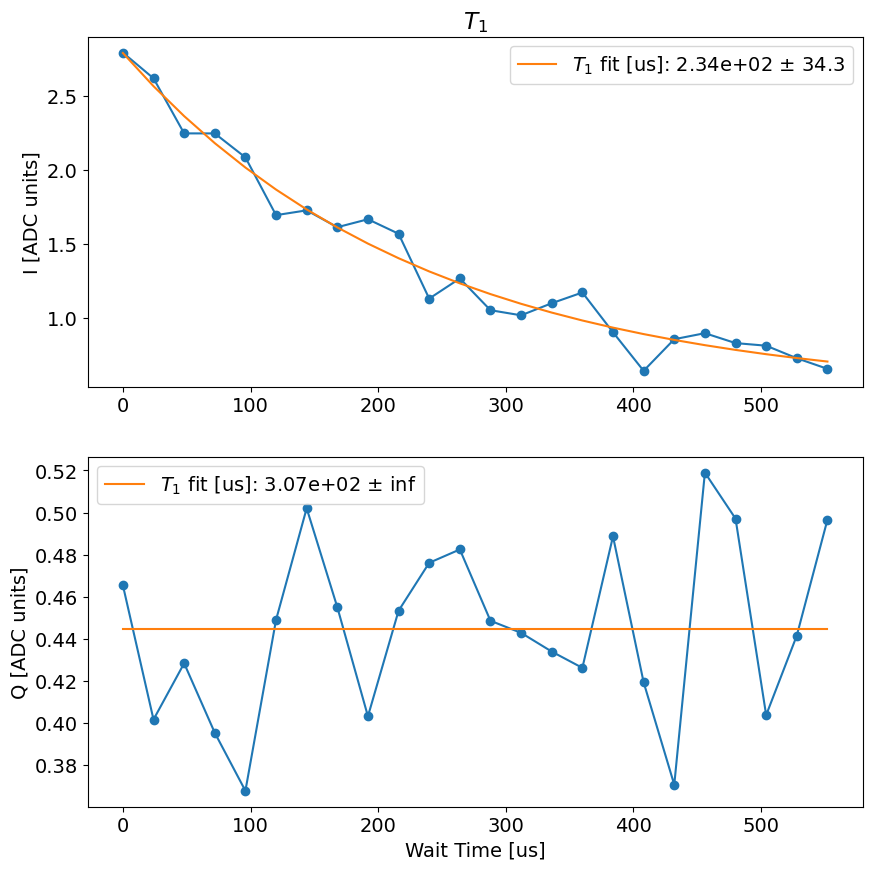

353.17314982414246


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.13647498555444243
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00039_t1_qubit3.h5
Fit T1 avgi [us]: 134.09013121484045
Fit T1 avgq [us]: -6.779881110053765


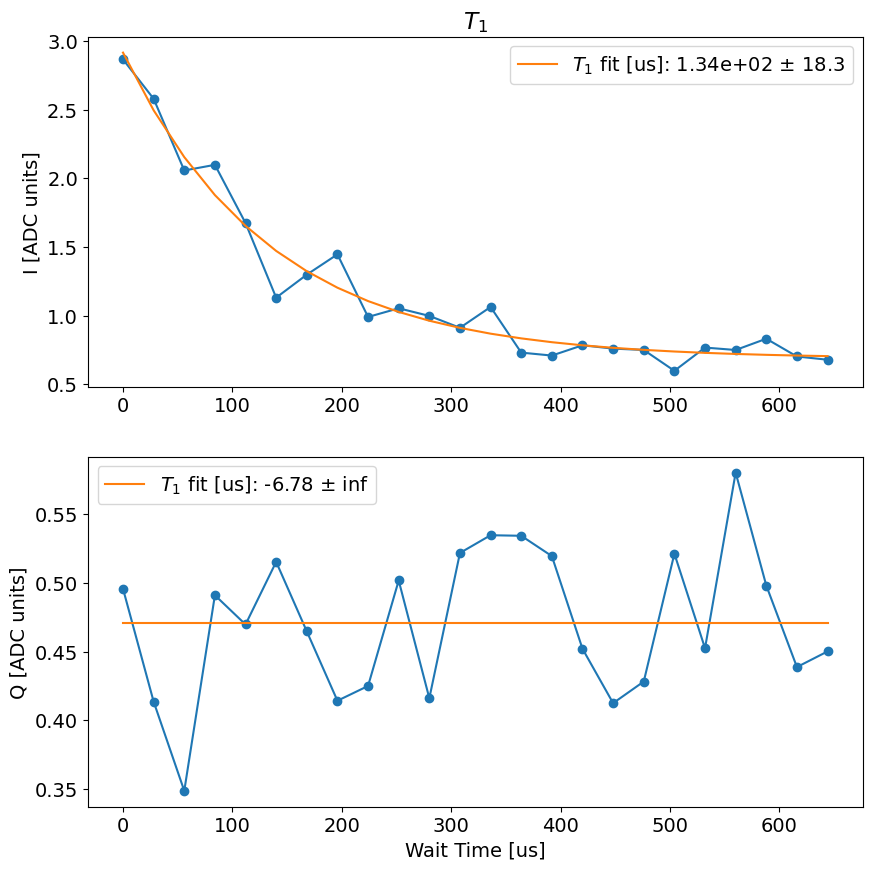

362.3288984298706


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.48292431048325773
t1_q error:fit ratio= 1.6206437036056616
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00040_t1_qubit3.h5
Fit T1 avgi [us]: 294.42594618612776
Fit T1 avgq [us]: 245.00943860922834


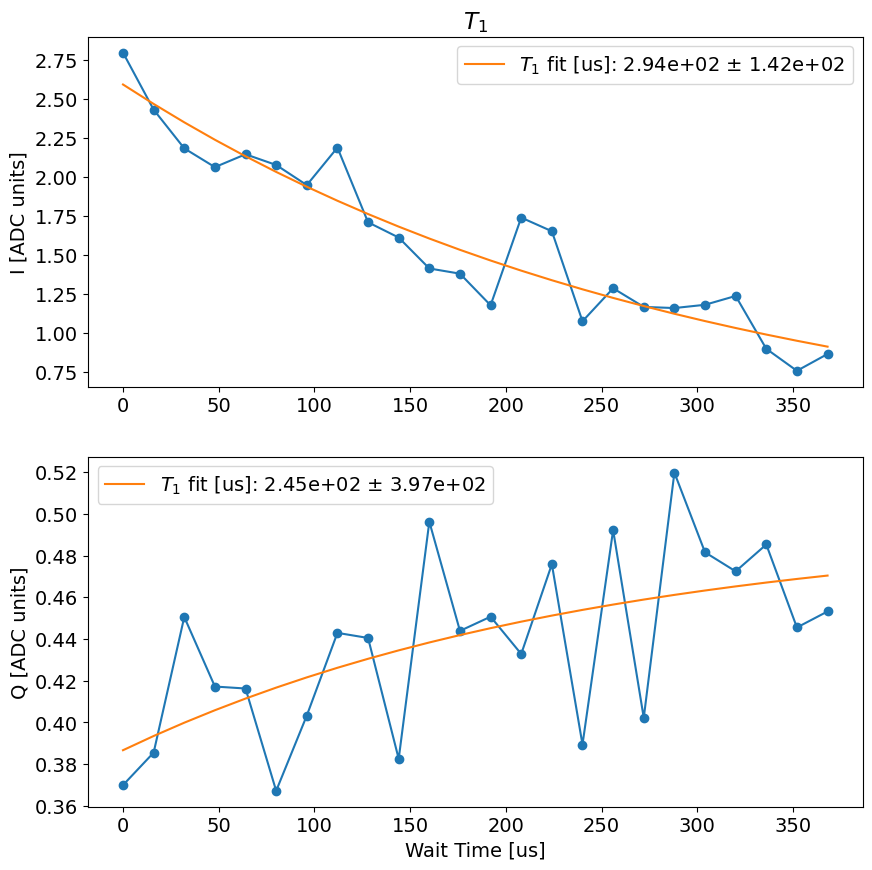

370.67381954193115


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.28328971719661944
t1_q error:fit ratio= 2.0850273997301736
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00041_t1_qubit3.h5
Fit T1 avgi [us]: 235.3357896067846
Fit T1 avgq [us]: 153.2494452572997


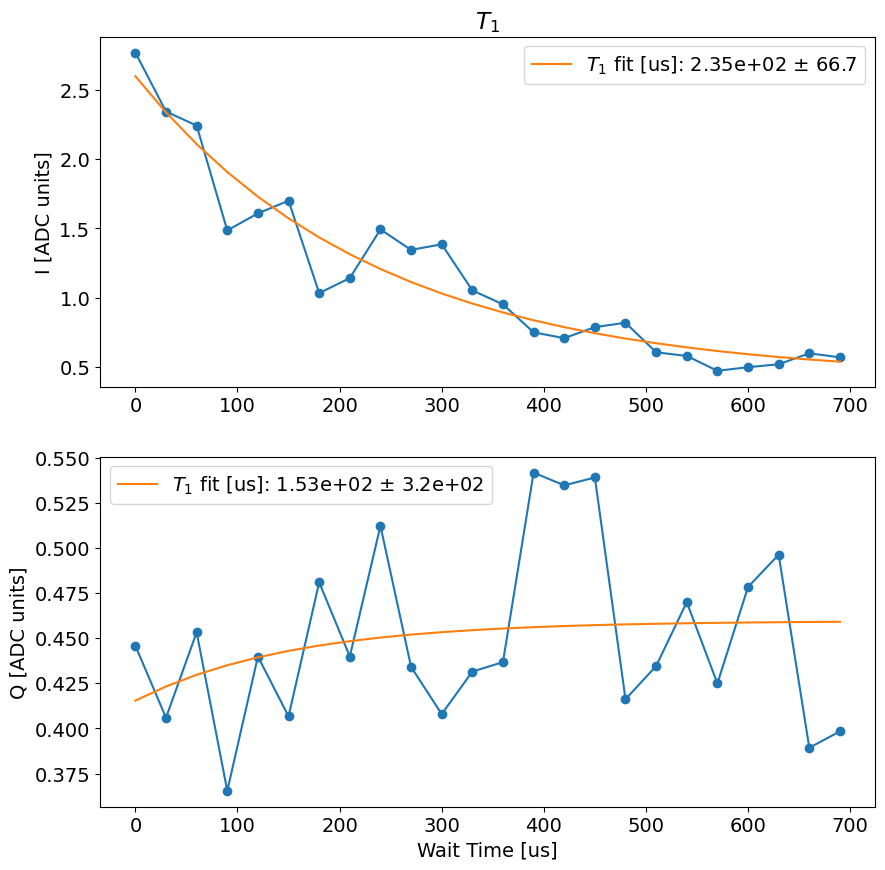

379.9703907966614


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1424964107258791
t1_q error:fit ratio= 1.7884900328855542
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00042_t1_qubit3.h5
Fit T1 avgi [us]: 187.1653099643808
Fit T1 avgq [us]: 82.90839786412413


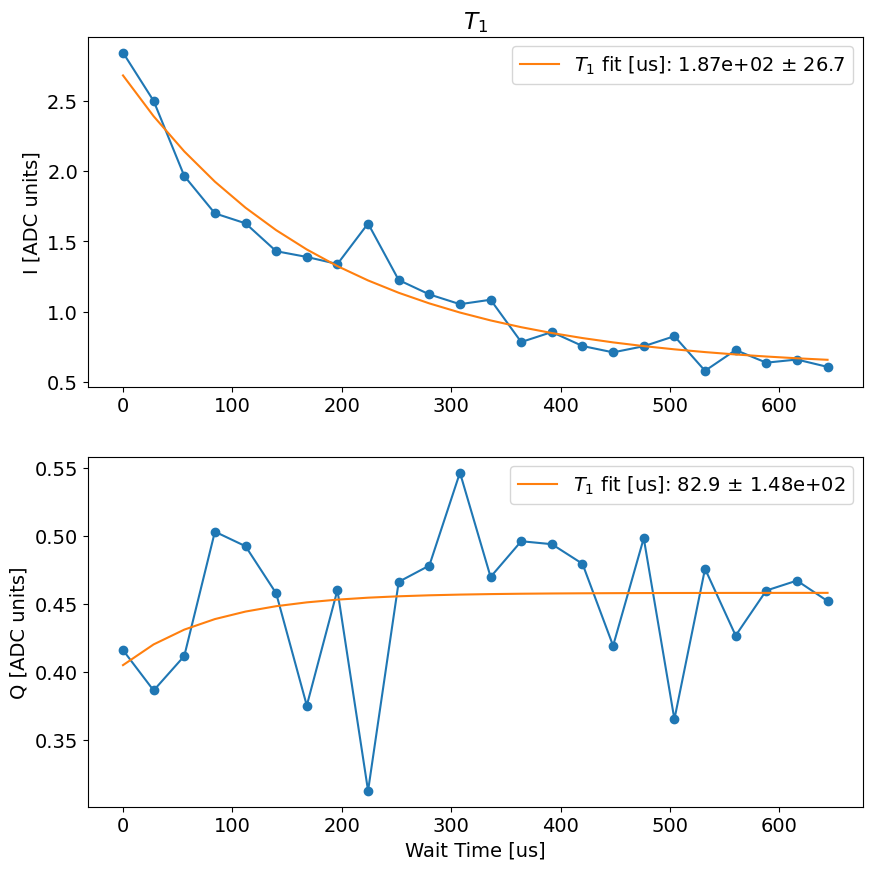

389.13181376457214


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.13351922534064298
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00043_t1_qubit3.h5
Fit T1 avgi [us]: 112.61250624642042
Fit T1 avgq [us]: 54.462129919368046


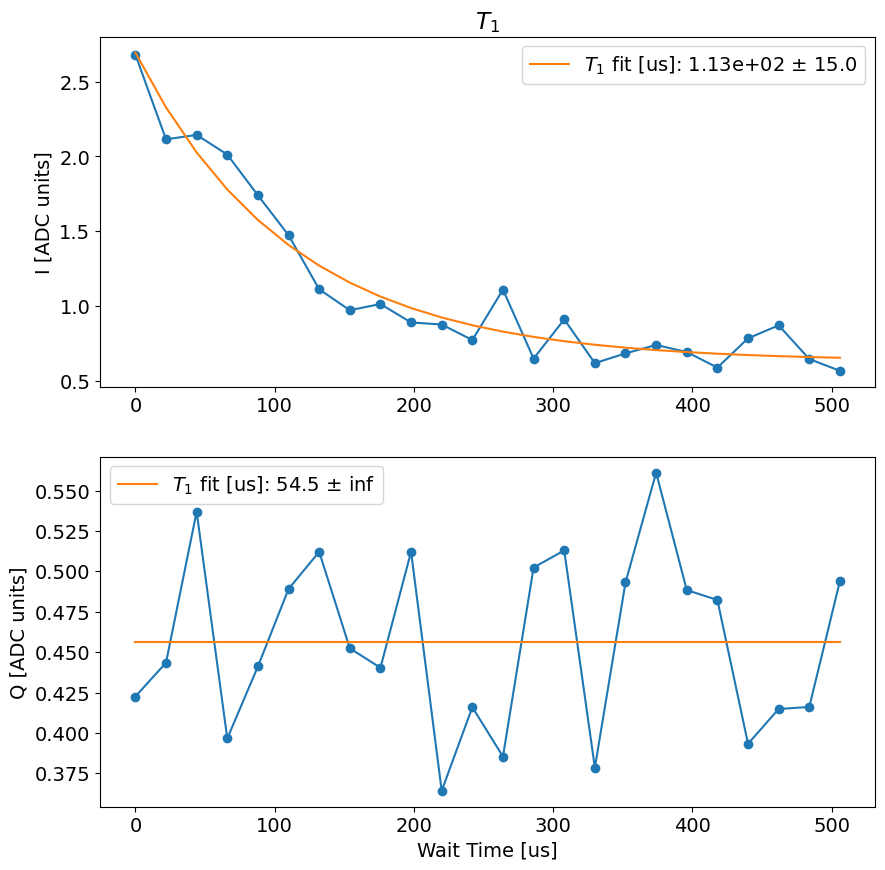

397.79957818984985


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.0
t1_q error:fit ratio= -7202.0113002892695
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00044_t1_qubit3.h5
Fit T1 avgi [us]: 104.9054768153644
Fit T1 avgq [us]: -261923.34241087688


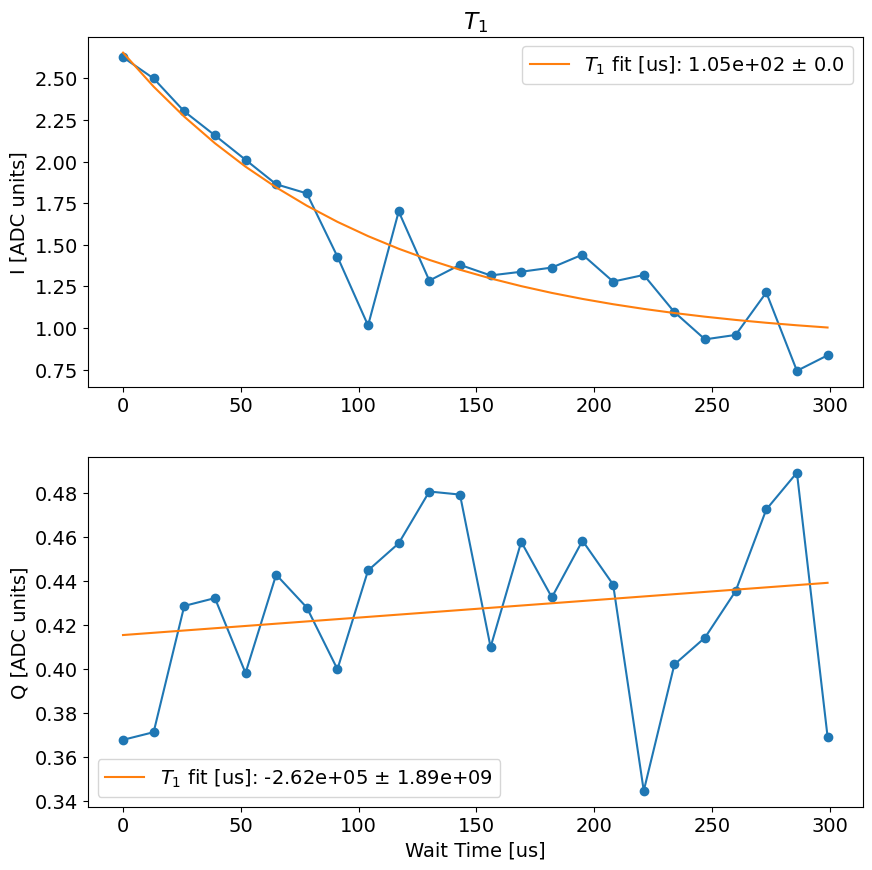

406.1889977455139


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.5874195840484412
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00045_t1_qubit3.h5
Fit T1 avgi [us]: 294.80916777568996
Fit T1 avgq [us]: -79.95625590639638


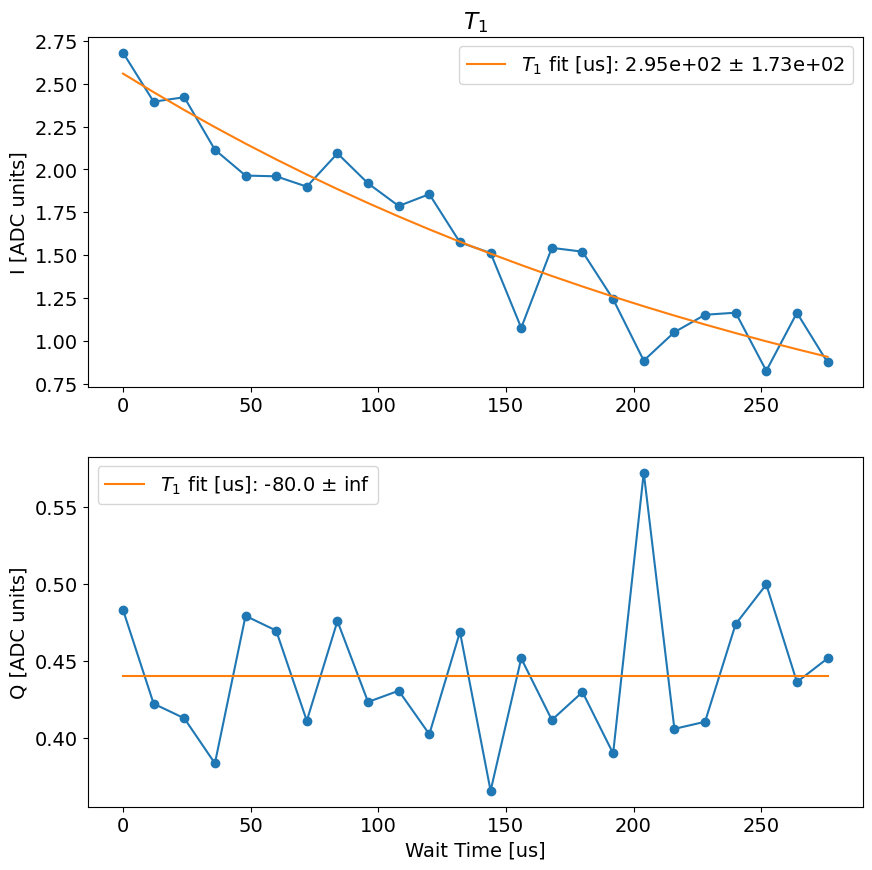

414.1497836112976


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.0
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00046_t1_qubit3.h5
Fit T1 avgi [us]: 181.66974461292696
Fit T1 avgq [us]: 270.1473118289259


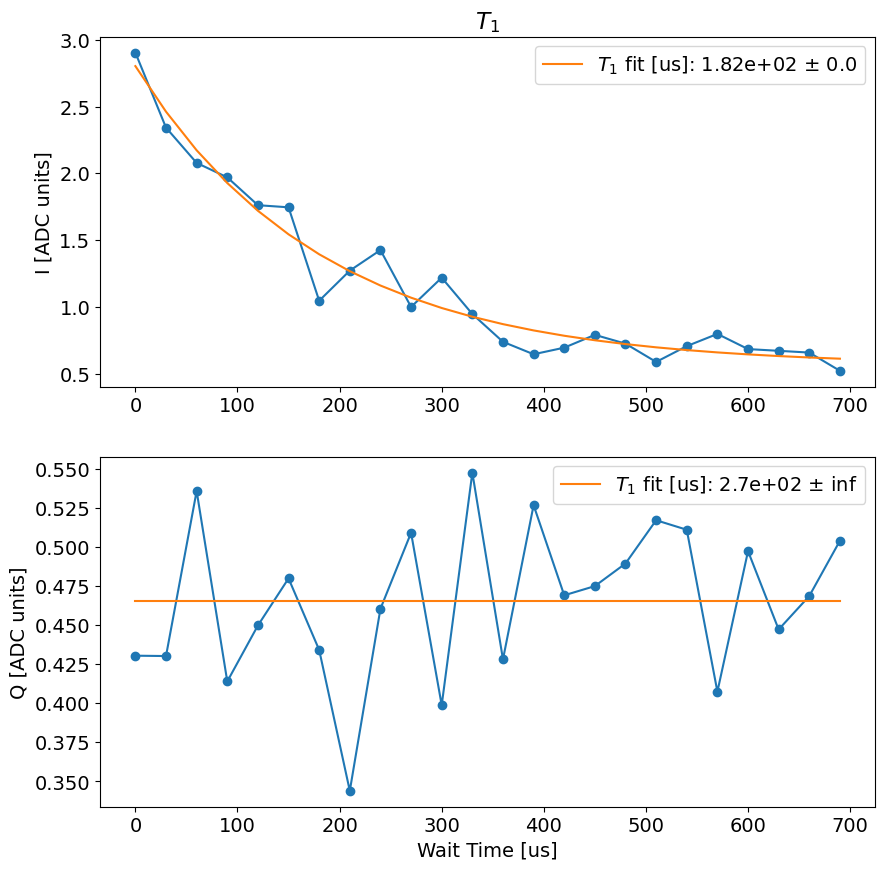

423.5842583179474


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.18759819801894181
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00047_t1_qubit3.h5
Fit T1 avgi [us]: 147.84384165002146
Fit T1 avgq [us]: 301.32339388064054


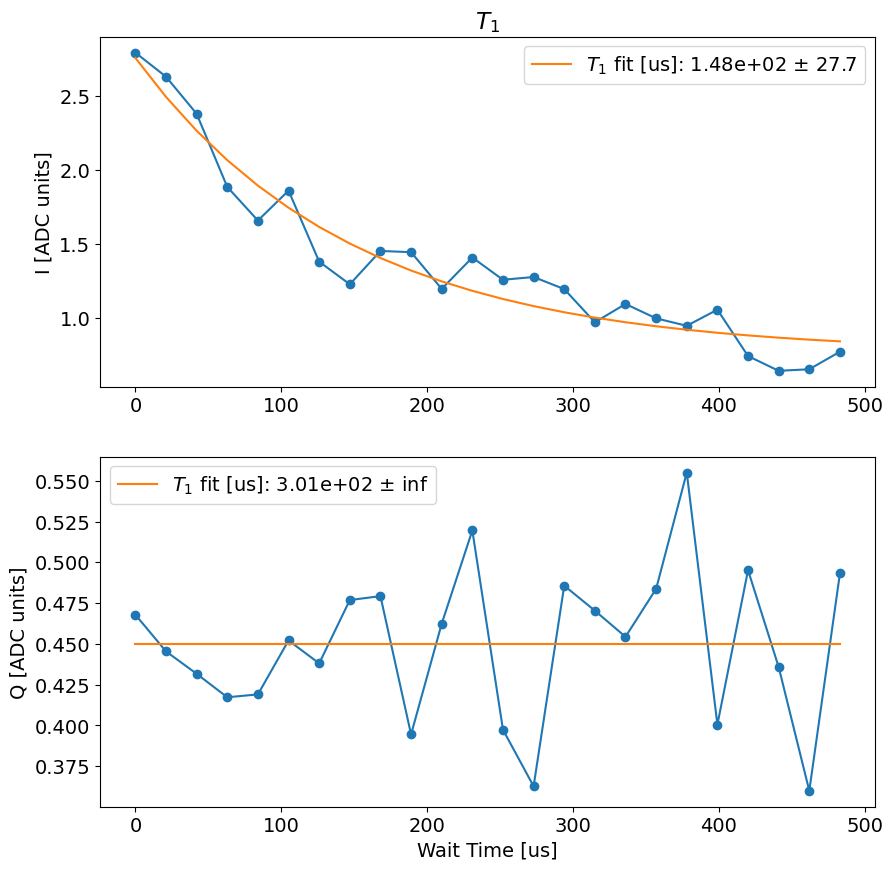

432.25258111953735


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.16456662060715596
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00048_t1_qubit3.h5
Fit T1 avgi [us]: 332.7655603983311
Fit T1 avgq [us]: -157.11517544123745


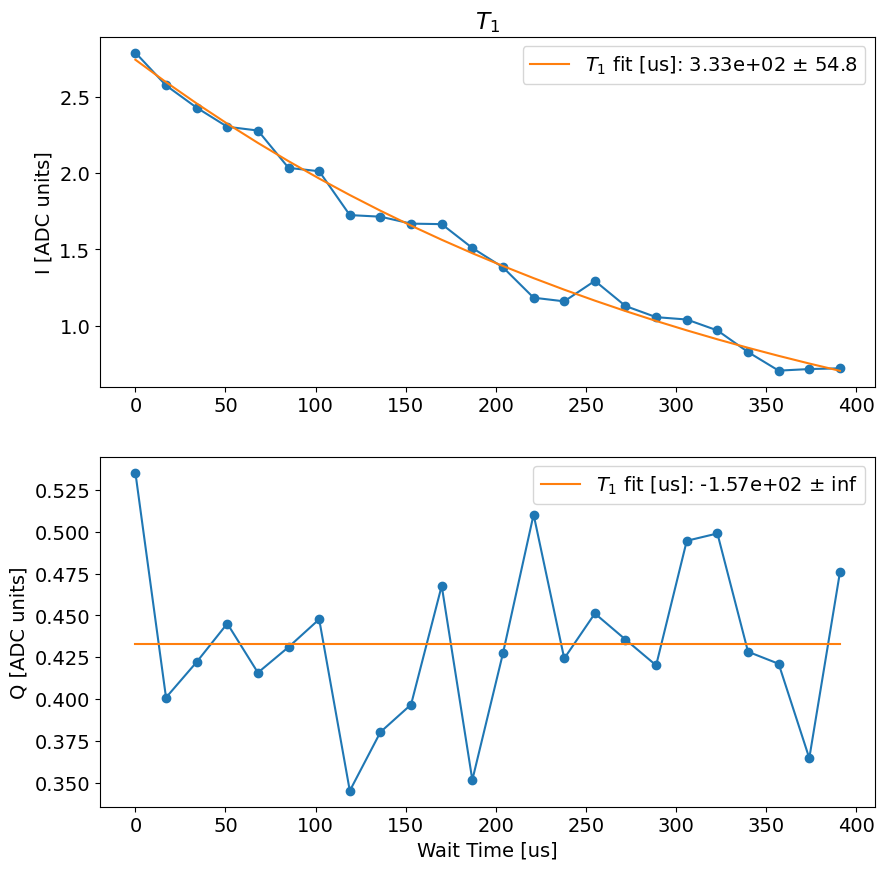

440.6139426231384


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.18552527760897847
t1_q error:fit ratio= 7053.828475874704
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00049_t1_qubit3.h5
Fit T1 avgi [us]: 168.96087742117766
Fit T1 avgq [us]: 202507.85999775512


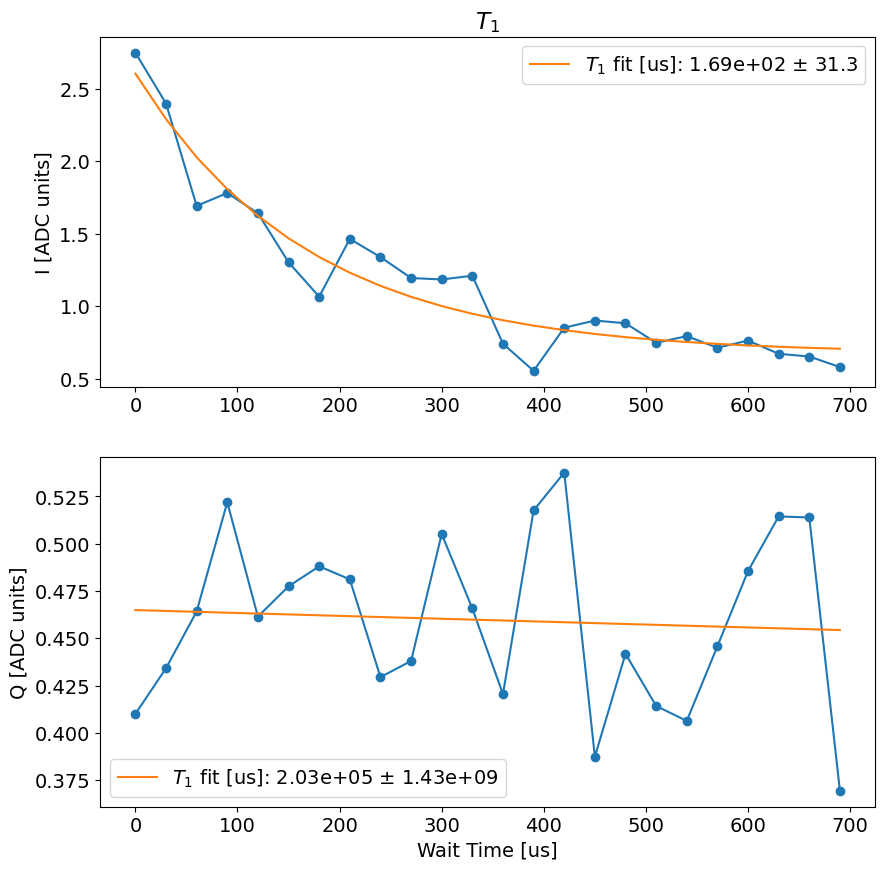

449.99258303642273


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.14346952493101084
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00050_t1_qubit3.h5
Fit T1 avgi [us]: 149.09374361479152
Fit T1 avgq [us]: 66.47746334933514


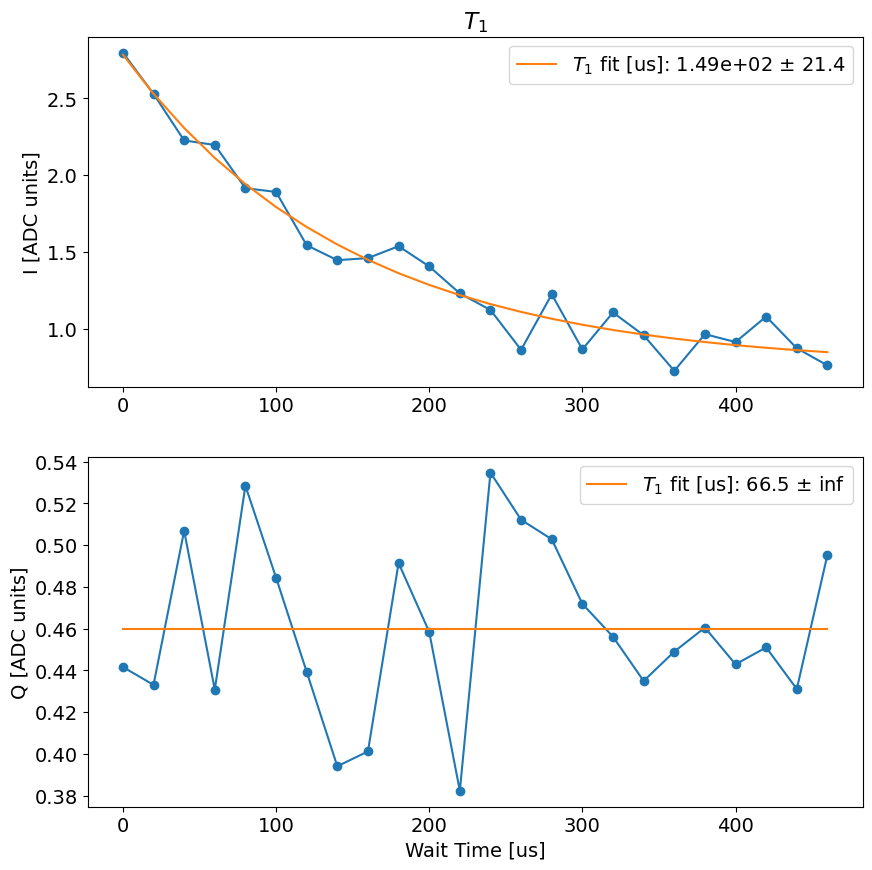

458.5131866931915


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.21181210122078464
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00051_t1_qubit3.h5
Fit T1 avgi [us]: 195.69245398553213
Fit T1 avgq [us]: 262.8939874299598


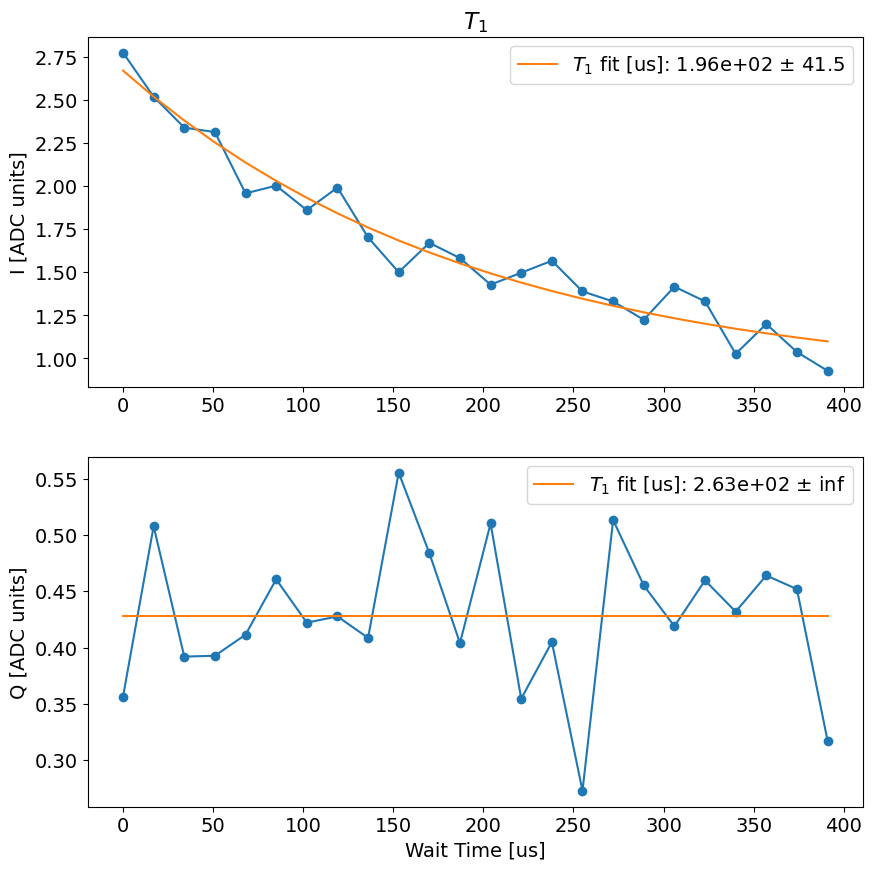

466.89621019363403


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.16804293338493037
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00052_t1_qubit3.h5
Fit T1 avgi [us]: 253.34281794431973
Fit T1 avgq [us]: 76.77443219054747


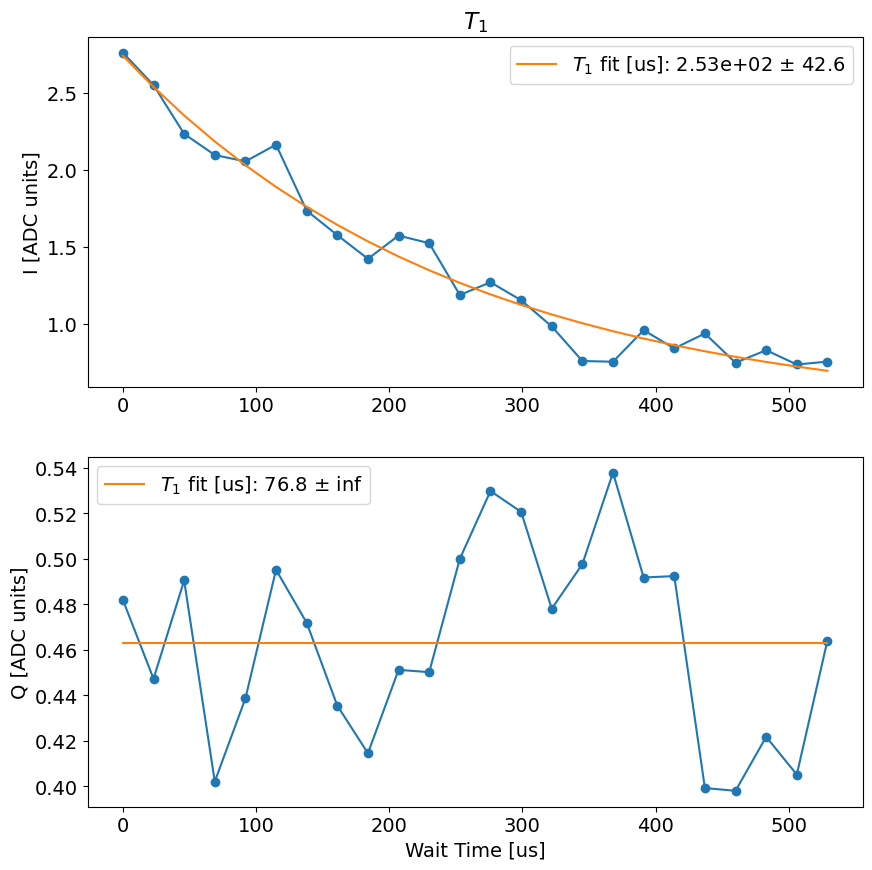

475.656564950943


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.12252466349580989
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00053_t1_qubit3.h5
Fit T1 avgi [us]: 193.66274787530233
Fit T1 avgq [us]: 181.87608595501683


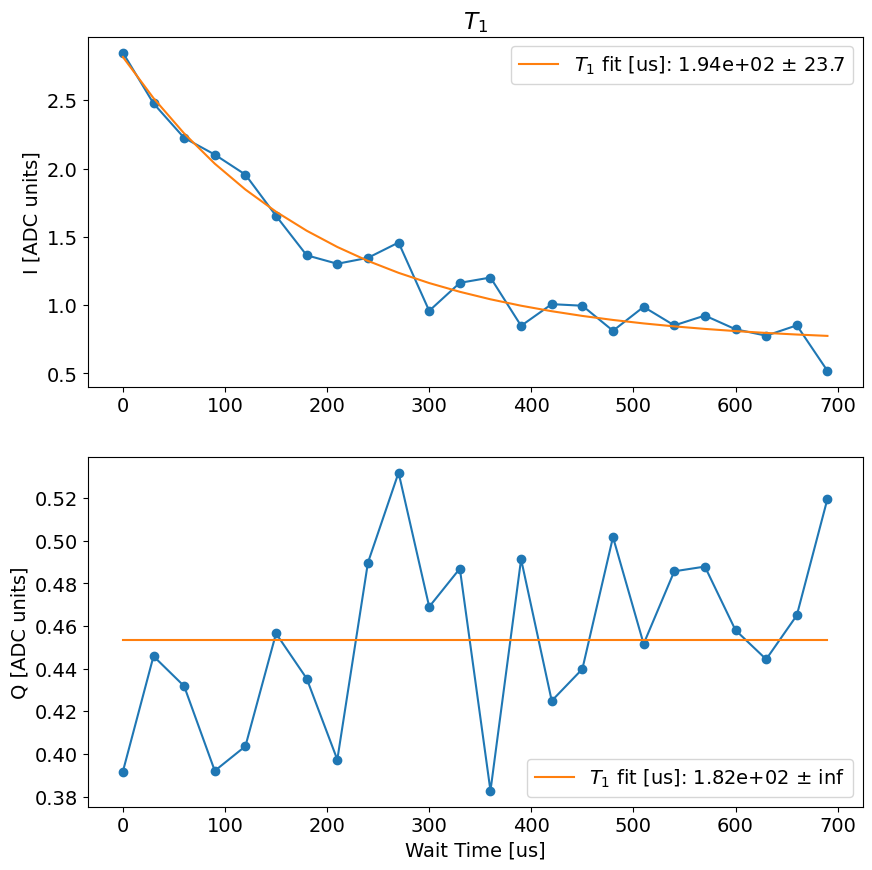

485.0776860713959


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.2720058389683489
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00054_t1_qubit3.h5
Fit T1 avgi [us]: 219.72235112732216
Fit T1 avgq [us]: 145.174463341062


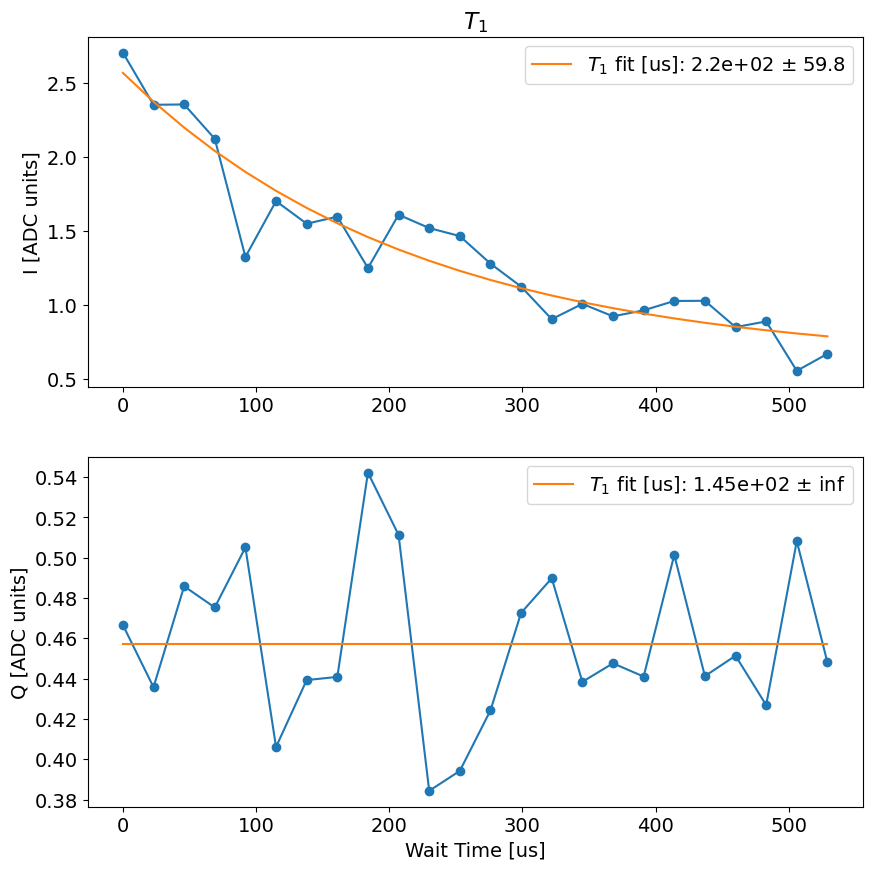

493.83688831329346


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.18941720277550345
t1_q error:fit ratio= 2072.948610760059
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00055_t1_qubit3.h5
Fit T1 avgi [us]: 231.2657335466164
Fit T1 avgq [us]: 231293.6690091061


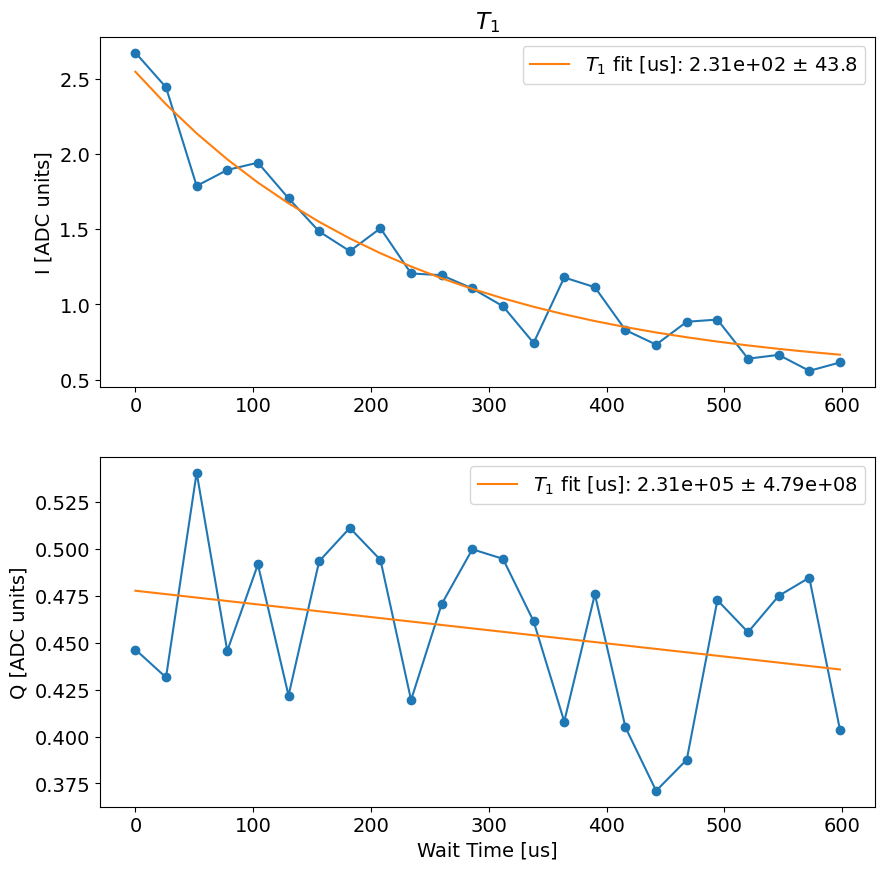

502.8209698200226


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.18902713289300882
t1_q error:fit ratio= 1.3928839577414969
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00056_t1_qubit3.h5
Fit T1 avgi [us]: 205.75418956267706
Fit T1 avgq [us]: 104.71159818763034


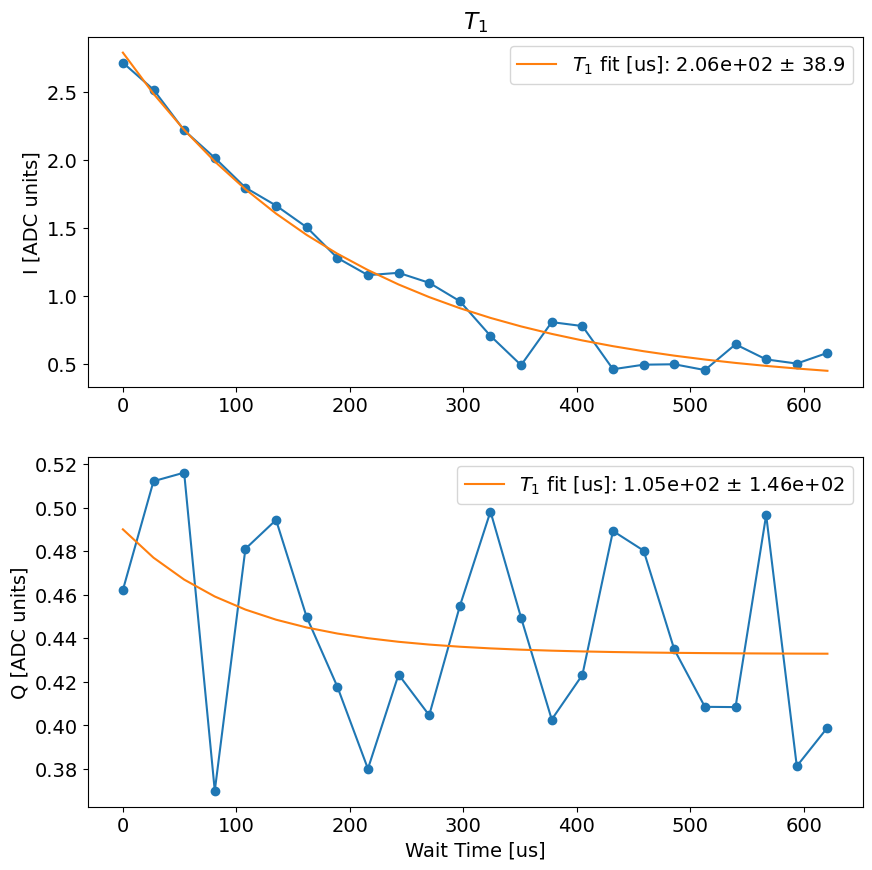

511.9236693382263


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.15786572417324204
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00057_t1_qubit3.h5
Fit T1 avgi [us]: 251.4386010793805
Fit T1 avgq [us]: 298.2610299679813


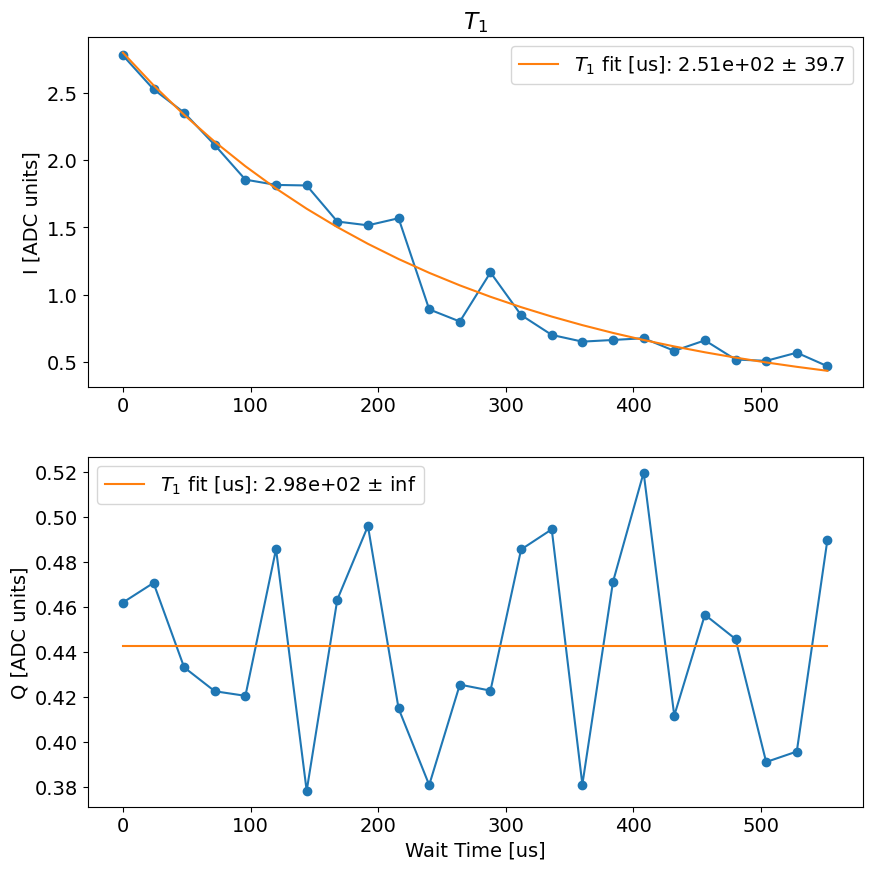

520.7647376060486


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1414026581734925
t1_q error:fit ratio= 1.811891661413542
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00058_t1_qubit3.h5
Fit T1 avgi [us]: 205.69966978478064
Fit T1 avgq [us]: 40.11642683536853


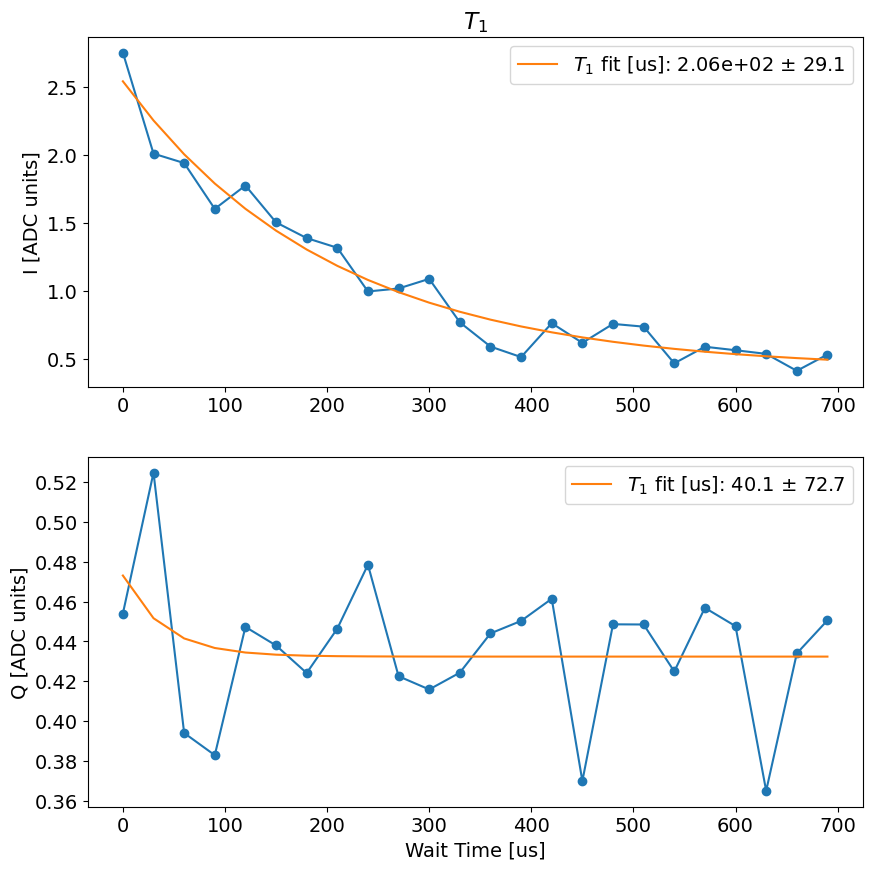

530.1387882232666


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.22758721387912567
t1_q error:fit ratio= 0.8526758328426788
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00059_t1_qubit3.h5
Fit T1 avgi [us]: 321.2370909695834
Fit T1 avgq [us]: 75.07948121019801


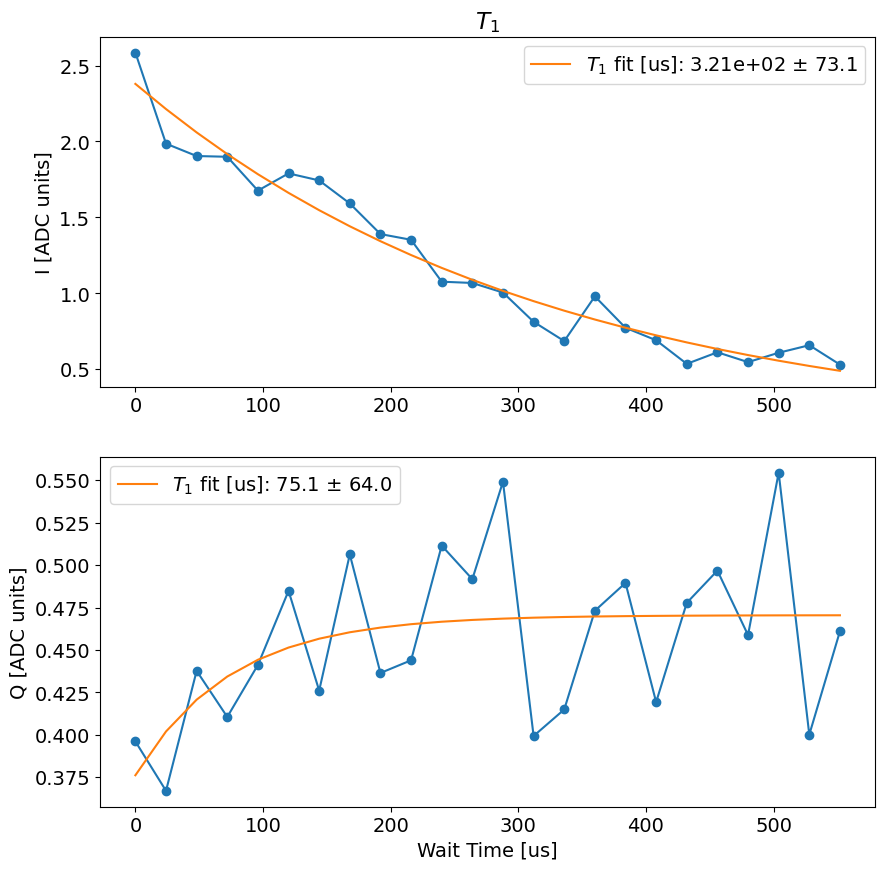

538.9568963050842


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.09602168305368694
t1_q error:fit ratio= 2.426770461211777
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00060_t1_qubit3.h5
Fit T1 avgi [us]: 198.8936562436051
Fit T1 avgq [us]: 122.2904153213991


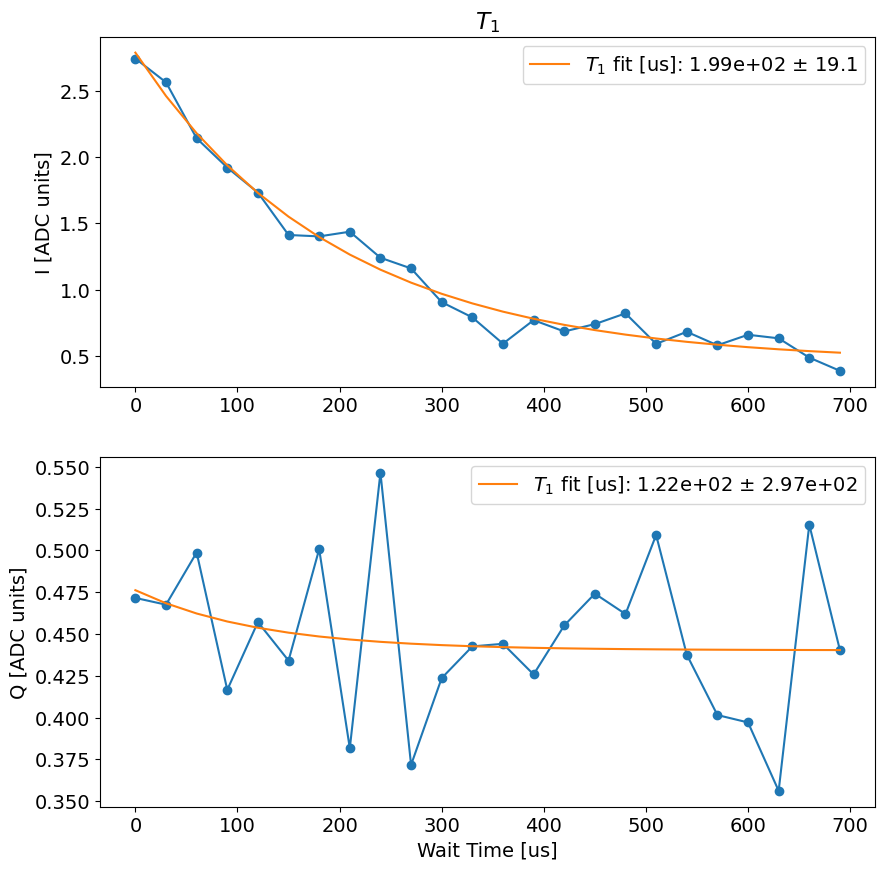

548.3104064464569


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.10736575588737429
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00061_t1_qubit3.h5
Fit T1 avgi [us]: 150.93169879373573
Fit T1 avgq [us]: 191.42742034429432


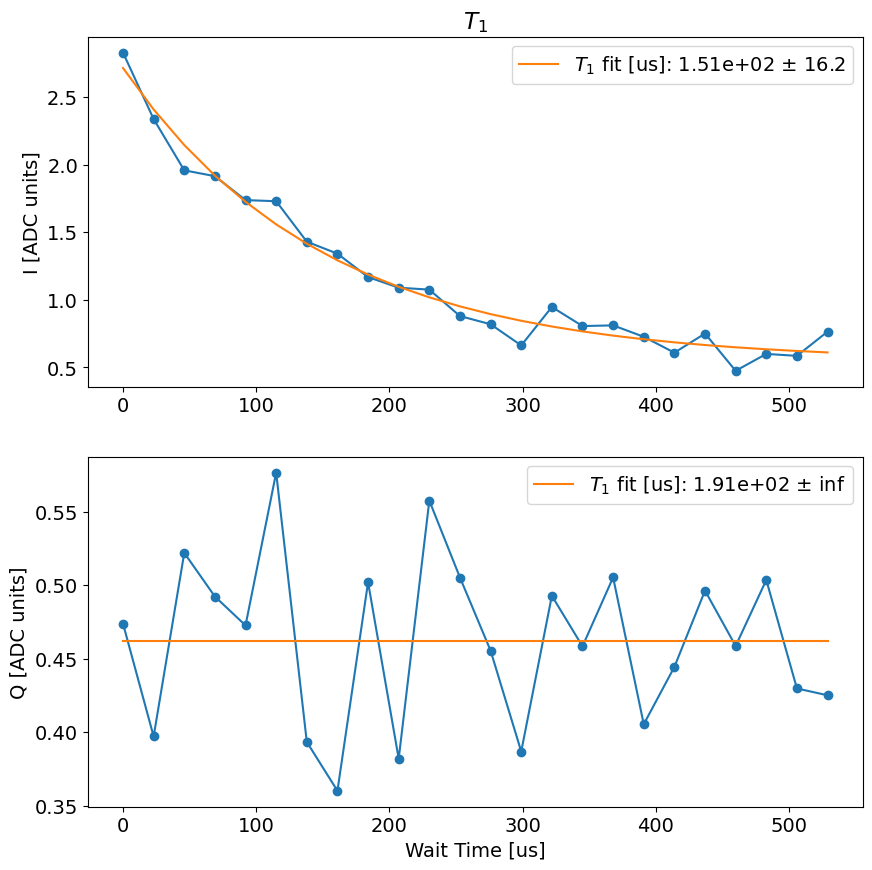

557.3954238891602


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.15665315976925065
t1_q error:fit ratio= 1.6669975251068214
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00062_t1_qubit3.h5
Fit T1 avgi [us]: 164.7948717757712
Fit T1 avgq [us]: 84.13394206277553


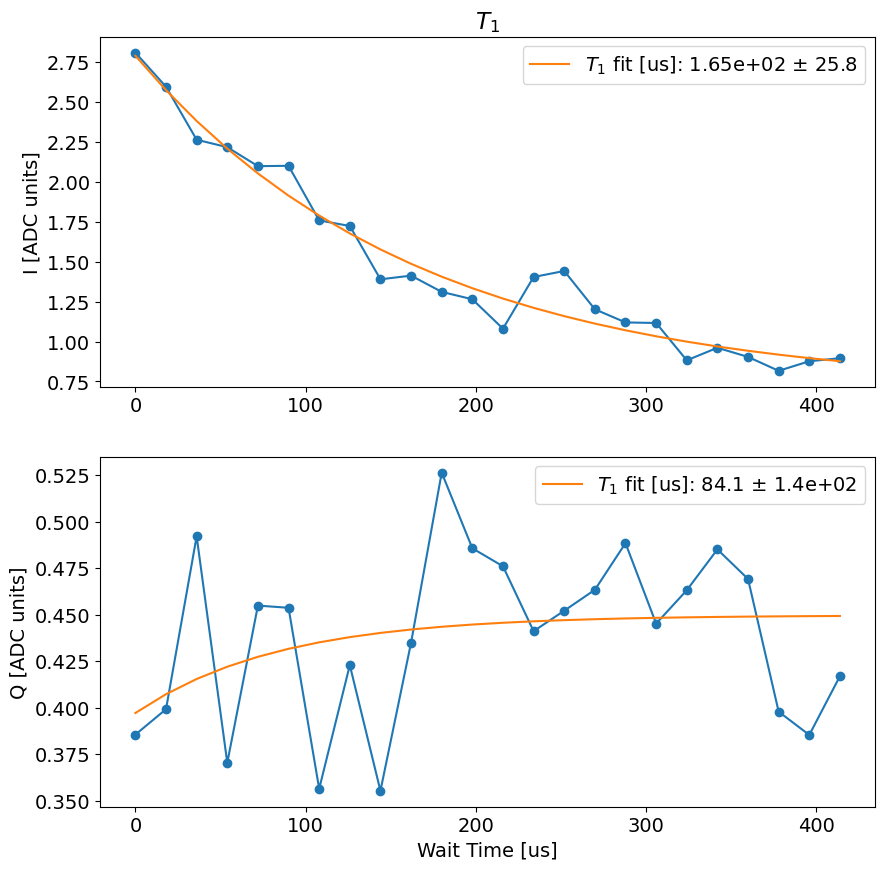

565.8711440563202


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.18523286829172844
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00063_t1_qubit3.h5
Fit T1 avgi [us]: 229.94093127003907
Fit T1 avgq [us]: 131.2056314065866


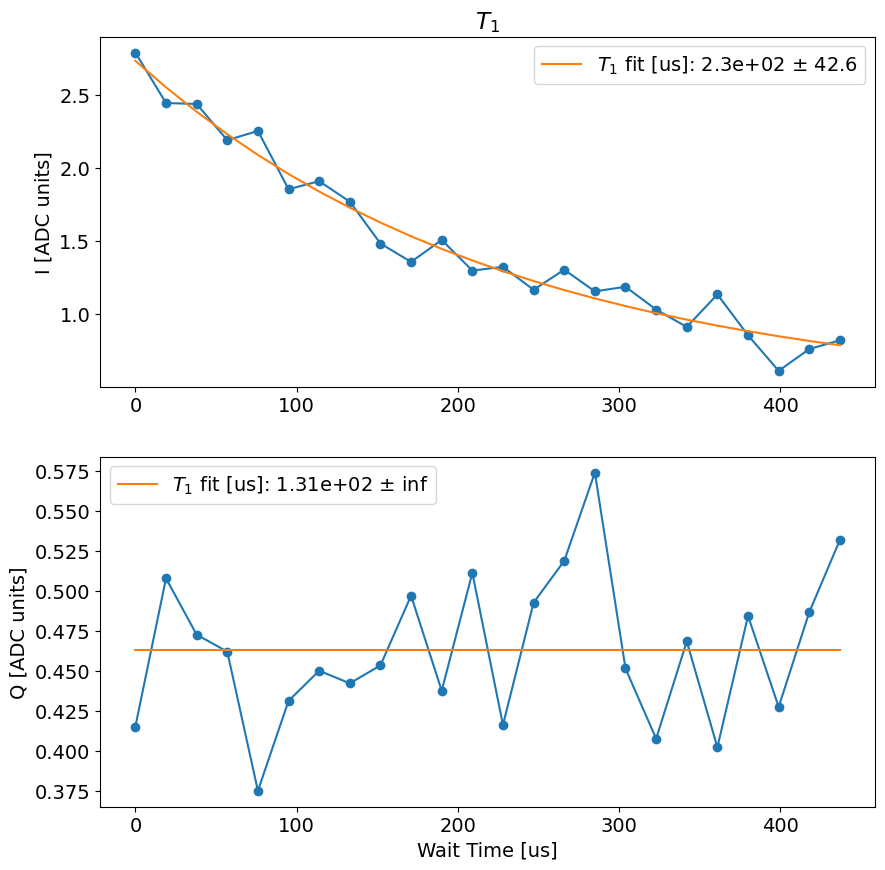

574.3219470977783


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.07844217019255495
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00064_t1_qubit3.h5
Fit T1 avgi [us]: 187.67352930567318
Fit T1 avgq [us]: 398.2527875700425


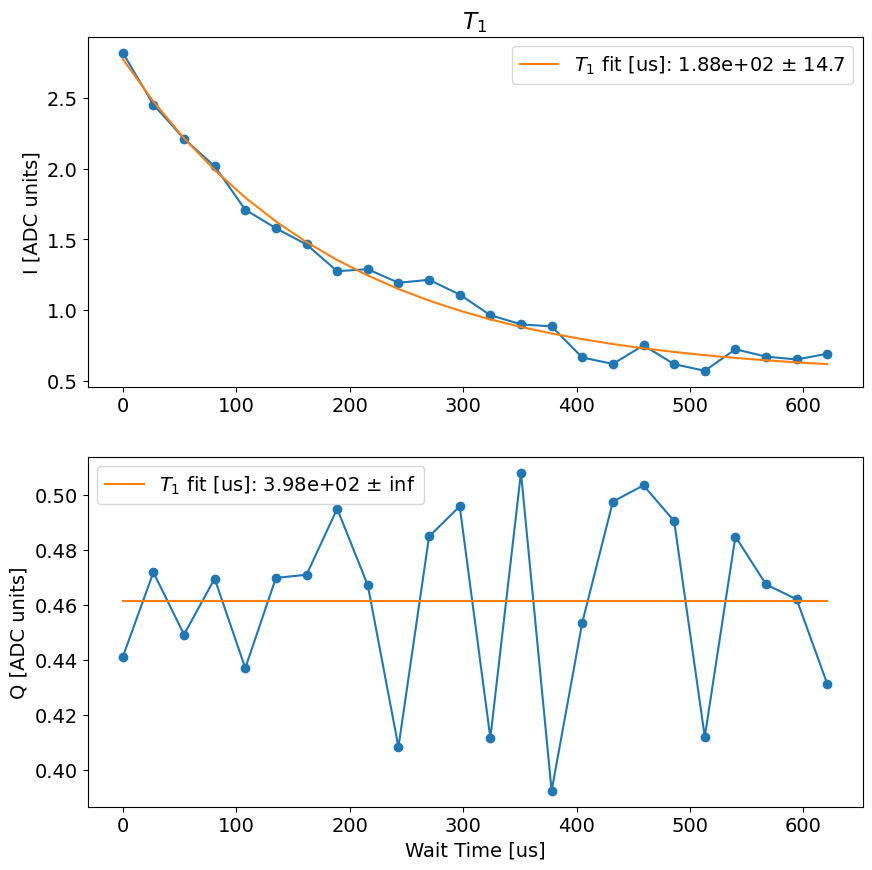

583.4076805114746


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1846025832273884
t1_q error:fit ratio= 8164.320784513632
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00065_t1_qubit3.h5
Fit T1 avgi [us]: 309.8198676531183
Fit T1 avgq [us]: 467638.15824769624


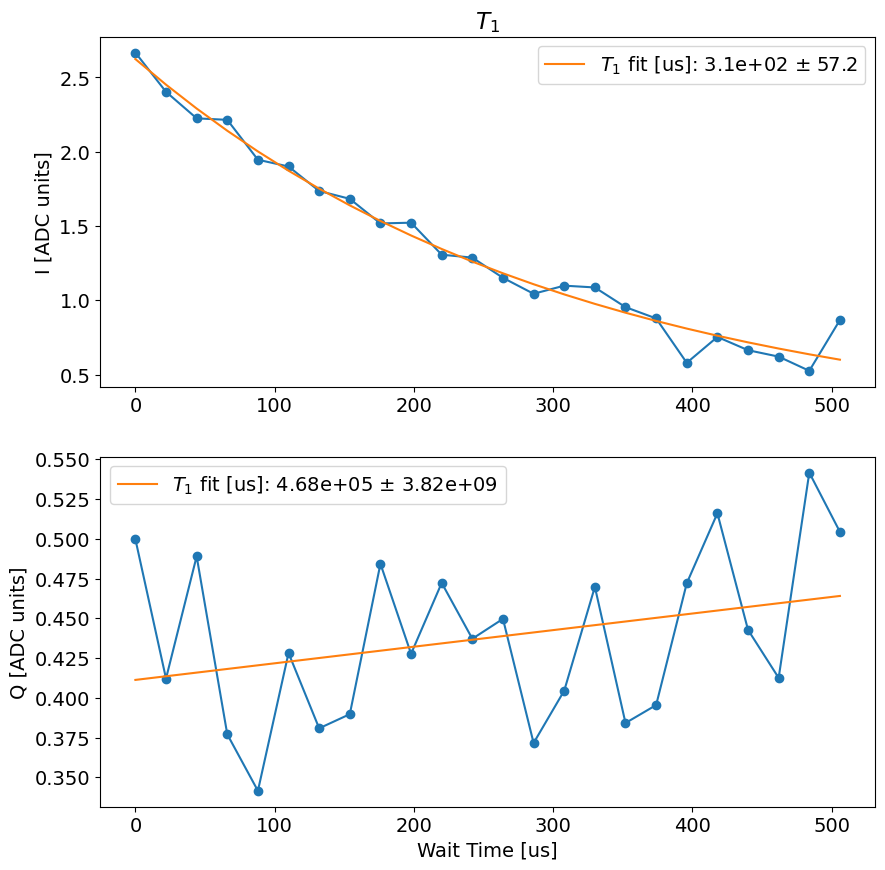

592.2107419967651


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.07520757639540725
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00066_t1_qubit3.h5
Fit T1 avgi [us]: 191.36569113655193
Fit T1 avgq [us]: 529.587724031099


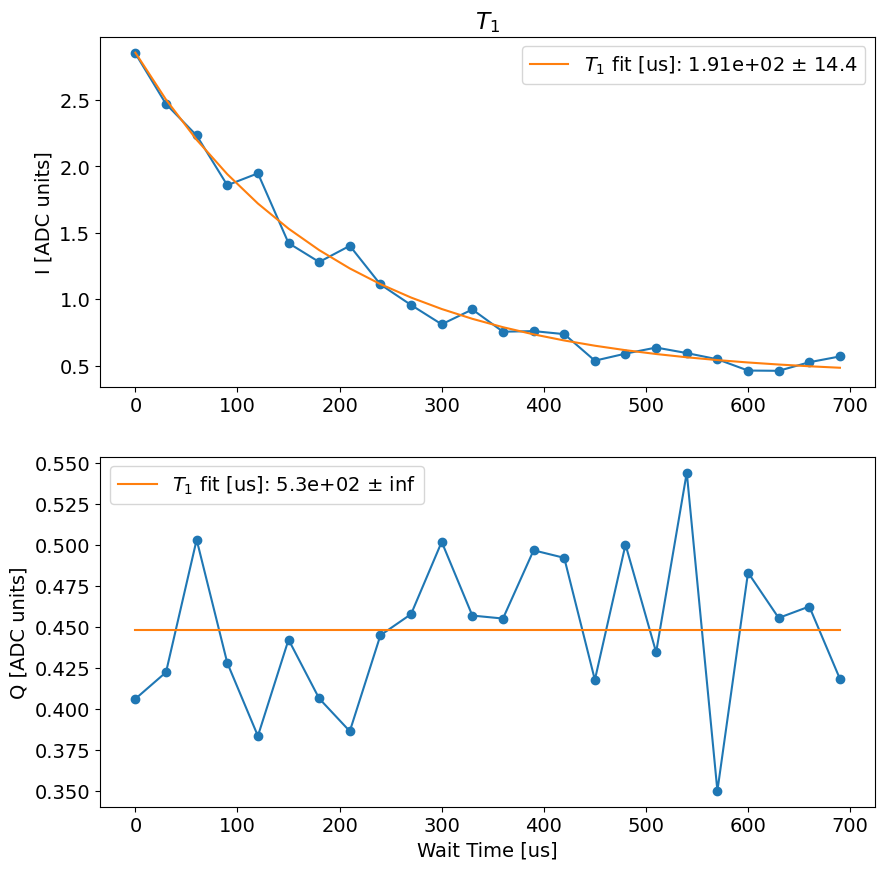

601.5949242115021


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.28122653874098064
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00067_t1_qubit3.h5
Fit T1 avgi [us]: 425.2885720655102
Fit T1 avgq [us]: 222.86868586008887


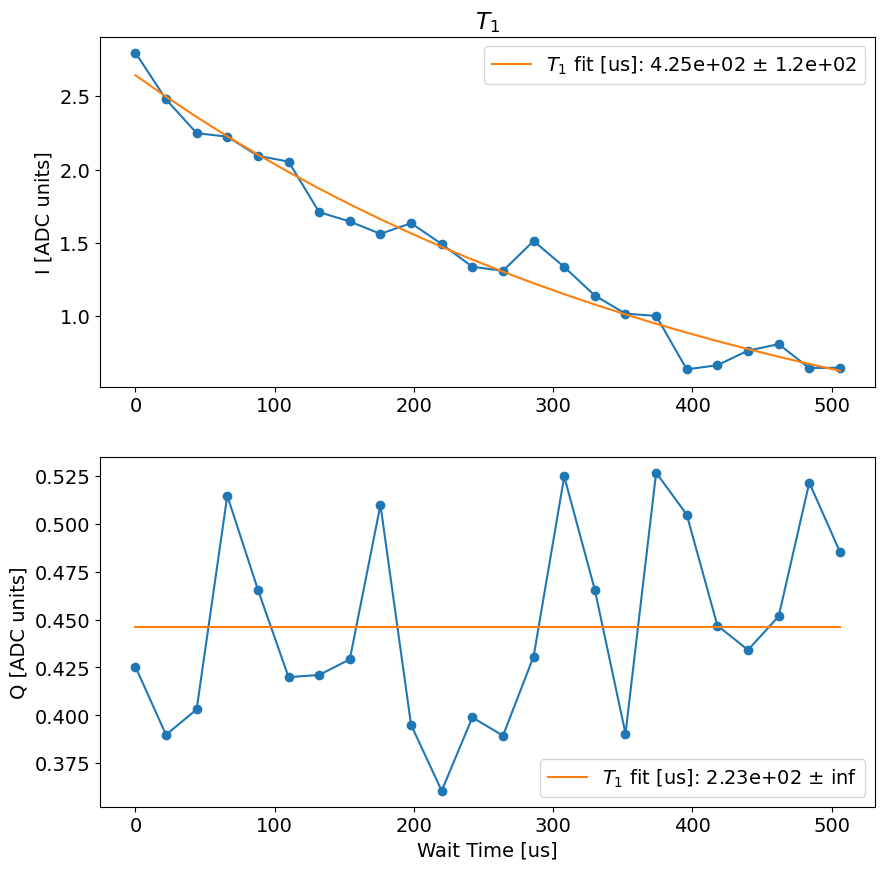

610.258985042572


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1129714728436923
t1_q error:fit ratio= 1829.2036281726523
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00068_t1_qubit3.h5
Fit T1 avgi [us]: 261.1708577987237
Fit T1 avgq [us]: 238817.49013605894


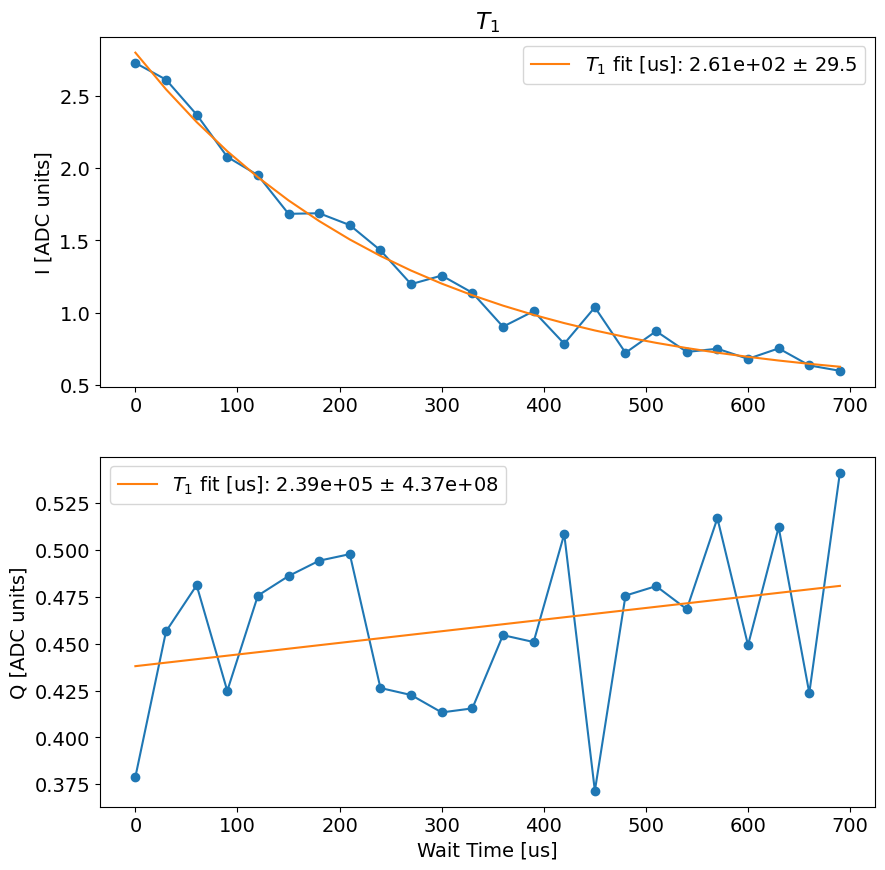

619.5959732532501


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.19414640700912844
t1_q error:fit ratio= 11096.488190498607
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00069_t1_qubit3.h5
Fit T1 avgi [us]: 291.1978957383267
Fit T1 avgq [us]: 596779.0850641885


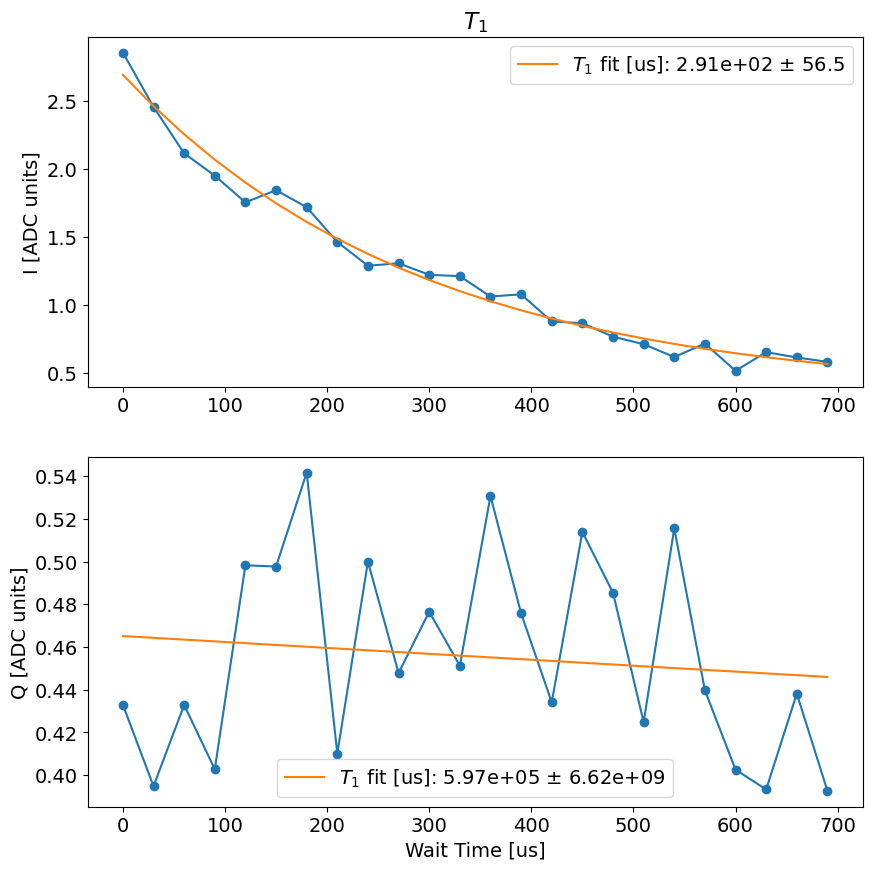

628.9579339027405


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.42496131155592143
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00070_t1_qubit3.h5
Fit T1 avgi [us]: 288.3992005126404
Fit T1 avgq [us]: 1.2514968958545127


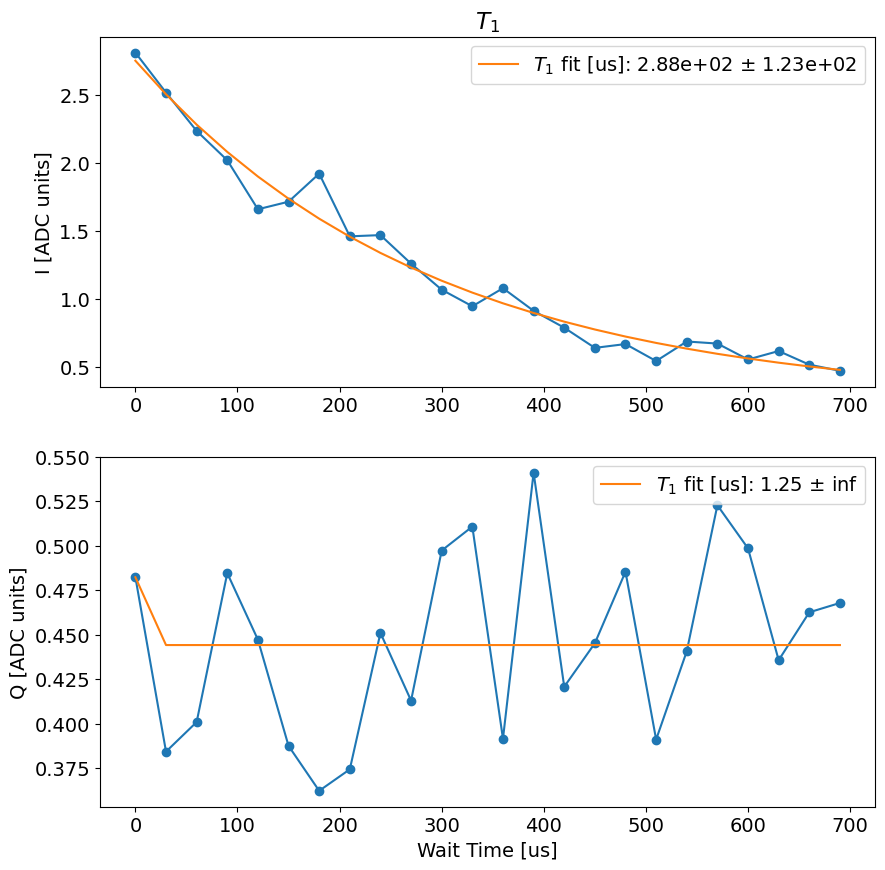

638.2881560325623


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.10997303131610668
t1_q error:fit ratio= 2.4636703929691195
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00071_t1_qubit3.h5
Fit T1 avgi [us]: 240.1007110122997
Fit T1 avgq [us]: 28.959587976792886


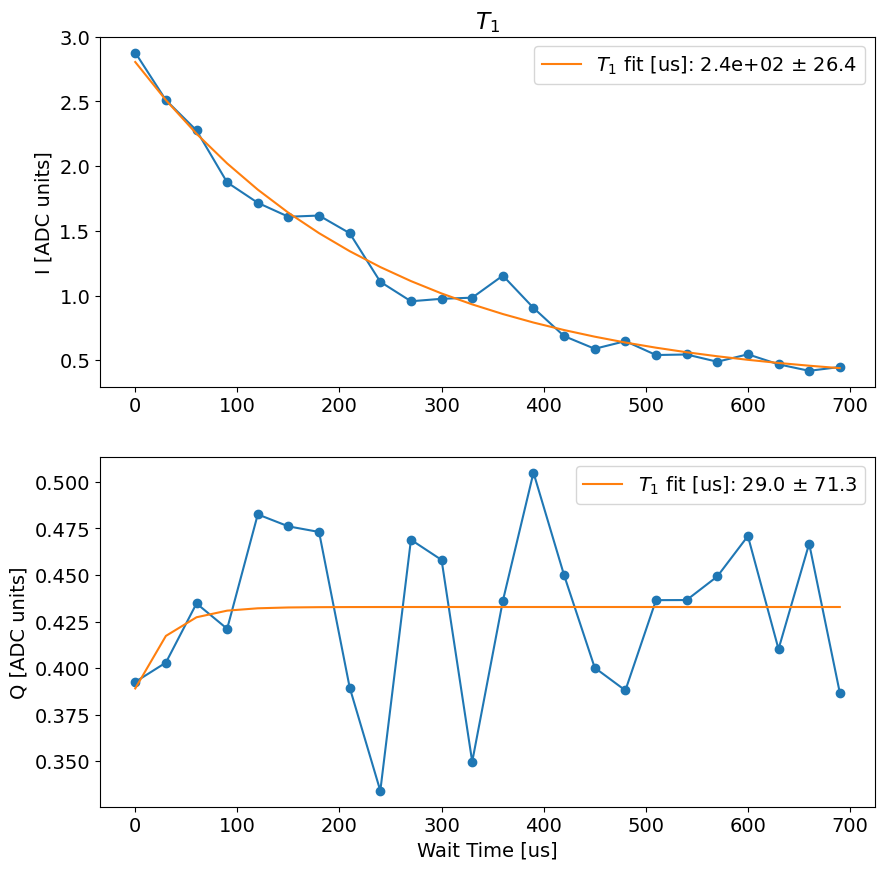

647.6572914123535


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.0
t1_q error:fit ratio= 5.015584803497164
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00072_t1_qubit3.h5
Fit T1 avgi [us]: 206.48288217490654
Fit T1 avgq [us]: 124.97029380570528


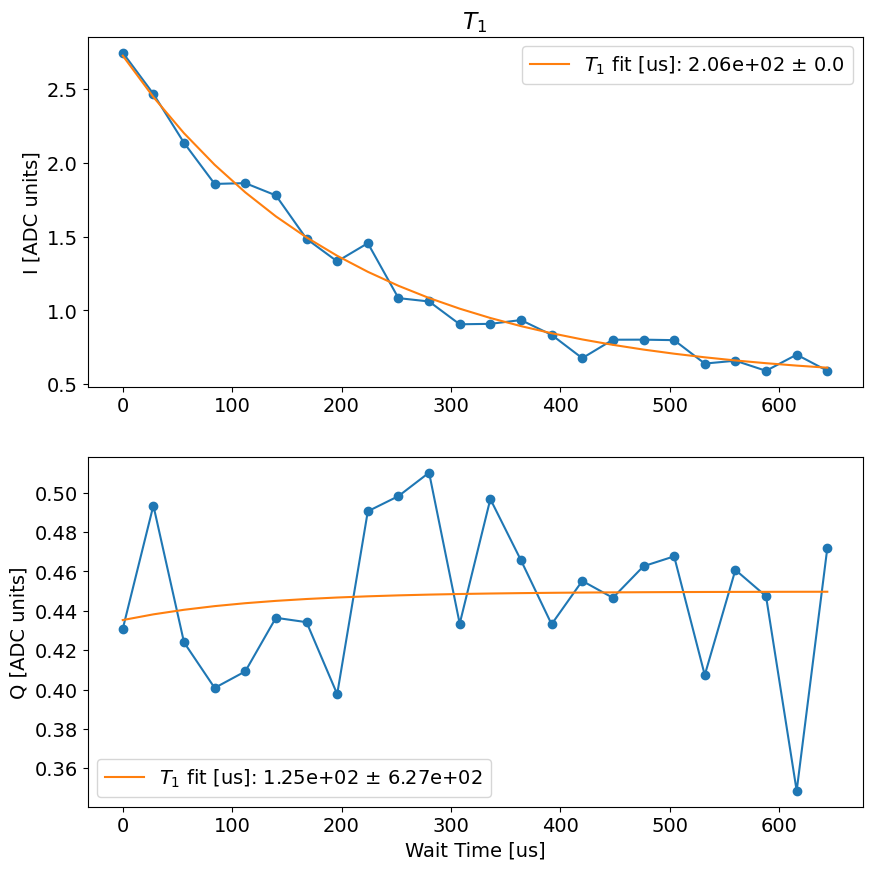

656.8429815769196


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.11221248368020634
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00073_t1_qubit3.h5
Fit T1 avgi [us]: 198.38247797152377
Fit T1 avgq [us]: -127.30923139845098


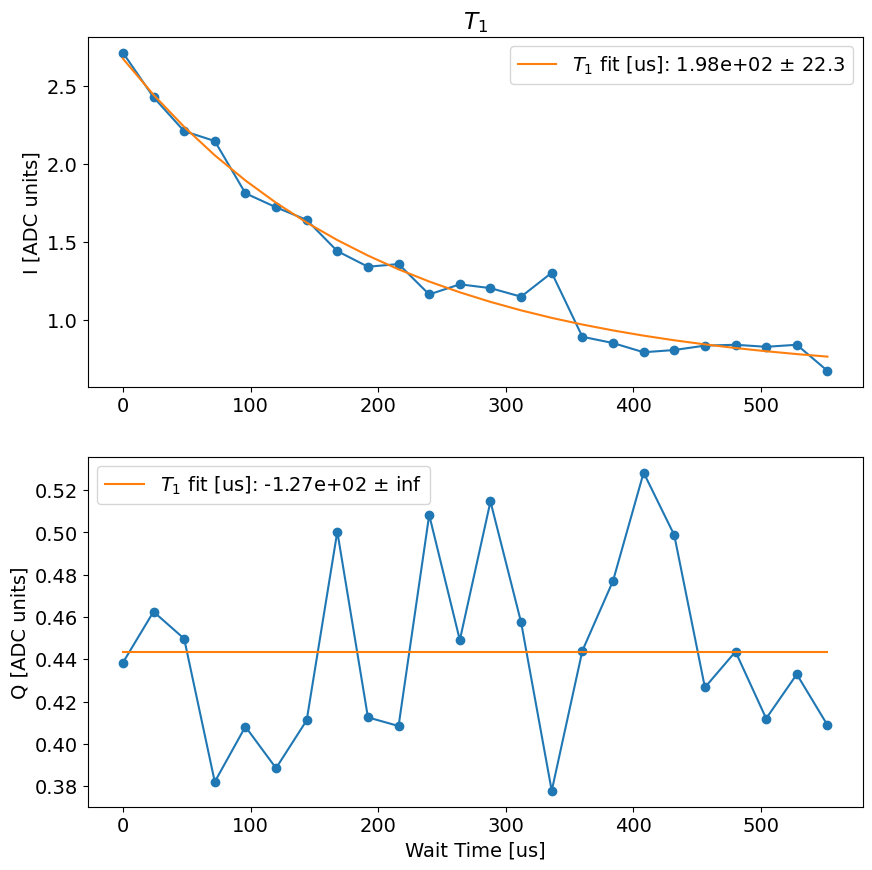

665.6966600418091


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.15119206644977176
t1_q error:fit ratio= 2.349803584322729
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00074_t1_qubit3.h5
Fit T1 avgi [us]: 344.4319579056606
Fit T1 avgq [us]: 24.97592782772545


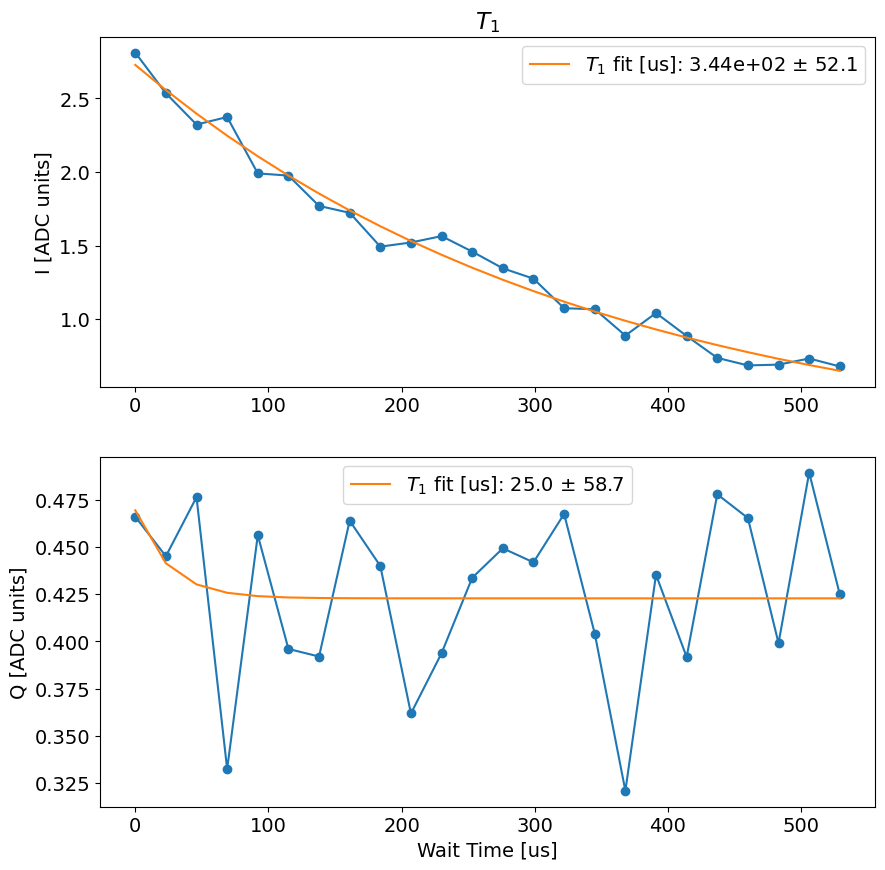

674.4098057746887


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.07173940850830396
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00075_t1_qubit3.h5
Fit T1 avgi [us]: 211.02484858324692
Fit T1 avgq [us]: 209.81279836408834


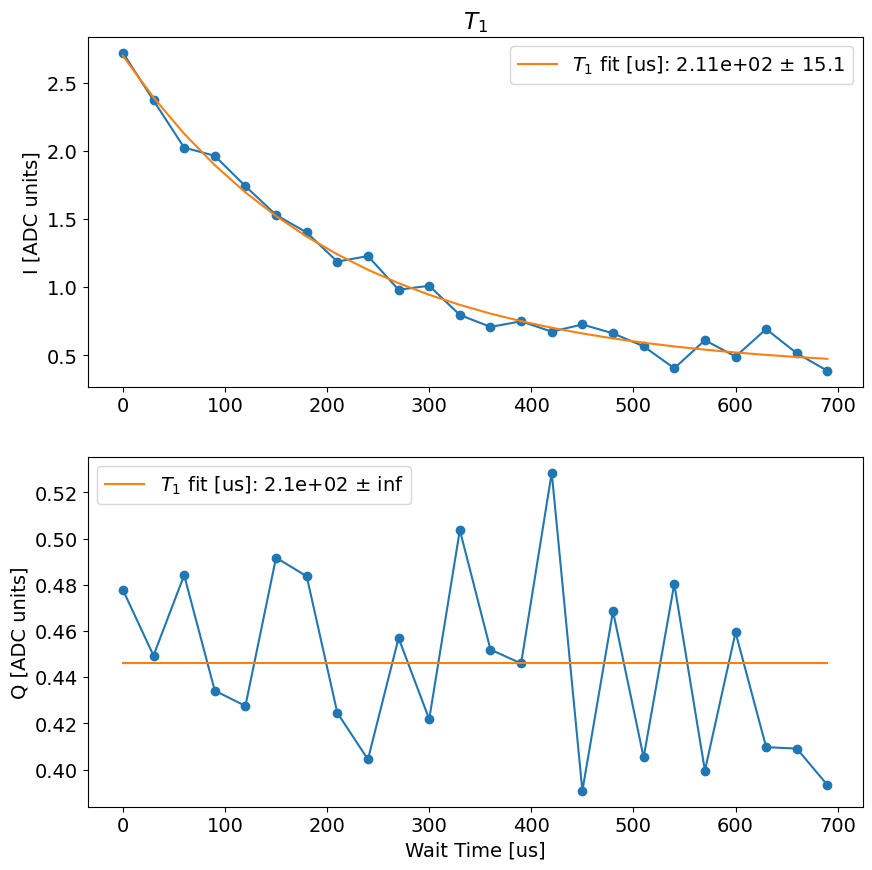

683.7719340324402


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1307992837257787
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00076_t1_qubit3.h5
Fit T1 avgi [us]: 222.9469302138076
Fit T1 avgq [us]: -44.54716122837769


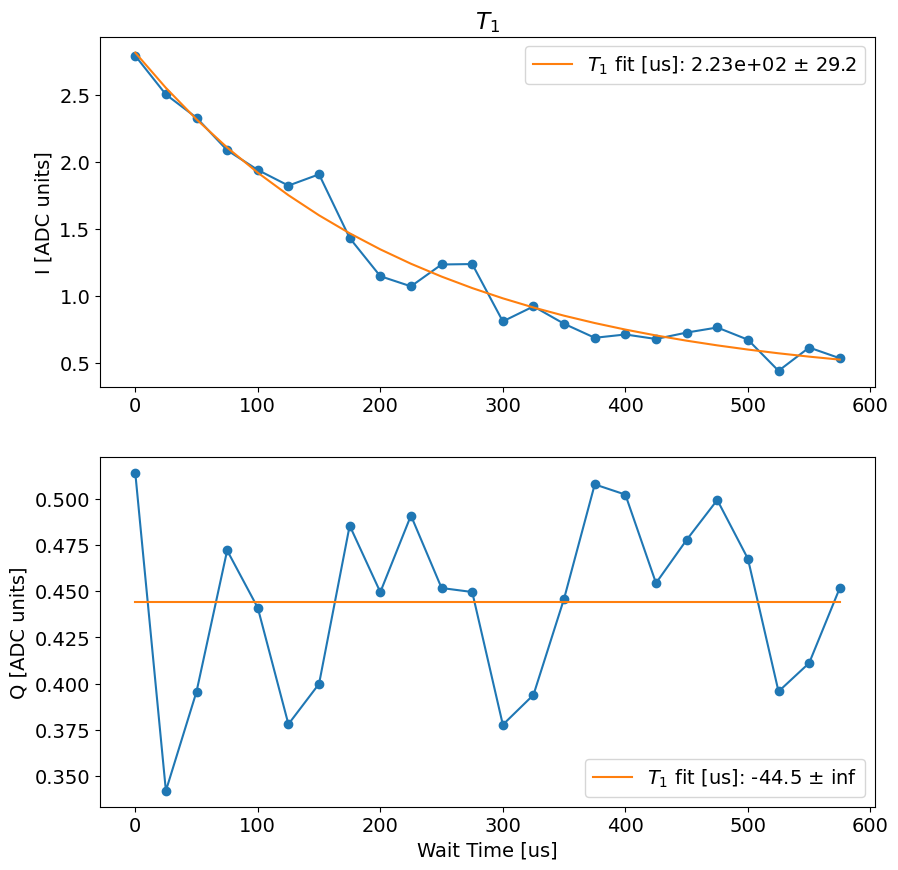

692.786618232727


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.09092317208031221
t1_q error:fit ratio= -12.619337640562561
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00077_t1_qubit3.h5
Fit T1 avgi [us]: 140.68502315981013
Fit T1 avgq [us]: -1509.6337762329667


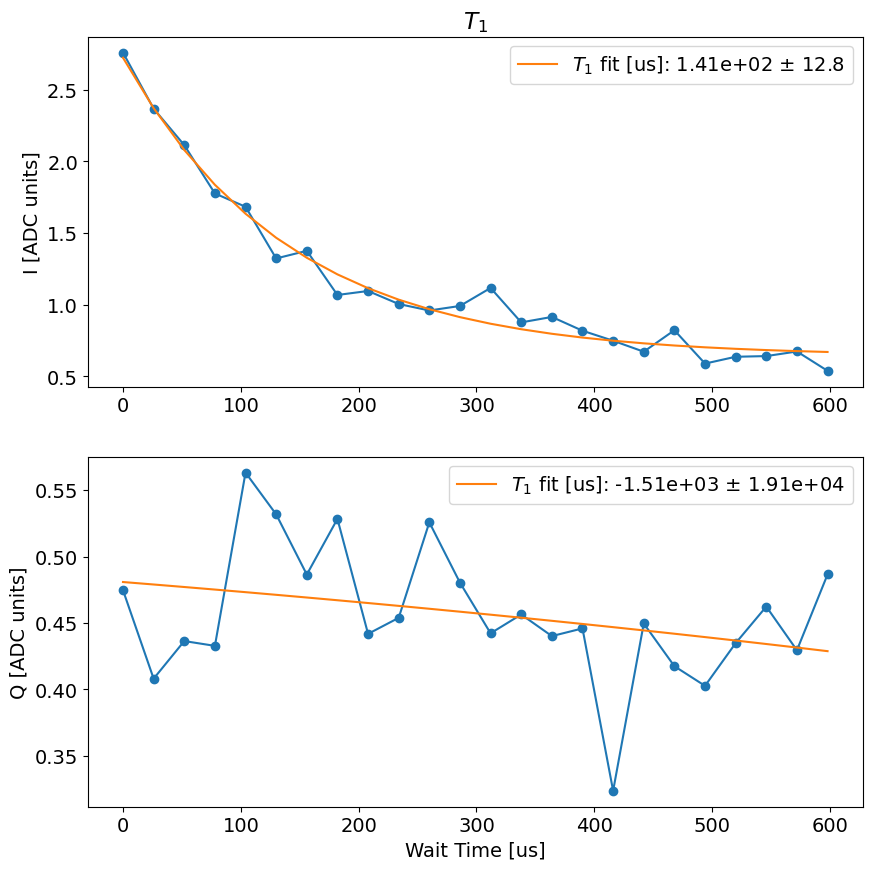

701.8384795188904


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.22070206515686905
t1_q error:fit ratio= 2769.644048440951
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00078_t1_qubit3.h5
Fit T1 avgi [us]: 128.59164944394092
Fit T1 avgq [us]: 117613.76885175813


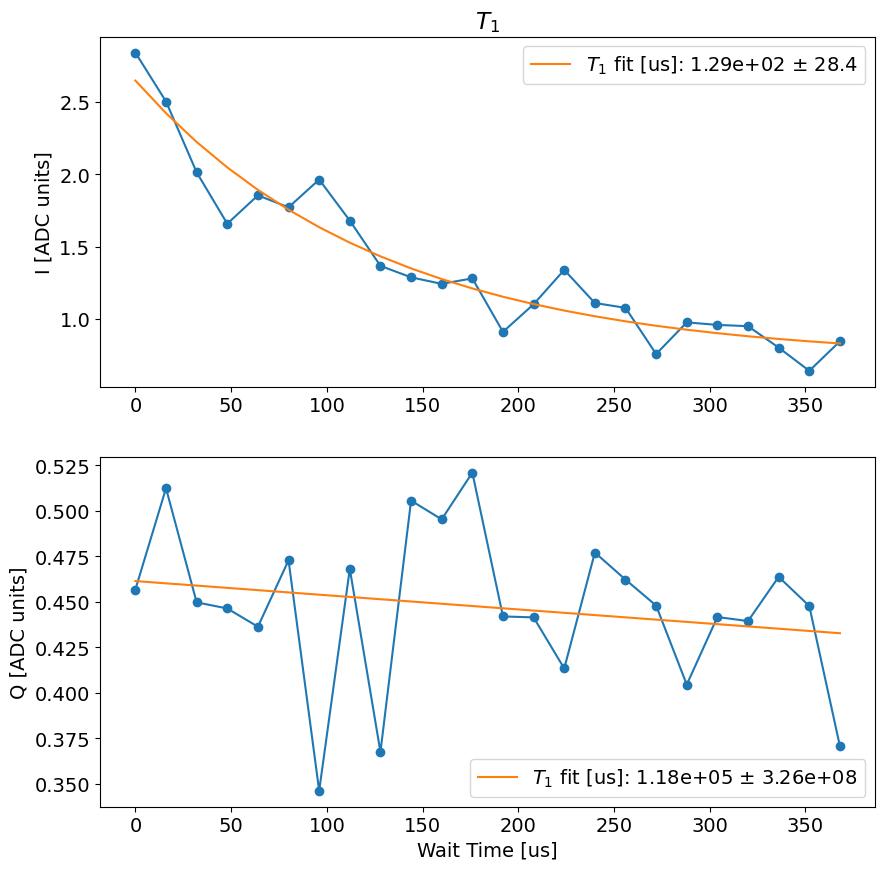

710.494922876358


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.2766559584814552
t1_q error:fit ratio= 1.7405558769541536
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00079_t1_qubit3.h5
Fit T1 avgi [us]: 144.48383778803995
Fit T1 avgq [us]: 24.637069990648502


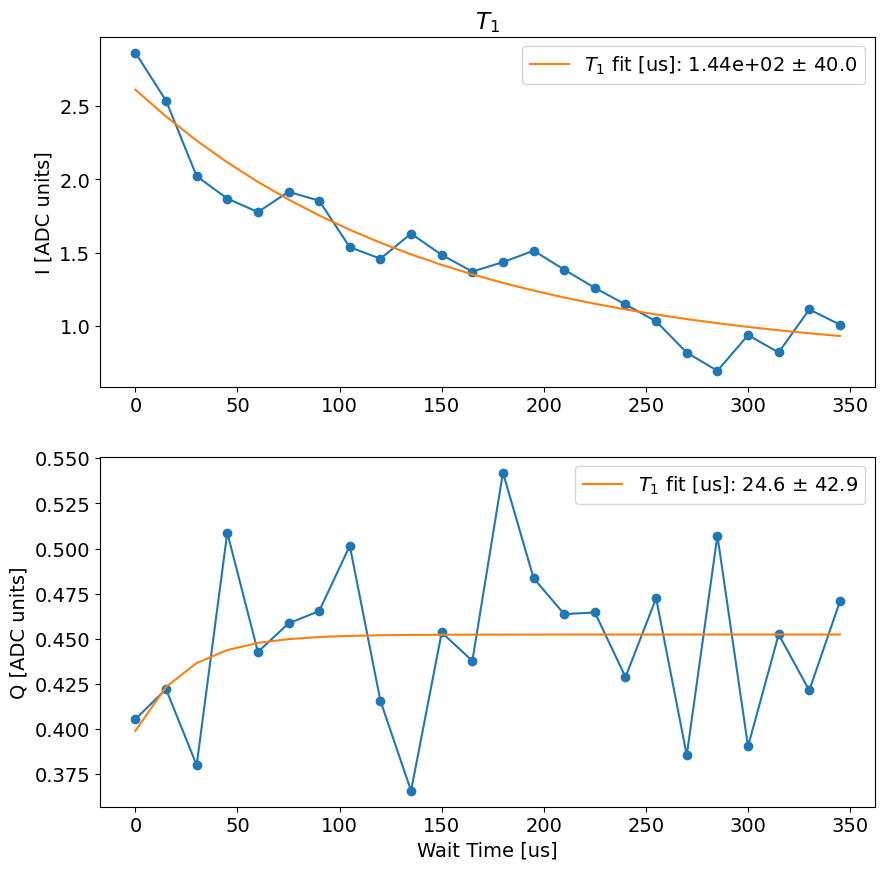

718.7400531768799


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.14884066411521682
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00080_t1_qubit3.h5
Fit T1 avgi [us]: 122.42275163419092
Fit T1 avgq [us]: 99.34169572704437


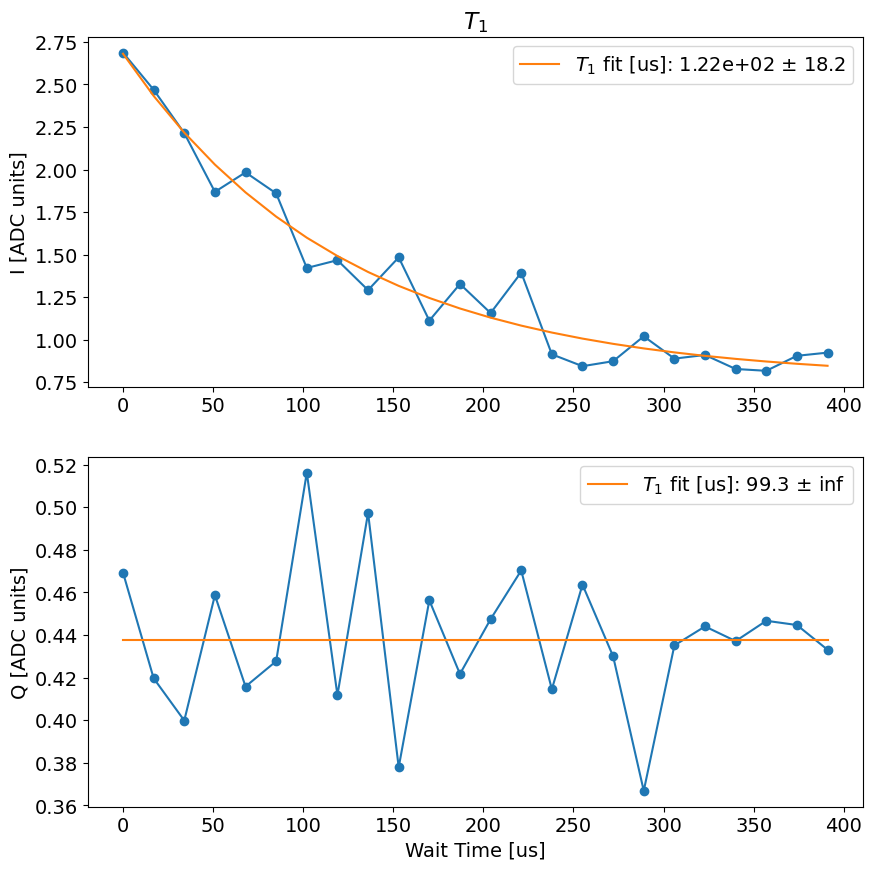

727.2627227306366


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.17656246220332292
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00081_t1_qubit3.h5
Fit T1 avgi [us]: 144.72710403343808
Fit T1 avgq [us]: -200.74378551792594


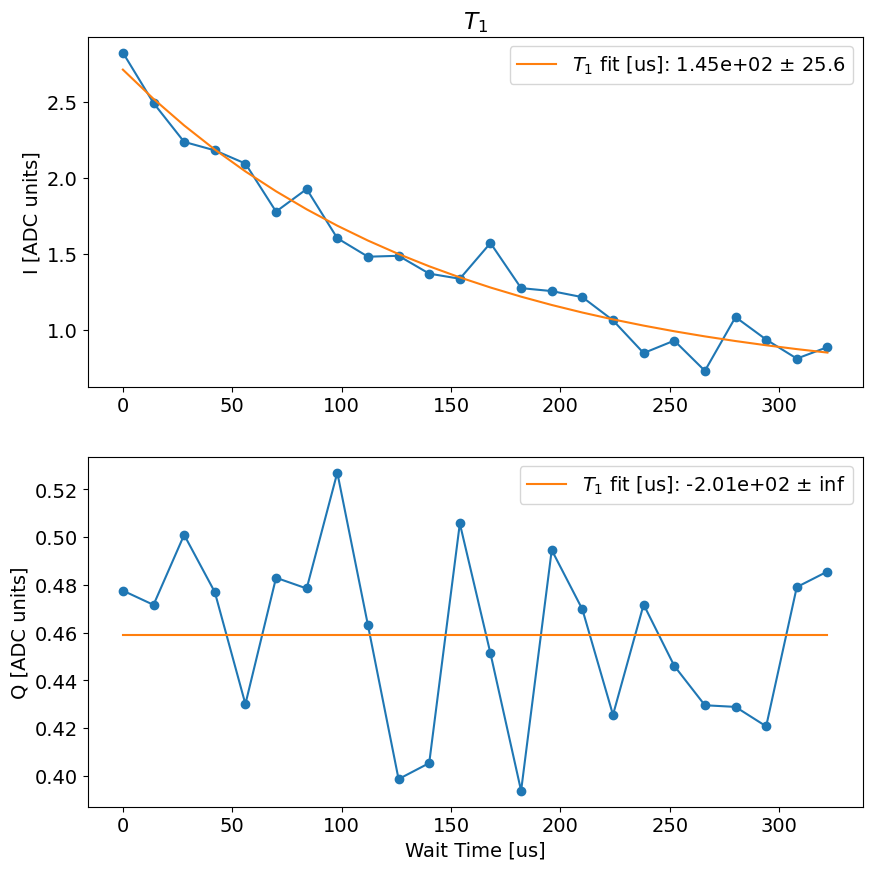

735.3342037200928


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.25629720018296204
t1_q error:fit ratio= 0.7964703976424546
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00082_t1_qubit3.h5
Fit T1 avgi [us]: 343.34256087265123
Fit T1 avgq [us]: 59.77763631892483


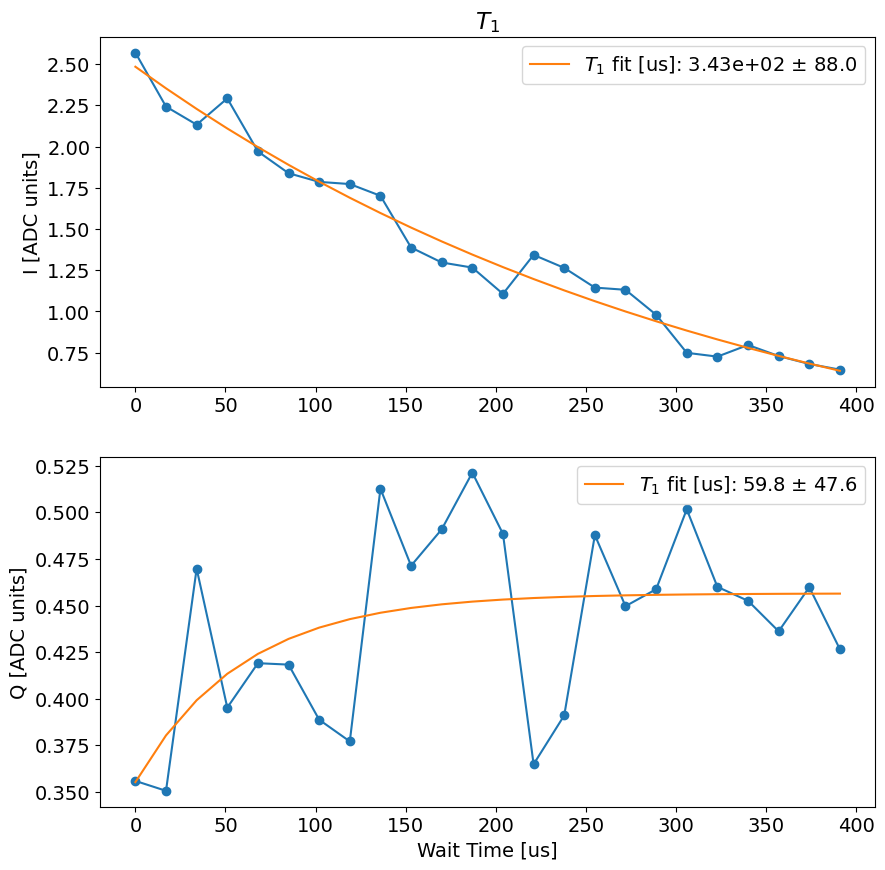

743.7052822113037


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.12162345812016
t1_q error:fit ratio= -inf
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00083_t1_qubit3.h5
Fit T1 avgi [us]: 221.6651235831404
Fit T1 avgq [us]: -104.32756038375271


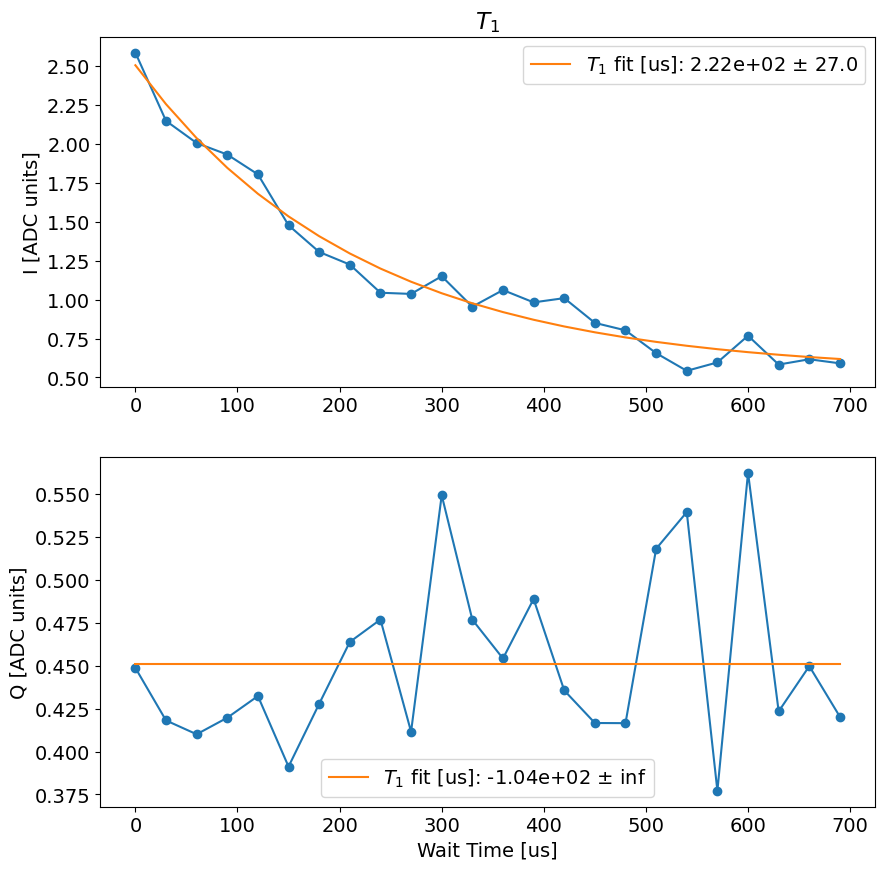

753.0493230819702


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1509772922382393
t1_q error:fit ratio= 0.6197969328134155
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00084_t1_qubit3.h5
Fit T1 avgi [us]: 255.93717373034613
Fit T1 avgq [us]: 227.5674111592237


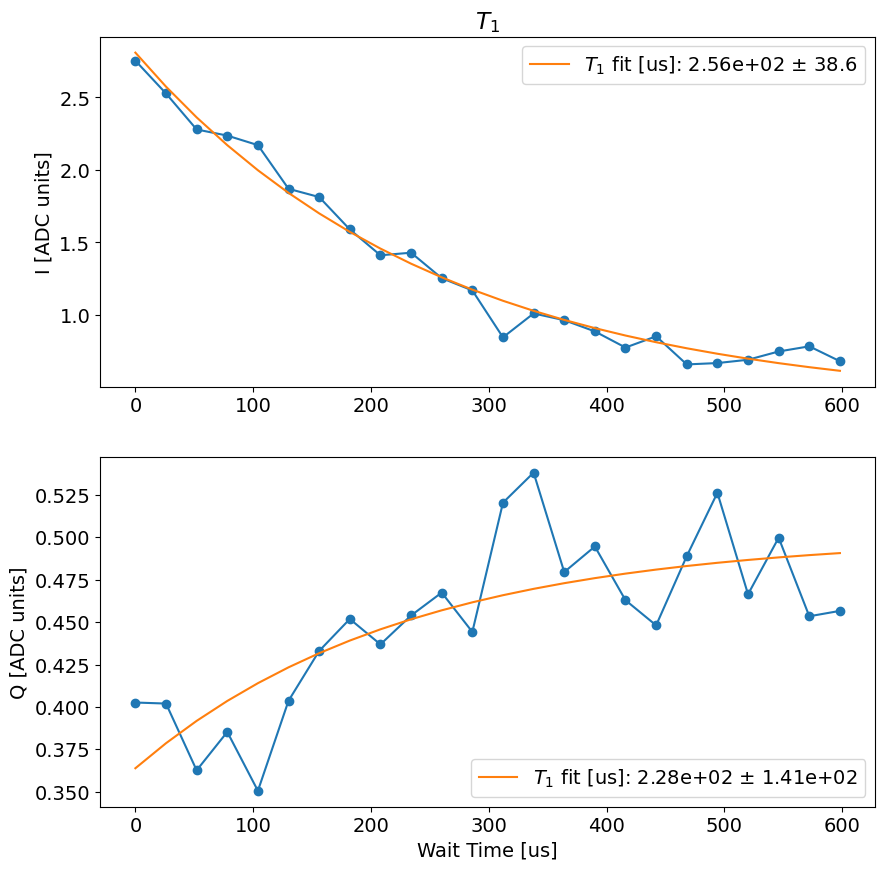

762.0623817443848


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.641143445291347
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00085_t1_qubit3.h5
Fit T1 avgi [us]: 243.248255360515
Fit T1 avgq [us]: 1330.2617225499985


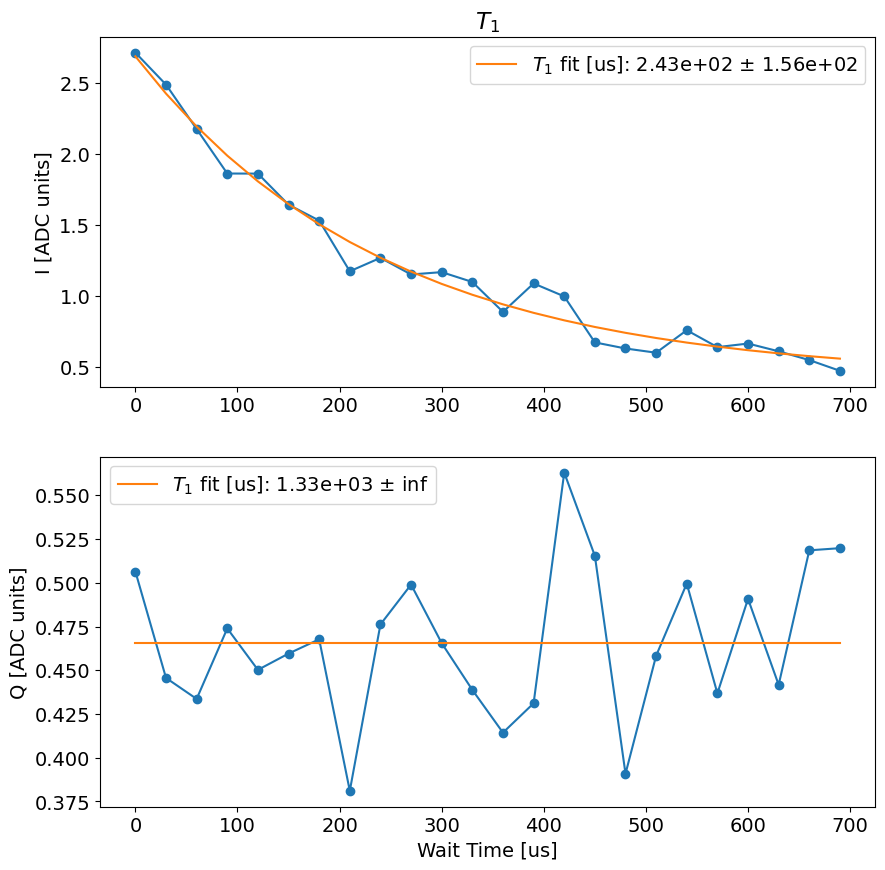

771.4406685829163


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.15592778293314064
t1_q error:fit ratio= 4.6548176974634865
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00086_t1_qubit3.h5
Fit T1 avgi [us]: 245.8253857663426
Fit T1 avgq [us]: 32.99340658506979


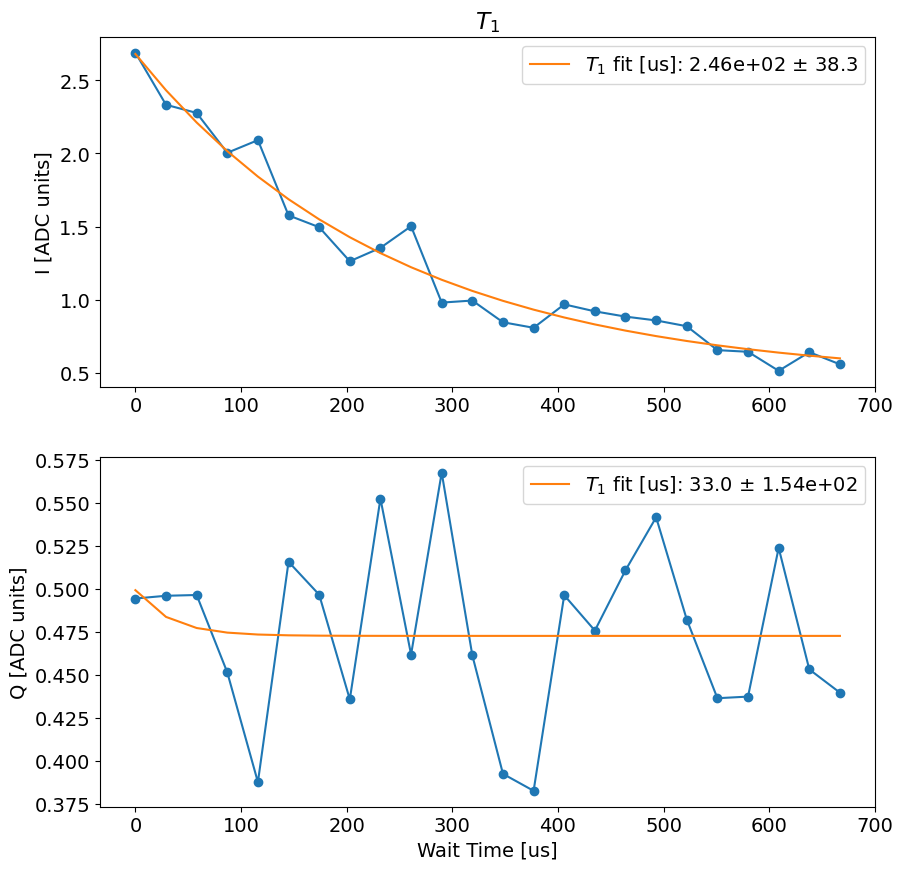

780.783931016922


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.16459193806061978
t1_q error:fit ratio= nan
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00087_t1_qubit3.h5
Fit T1 avgi [us]: 241.51071225033562
Fit T1 avgq [us]: 1.9497417527692076


c:\_Lib\python\rfsoc\elaine_rfsoc\slab_rfsoc_expts\experiments\single_qubit\t1.py:170: RuntimeWarning: invalid value encountered in sqrt
  t1_err_q = np.sqrt(data['fit_err_avgq'][3][3])
c:\_Lib\python\rfsoc\elaine_rfsoc\slab_rfsoc_expts\experiments\single_qubit\t1.py:207: RuntimeWarning: invalid value encountered in sqrt
  captionStr = f'$T_1$ fit [us]: {p[3]:.3} $\pm$ {np.sqrt(pCov[3][3]):.3}'
c:\_Lib\python\rfsoc\elaine_rfsoc\slab_rfsoc_expts\experiments\single_qubit\t1.py:211: RuntimeWarning: invalid value encountered in sqrt
  data["err_ratio_q"] = np.sqrt(data['fit_err_avgq'][3][3])/data['fit_avgq'][3]


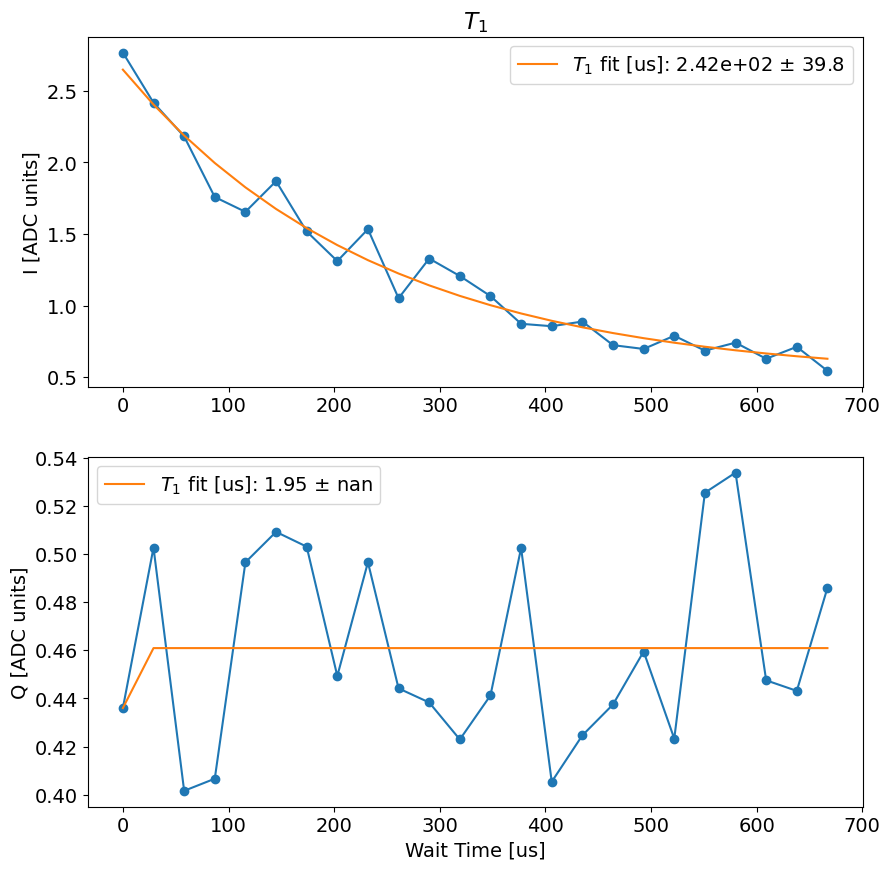

790.0963227748871


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.0
t1_q error:fit ratio= 1.4705323810562745
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00088_t1_qubit3.h5
Fit T1 avgi [us]: 344.9576884125529
Fit T1 avgq [us]: 51.23103549449234


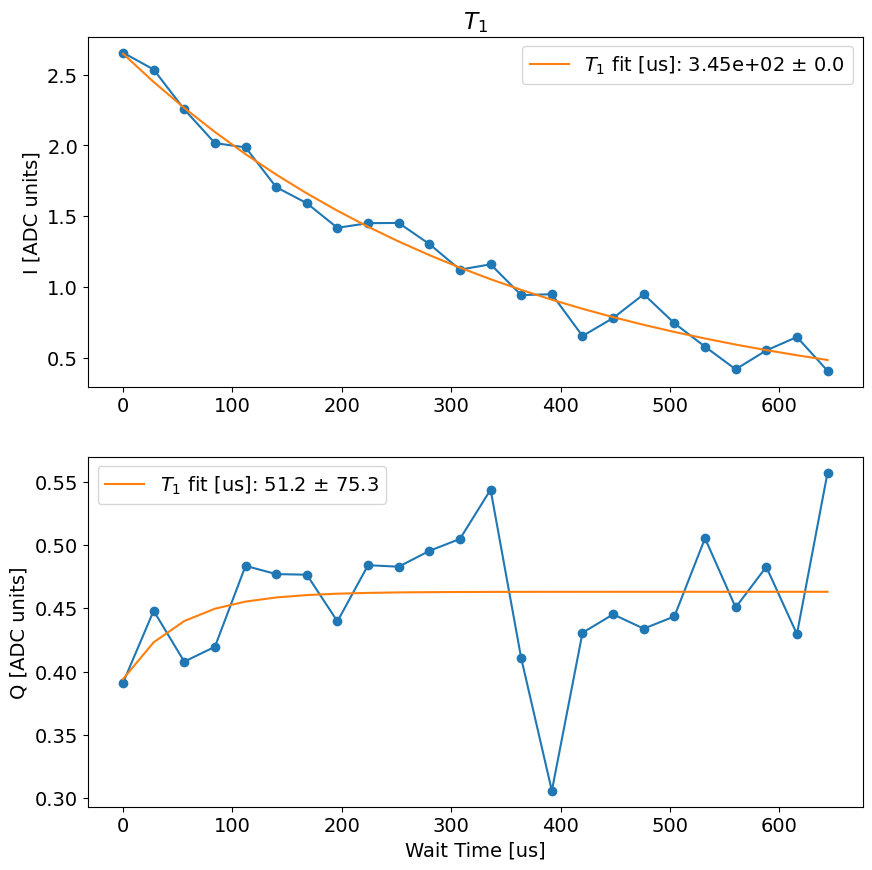

799.3063435554504


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.09072842851845087
t1_q error:fit ratio= 0.0
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00089_t1_qubit3.h5
Fit T1 avgi [us]: 202.13495434202986
Fit T1 avgq [us]: 1.3912943346458373


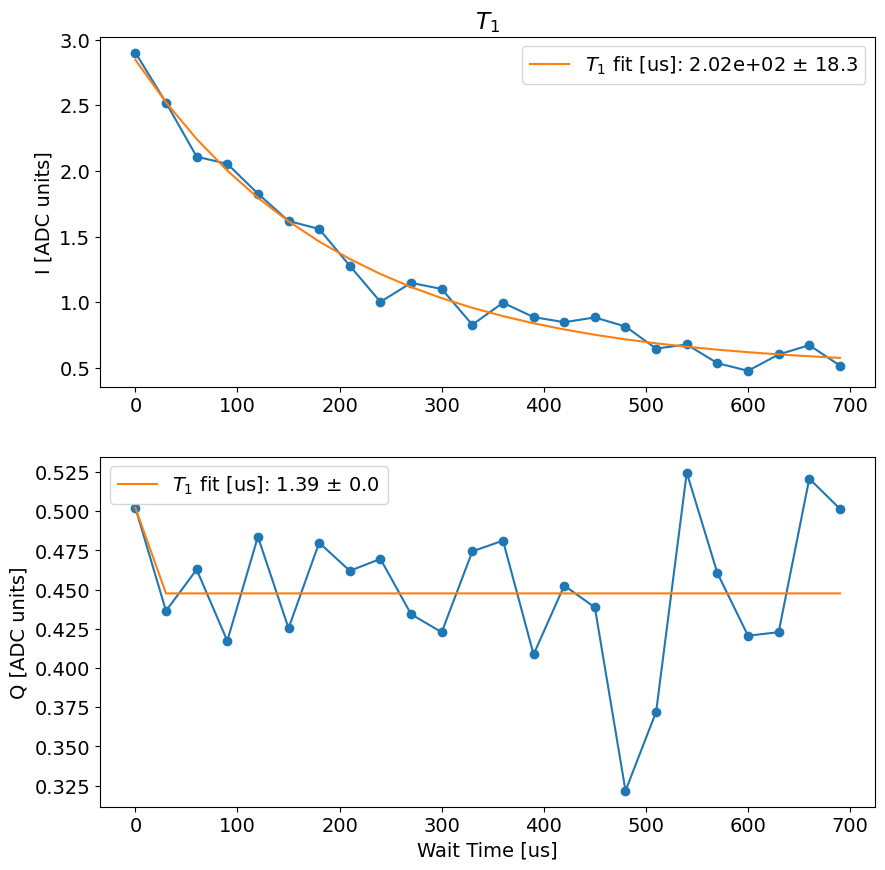

808.7342805862427


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.0
t1_q error:fit ratio= 312.690349933049
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00090_t1_qubit3.h5
Fit T1 avgi [us]: 155.6398970437198
Fit T1 avgq [us]: 26702.93346956158


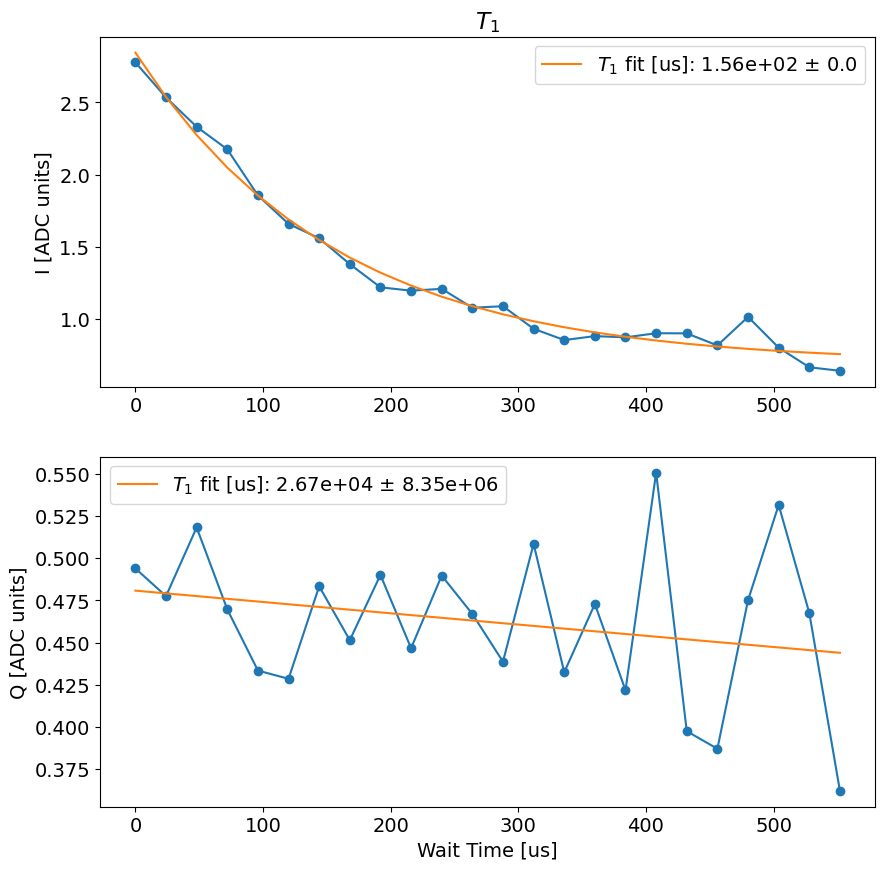

817.6729538440704


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.32997258826082543
t1_q error:fit ratio= 32216701.111165904
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00091_t1_qubit3.h5
Fit T1 avgi [us]: 211.99270927350182
Fit T1 avgq [us]: 0.8122852018329857


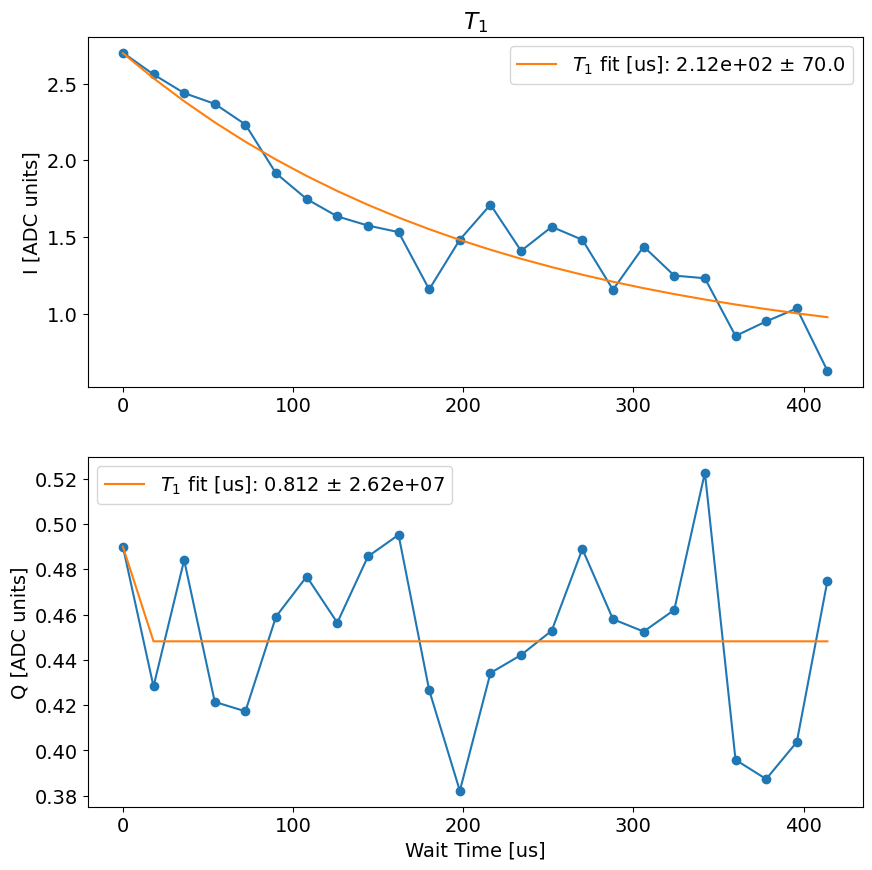

826.1395528316498


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1424361506803625
t1_q error:fit ratio= 1.690262806714174
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00092_t1_qubit3.h5
Fit T1 avgi [us]: 253.76692632389512
Fit T1 avgq [us]: 21.129375021046794


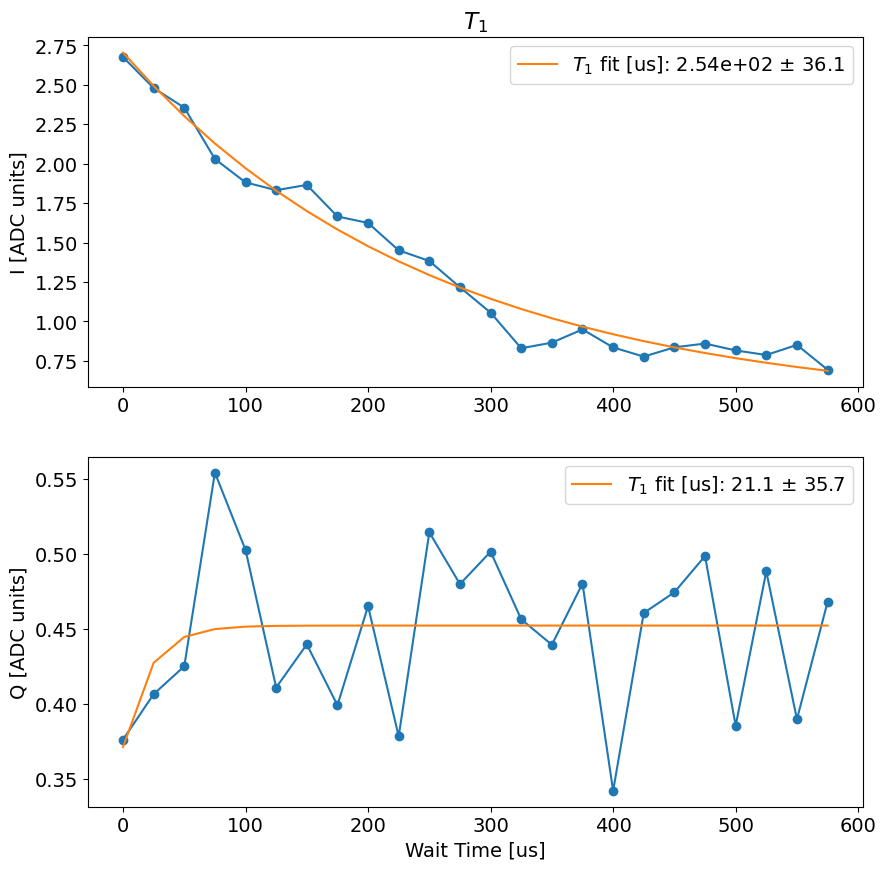

835.1033701896667


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.08783686629035502
t1_q error:fit ratio= -3.258711304345177
t1_q is better, saving t1_q to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00093_t1_qubit3.h5
Fit T1 avgi [us]: 203.35562738506192
Fit T1 avgq [us]: -61.274204390799426


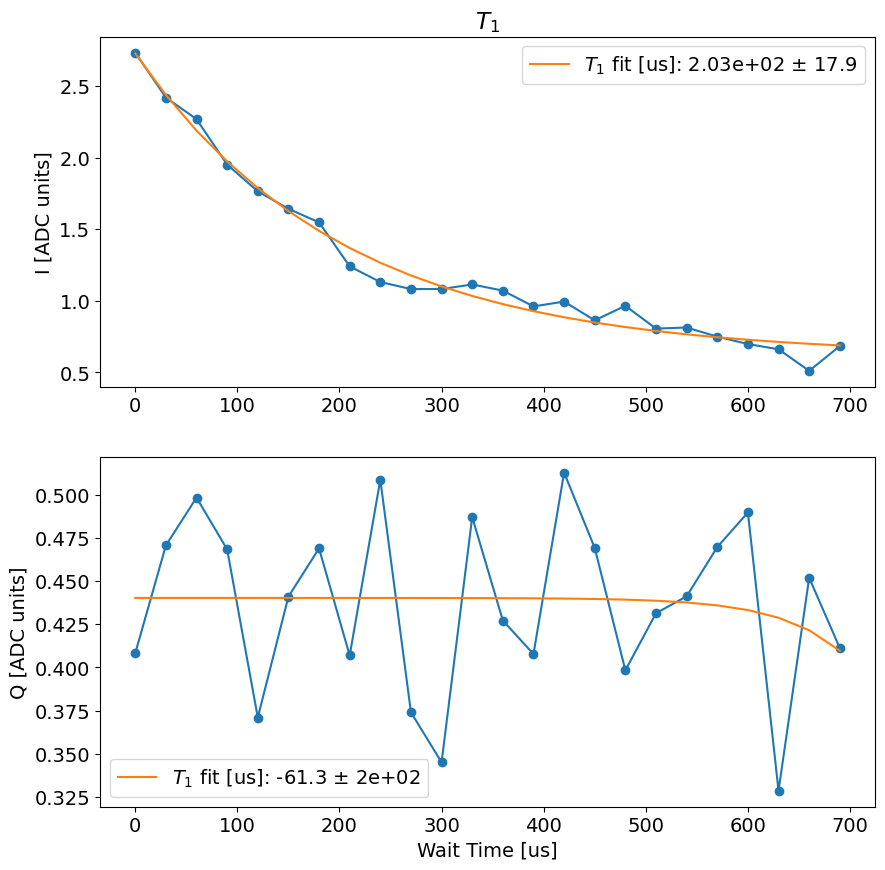

844.4492924213409


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.1406162683205431
t1_q error:fit ratio= 1859.7360319131585
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00094_t1_qubit3.h5
Fit T1 avgi [us]: 174.37108474330566
Fit T1 avgq [us]: 182847.123980742


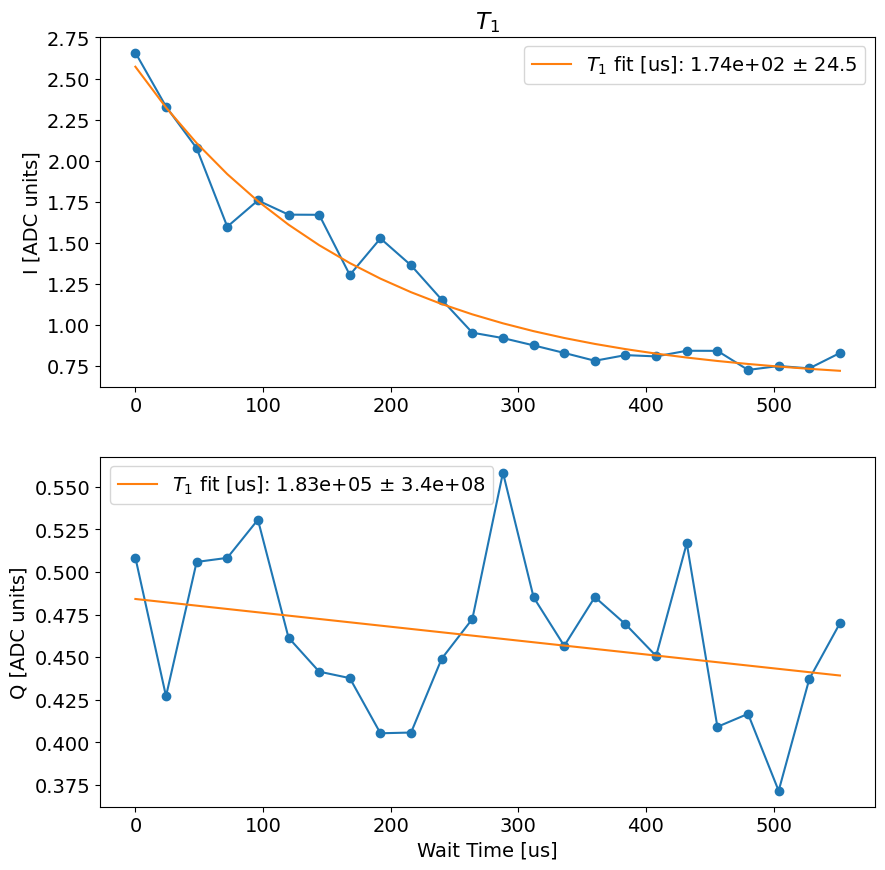

853.4010224342346


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.23110028029058893
t1_q error:fit ratio= 0.608624283640876
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00095_t1_qubit3.h5
Fit T1 avgi [us]: 314.82501319775906
Fit T1 avgq [us]: 54.13940320292517


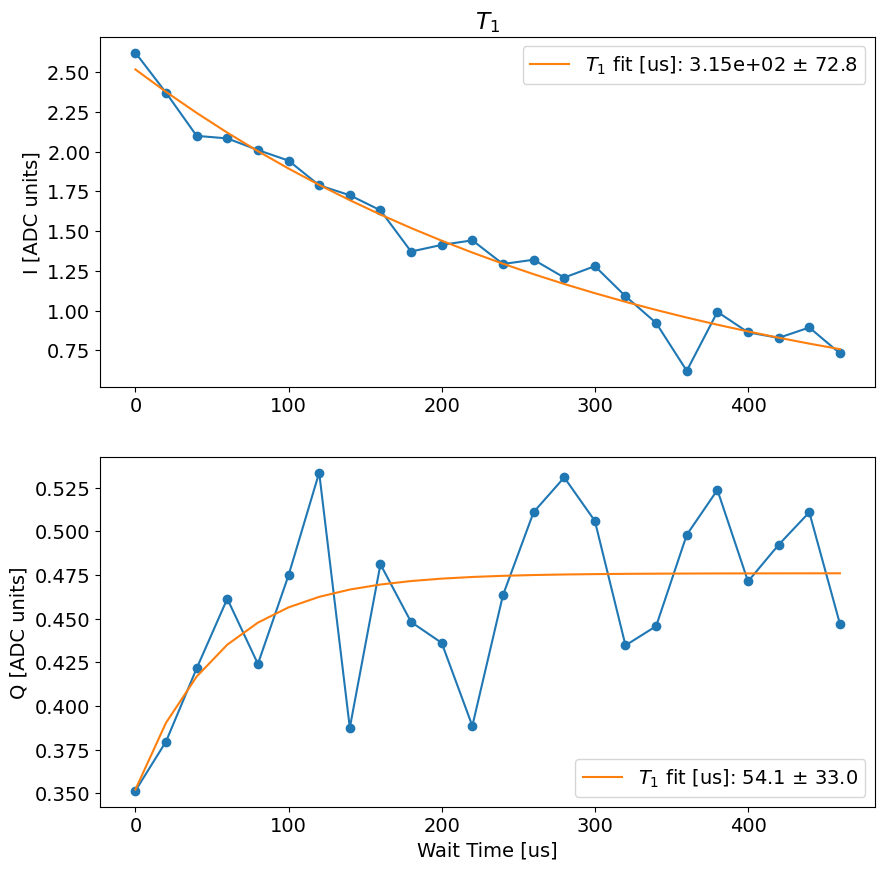

862.2307295799255


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.09408927008055915
t1_q error:fit ratio= inf
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00096_t1_qubit3.h5
Fit T1 avgi [us]: 189.0813622146419
Fit T1 avgq [us]: 88.05038634342847


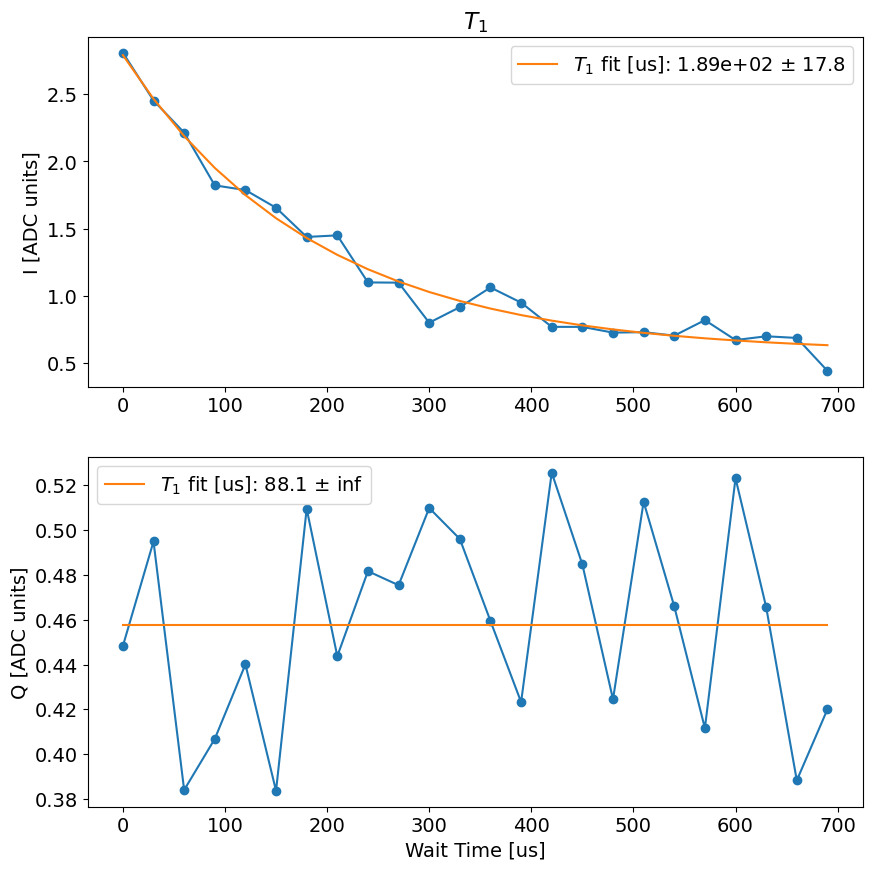

871.4467785358429


  0%|          | 0/6250 [00:00<?, ?it/s]

t1_i error:fit ratio= 0.13517924036828502
t1_q error:fit ratio= 0.746626315204928
t1_i is better, saving T1_i to results cfg file
Saving C:\_Data\LLqub2\T1_short_2024-05-14-22-34-26\00097_t1_qubit3.h5
Fit T1 avgi [us]: 203.8289833576153
Fit T1 avgq [us]: 87.26374272373731


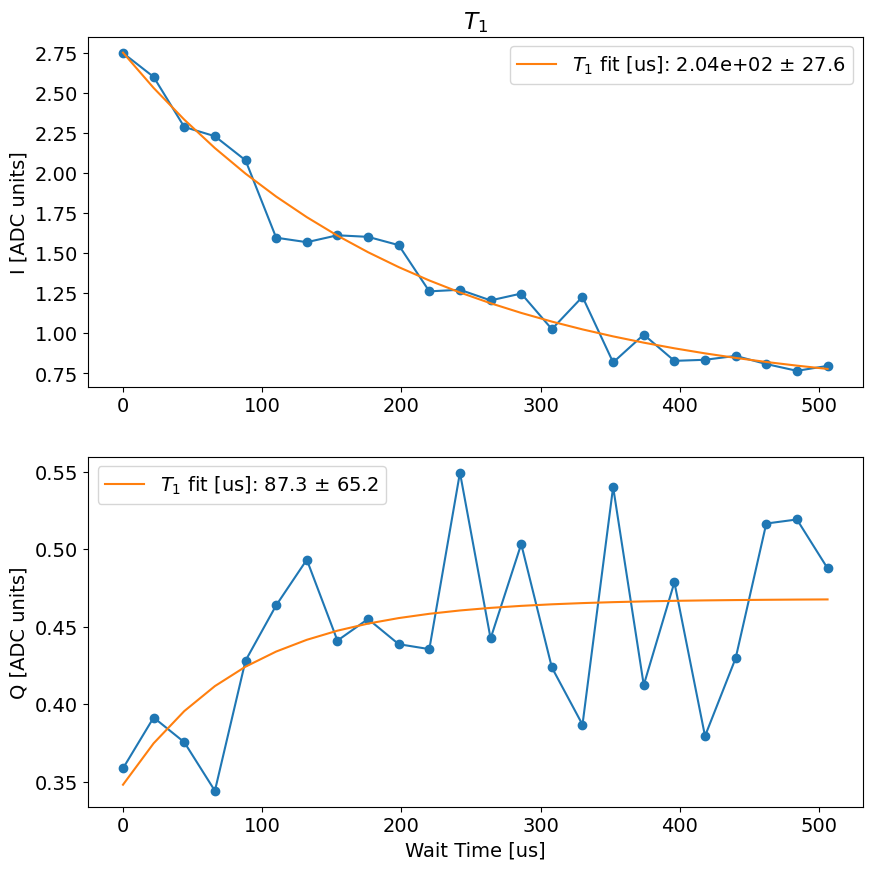

880.0406985282898


  0%|          | 0/6250 [00:00<?, ?it/s]

In [48]:
now = datetime.now()
current_time = now.strftime("%Y-%m-%d-%H-%M-%S")
pth='C:\\_Data\\LLqub2\\'
folder_name = f"T1_short_{current_time}"
os.mkdir(pth + folder_name)
expt_path = pth + folder_name + '\\'
t1_rng = [50,250]
t2_rng = [50,500]
import time
#t2_1 = 200

i=3
while True:
    shot = cfg.make_singleshot(soc, expt_path, cfg_path, i, go=True, im=im, reps=30000)
   
    config.update_readout(cfg_file, 'phase', float(shot.data['angle']), i)
    config.update_readout(cfg_file, 'threshold', float(shot.data['thresholds'][0]), i)
    
    amp_rabi = cfg.make_amprabi(soc, expt_path, cfg_path, i, go=True, im=im, npts=20, reps=200)       
    auto_cfg = config.update_qubit(cfg_file, ('pulses','pi_ge','gain'), int(amp_rabi.data['pi_length']), i) 
    
    npts = 30
    t2r=cfg.make_t2r(soc, expt_path, cfg_path, i, go=True, im=im, ramsey_freq=npts/t2_1/8, npts=npts, reps=250, step=t2_1/npts)    
    auto_cfg = config.update_qubit(cfg_file, 'f_ge', float(t2r.data['new_freq']), i)
    t2_1 = in_rng(t2r.data['fit_avgi'][3], t2_rng)

    npts=25
    start = time.time()
    new_t1 = 200
    for j in range(1000):       
        t1 = cfg.make_t1(soc, expt_path, cfg_path, i, go=True, im=im, npts=npts, reps=250, span=3*new_t1)
        end = time.time()
        print(end-start)
        new_t1 = int(in_rng(t1.data['fit_avgi'][3], t1_rng))
        


### Continuous short T1 scans

In [46]:
while True:   
    t1 = cfg.make_t1(soc, expt_path, cfg_path, i, npts=25, reps=250)
    t1.go(analyze=True, display=True, progress=True, save=True)

IndexError: list index out of range

In [ ]:
i=3
t1 = cfg.make_t1_2d(soc, tuning_path, cfg_path, i, go=True, im=im, npts=npts, reps=250, span=3*new_t1, sweep_pts=10)


### Set up 2D scans

In [12]:
qubit_i = 0
qubit_j = 4
# Function to run T1 continuous measurement
def run_continuous_t1(qubit_i, qubit_j, t1A, t1B):
    t1_cont = meas.T1_2qbContinuous(
        soccfg=soc,
        path=expt_path,
        prefix=f"t1_continuous_2qubit{qubit_i, qubit_j}",
        config_file=cfg_path,
    )
    npts = 1

    t1_cont.cfg.expt = dict(
        startA= t1A / npts,  # wait time [us]
        startB = t1B / npts,  # wait time [us]
        step=0,
        expts=npts,
        reps=5000,  # number of times we repeat a time point
        rounds=1,  # number of start to finish sweeps to average over
        qubits=[qubit_i, qubit_j],
    )

    t1_cont.go(analyze=False, display=False, progress=True, save=True)

# Function to run T1 experiment for recalibration
def run_t1_recalibration(qubit_i, qubit_j):
    t1 = meas.T1_2qbExperiment(
        soccfg=soc,
        path=expt_path,
        prefix=f"t1_2qubit{qubit_i, qubit_j}",
        config_file=cfg_path,
    )

    span = 600
    npts = 20

    t1.cfg.expt = dict(
        startA=0,  # wait time [us]
        startB=0,  # wait time [us]
        step=span / npts,
        expts=npts,
        reps=200,  # number of times we repeat a time point
        rounds=1,  # number of start to finish sweeps to average over
        qubits= [qubit_i, qubit_j],
        length_scan=span,  # length of the scan in us
        num_saved_points=1,  # number of points to save for the T1 continuous scan
    )

    t1.go(analyze=False, display=False, progress=True, save=True)
    return t1
    #t1.analyze(fit=True)
    #t1_fit_ia =t1.data['fit_avgia'][3]
    #t1_fit_ib = t1.data['fit_avgib'][3]
 


In [37]:
t1 = meas.T1_2qbExperiment(
    soccfg=soc,
    path=expt_path,
    prefix=f"t1_2qubit{qubit_i, qubit_j}",
    config_file=cfg_path,
)

span = 600
npts = 20

t1.cfg.expt = dict(
    startA=0,  # wait time [us]
    startB=0,  # wait time [us]
    step=int(span / npts),
    expts=npts,
    reps=200,  # number of times we repeat a time point
    rounds=1,  # number of start to finish sweeps to average over
    qubits= [qubit_i, qubit_j],
    length_scan=span,  # length of the scan in us
    num_saved_points=1,  # number of points to save for the T1 continuous scan
)


  0%|          | 0/200 [00:00<?, ?it/s]

IndexError: index 1 is out of bounds for axis 0 with size 1

In [38]:

t1.go(analyze=False, display=False, progress=True, save=False)
t1.analyze(fit=True)
t1_fit_ia =t1.data['fit_avgia'][3]
t1_fit_ib = t1.data['fit_avgib'][3]

  0%|          | 0/200 [00:00<?, ?it/s]

KeyError: 'xptsA'

In [34]:
t1_cont = meas.T1_2qbContinuous(
    soccfg=soc,
    path=expt_path,
    prefix=f"t1_continuous_2qubit{qubit_i, qubit_j}",
    config_file=cfg_path,
)

spanA = auto_cfg.device.qubit.T1[qubit_i]
spanB = auto_cfg.device.qubit.T1[qubit_j]
npts = 1

t1_cont.cfg.expt = dict(
    startA= spanA / npts,  # wait time [us]
    startB = spanB / npts,  # wait time [us]
    step=0,
    expts=npts,
    reps=5000,  # number of times we repeat a time point
    rounds=1,  # number of start to finish sweeps to average over
    qubits=[qubit_i, qubit_j],
)


  0%|          | 0/5000 [00:00<?, ?it/s]

AttributeError: 'list' object has no attribute 'encode'

In [ ]:
# Main script
qubit_i = 0
t1_raw_ia = np.array([])
t1_raw_ib =  np.array([])
start_time = timer()

while True:  # Run continuously
    # Run continuous T1 measurement
    t1_raw_ib, t1_raw_ia = np.append(run_continuous_t1(qubit_i, t1_raw_ia, t1_raw_ib), t1_raw_ia, t1_raw_ib)

    end_time = timer()
    if end_time - start_time >= 30:
        print( end_time - start_time, 'has passed. Running T1 recalibration.')
        # Run T1 experiment for recalibration
        t1 = run_t1_recalibration(qubit_i, qubit_j)
        start_time = timer()  # Reset the start time after recalibration


In [21]:
t1 = run_t1_recalibration(qubit_i, qubit_j)

  0%|          | 0/200 [00:00<?, ?it/s]

ValueError: not enough values to unpack (expected 3, got 2)